This notebook contains a preliminary exploratory data analysis od the Bitcoin-Blockchain Dataset

In [1]:
%matplotlib inline
import numpy as np
import os
import re
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
import seaborn as sns
from statsmodels.graphics import tsaplots #statistical package for ACF and PACF
import statsmodels.api as sm 
from statsmodels.api import OLS
import statsmodels.tsa.stattools as tsa  
plt.style.use('bmh')
from sklearn.metrics import median_absolute_error, mean_squared_error, mean_squared_log_error
from sklearn.metrics import r2_score, median_absolute_error, mean_absolute_error
from pandas.plotting import autocorrelation_plot #autocorrelation plot in Pandas
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 15, 6
import matplotlib.ticker as mticker
from statsmodels.tsa.arima_model import ARIMA
import statsmodels.tsa.api as smtsa
from itertools import product                    # some useful functions
from tqdm import tqdm_notebook
from scipy import stats
from pandas.plotting import lag_plot
from mpl_finance import candlestick_ohlc
import matplotlib.dates as mdates
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.api import VAR


In [2]:
#set working directory

os.chdir('C:/Users/Andrea/Jupyter Notebooks/Master Thesis')

In [3]:
#display the full list of datasource in the working directory

from subprocess import check_output
print(check_output(["ls", "../Master Thesis"]).decode("utf8"))

 Bitcoin-Blockchain Web scaping.ipynb
ACF_&_PACF_raw_BTC_Close.png
ACF_&_PACF_raw_BTC_Log_Close_diff.png
Arima_212_in_sample_pred
Arima_212_in_sample_pred.png
Arima_212_in_sample_pred_diff.png
Arima_212_out_of_sample_forecast.png
Arima_212_resid_ACF_PACF.png
Arima_212_resid_distr.png
Arima_212_resid_plot.png
Arima_212_Validation_set_pred.png
arima_summary_212.png
arima_summary_312.png
Arimax_212_Fitted values.png
bitcoin_blockchain_dataset.csv
bitcoin_price.csv
bitcoincash_price.csv
BitcoinOHLC.png
bitconnect_price.csv
BTC_blockchain_lag_0_corr_not_stationary.png
BTC_blockchain_lag_0_corr_stationary.png
bTC_blockchain_lag_1_corr_not_stationary.png
bTC_blockchain_lag_1_corr_stationary.png
BTCClose.png
BTCClose_Aggregated_mean.png
BTCClose_Rolling_mean.png
Cerchiello Dataset Preprocessing and EDA.ipynb
Cerchiello_First_Dataset.xlsx
Cerchiello_First_Dataset_1.xlsx
Close_volume_plot.png
dash_price.csv
Data acquisition Crypto.ipynb
EDA Bitcoin-Blockchain Dataset.ipynb
EDA Bitcoin 2-min.ipyn

Exploratory Data Analysis Bitcoin price dataset

In [4]:
#load the file

btc_price = pd.read_csv('bitcoin_price.csv', parse_dates = ['Date'], index_col = 'Date')


In [5]:
#preprocessing
btc_price.columns = ['Open', 'High', 'Low', 'Close', 'Volume', 'Market_Cap']
btc_price['Volume_mil'] = pd.to_numeric(btc_price['Volume'].str.replace(",","").str.replace("-","")).div(1e6)
btc_price['Market_Cap_mil'] = pd.to_numeric(btc_price['Market_Cap'].str.replace(",","").str.replace("-","")).div(1e6)
btc_price.sort_index(inplace=True)
btc_price.drop(['Volume', 'Market_Cap'], axis = 1, inplace=True)

In [207]:
btc_price.set_index(pd.date_range(start = btc_price.index[0], end = btc_price.index[-1], freq = 'D'), inplace=True)

In [5]:
btc_price.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2214 entries, 2013-04-28 to 2019-05-20
Data columns (total 6 columns):
Open              2214 non-null float64
High              2214 non-null float64
Low               2214 non-null float64
Close             2214 non-null float64
Volume_mil        1971 non-null float64
Market_Cap_mil    2214 non-null float64
dtypes: float64(6)
memory usage: 121.1 KB


In [283]:
btc_price.head()

,Open,High,Low,Close,Volume_mil,Market_Cap_mil
Date,,,,,,
2013-04-28,135.30,135.98,132.10,134.21,NaN,1488.566728
2013-04-29,134.44,147.49,134.00,144.54,NaN,1603.768865
2013-04-30,144.00,146.93,134.05,139.00,NaN,1542.813125
2013-05-01,139.00,139.89,107.72,116.99,NaN,1298.954594
2013-05-02,116.38,125.60,92.28,105.21,NaN,1168.517495


In [263]:
print(btc_price.Market_Cap_mil.describe())

count      2214.000000
mean      40879.727625
std       57433.984136
min         778.411179
25%        4806.462365
50%        9287.685138
75%       67792.486850
max      326502.485530
Name: Market_Cap_mil, dtype: float64


In [41]:
np.argmax(btc_price.High)

D:\andrea\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:56: FutureWarning: 
The current behaviour of 'Series.argmax' is deprecated, use 'idxmax'
instead.
The behavior of 'argmax' will be corrected to return the positional
maximum in the future. For now, use 'series.values.argmax' or
'np.argmax(np.array(values))' to get the position of the maximum
row.
  return getattr(obj, method)(*args, **kwds)


Timestamp('2017-12-17 00:00:00')

In [9]:
f"The Time Series goes from {btc_price.index.min()} to {btc_price.index.max()}"

'The Time Series goes from 2013-04-28 00:00:00 to 2019-05-20 00:00:00'

In [122]:
f"The Time Series is composed of {len(btc_price)} data points."

'The Time Series is composed of 2214 data points.'

In [5]:
# check for null values across columns
#percentage of missing value across column
btc_price.isnull().sum(axis = 0).div(len(btc_price))

Open              0.000000
High              0.000000
Low               0.000000
Close             0.000000
Volume_mil        0.109756
Market_Cap_mil    0.000000
dtype: float64

In [34]:
Btc_Volume = btc_price['Volume_mil'].resample('10D').sum()

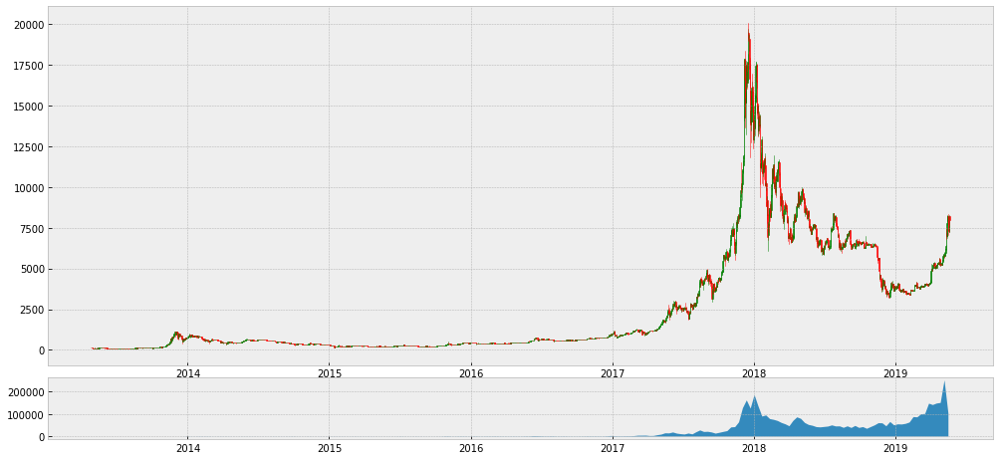

In [39]:
idx = btc_price.index
BitcoinOHLC = btc_price[['Open','High','Low','Close']].reset_index()
BitcoinOHLC['Date'] = idx
BitcoinOHLC['Date'] = BitcoinOHLC['Date'].map(mdates.date2num)
fig = plt.figure(figsize=(17, 8))
ax1 = plt.subplot2grid((6,1), (0,0), rowspan=5, colspan=1)
ax2 = plt.subplot2grid((6,1), (5,0), rowspan=1, colspan=1,sharex=ax1)
ax1.xaxis_date()
candlestick_ohlc(ax1, BitcoinOHLC.values, width=2, colorup='g')
ax2.fill_between(Btc_Volume.index.map(mdates.date2num),Btc_Volume.values,0)
plt.savefig('BitcoinOHLC.png', format='png', dpi=300)

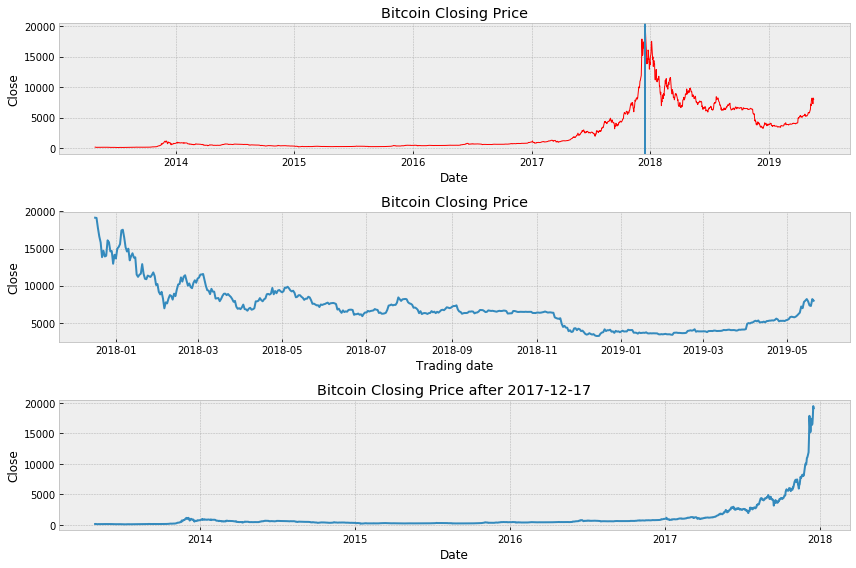

In [53]:

#improve the x_ticks dates labels and plot on top of that smoothed time series
fig, ax = plt.subplots(3,1,figsize=(12,8))

plt.subplot(311)
plt.plot(btc_price.Close, color = 'red', linewidth = 1)
plt.xlabel('Date')
plt.ylabel('Close')
plt.title('Bitcoin Closing Price')
plt.axvline('2017-12-17') #add vertical line
#ax.axvspan('2018-09-05','2018-09-07') #highlight vertical section

plt.subplot(312)
plt.plot(btc_price.Close['2017-12-17':])
plt.title('Bitcoin Closing Price')
plt.ylabel('Close')
plt.xlabel('Trading date')


plt.subplot(313)
plt.plot(btc_price.Close[:'2017-12-17'])
plt.title('Bitcoin Closing Price after 2017-12-17')
plt.ylabel('Close')
plt.xlabel('Date')
plt.tight_layout()
plt.savefig('BTCClose.png', format='png', dpi=300)

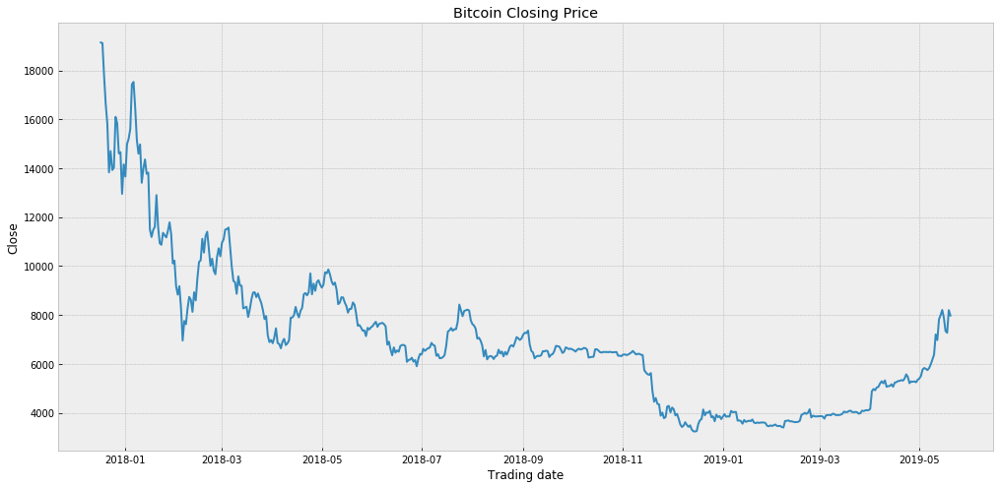

In [43]:
#using matplotlib
plt.figure(figsize=(17, 8))
plt.plot(btc_price.Close['2017-12-17':])
plt.title('Bitcoin Closing Price')
plt.ylabel('Close')
plt.xlabel('Trading date')
plt.grid(True)
plt.show()


#At a first glance, bitcoin seems to be quite stable  and calm before 2017. Though, higher scale on more recent level might hide the early fluctuation.
#Therefore, I am going to split and visulaize the series before it rised.

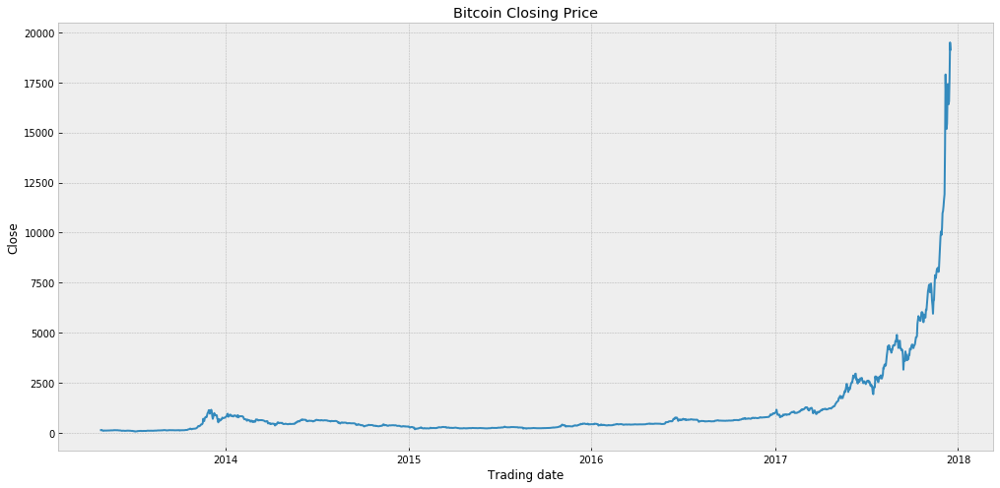

In [44]:
#using matplotlib
plt.figure(figsize=(17, 8))
plt.plot(btc_price.Close[:'2017-12-17'])
plt.title('Bitcoin Closing Price')
plt.ylabel('Close')
plt.xlabel('Trading date')
plt.grid(True)
plt.show()

In [ ]:
#daily perc diff closing,(work with return)

daily_perc_diff_close = btc_price.Close.pct_change()
daily_perc_diff_close


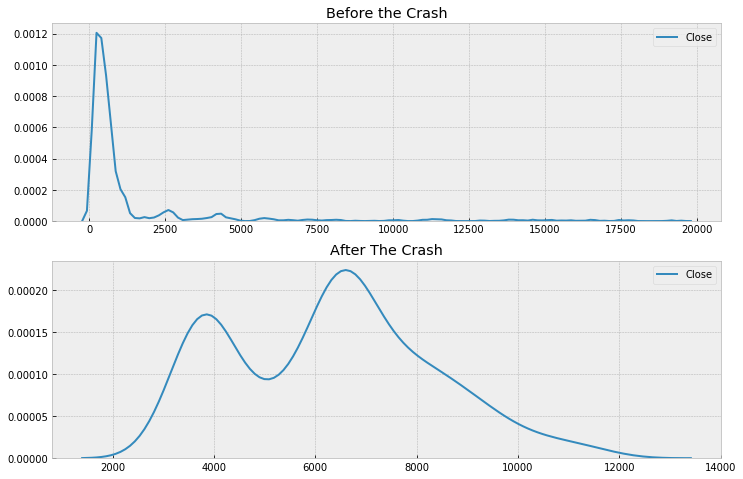

In [8]:
# Display density plot to approximate the probability ditribution of the price: it seems to be two different ditributions
#split data before and after the drop and show on two subplots the different distibution
plt.subplots(2,1, figsize = (12,8))
plt.subplot(211)
sns.kdeplot(btc_price.Close[:'2018-01-31'])
plt.title('Before the Crash')
plt.subplot(212)
sns.kdeplot(btc_price.Close['2018-01-31':])
plt.title('After The Crash')
plt.savefig('Before and after hype.png', format='png', dpi=300)

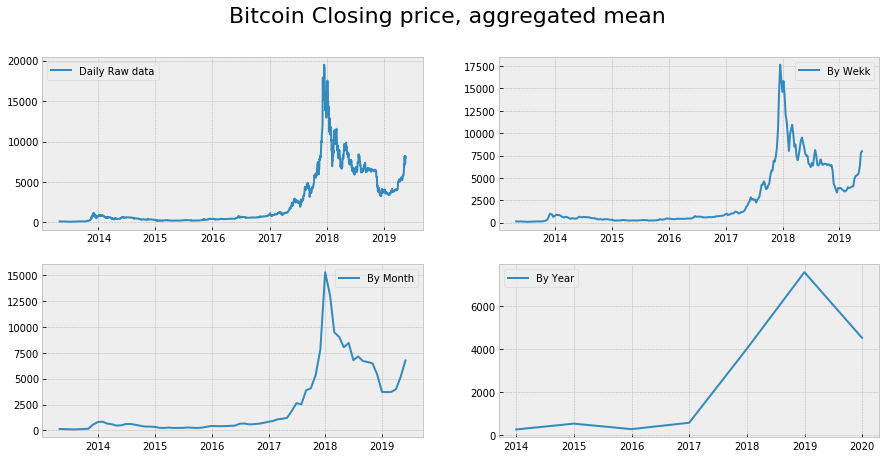

In [54]:
#aggreagte mean of Bitcoin Closing Price

plt.subplots(2,2, figsize = (15,7))
plt.suptitle('Bitcoin Closing price, aggregated mean', fontsize = 22)

plt.subplot(221)
plt.plot(btc_price.Close,'-', label = 'Daily Raw data')
plt.legend()

plt.subplot(222)
plt.plot(btc_price.Close.resample('W').mean(), label = "By Wekk")
plt.legend()


plt.subplot(223)
plt.plot(btc_price.Close.resample('M').mean(), label = "By Month")
plt.legend()

plt.subplot(224)
plt.plot(btc_price.Close.resample('Y').mean(), label = "By Year")
plt.legend()
plt.savefig('BTCClose_Aggregated_mean.png', format='png', dpi=300)

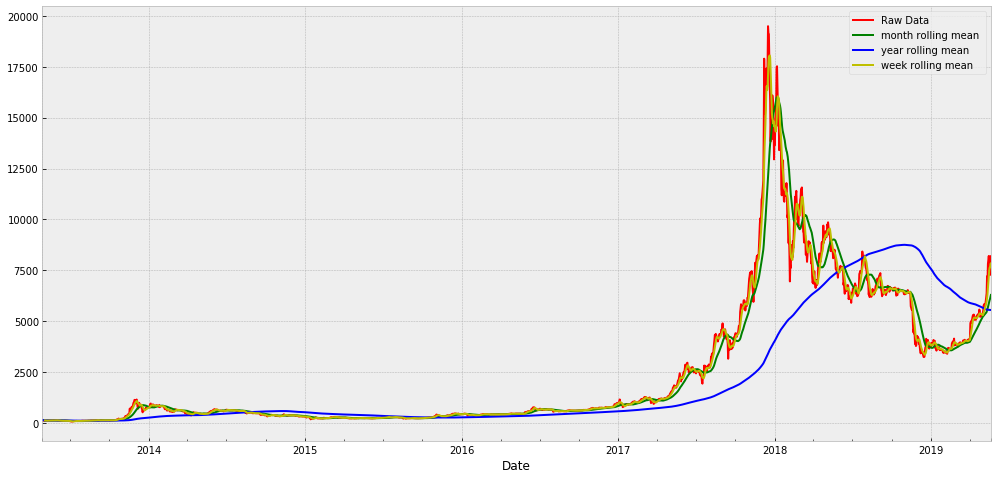

In [55]:
#rolling statistics
weekly_mean_closing = btc_price.Close.rolling(window = 7).mean()
montly_mean_closing = btc_price.Close.rolling('30D').mean()
yearly_mean_closing = btc_price.Close.rolling('365D').mean()
fig = plt.figure(figsize=(17,8))
ax = fig.add_subplot(1,1,1)
btc_price.Close.plot(ax = ax, color = 'r', label = 'Raw Data')
montly_mean_closing.plot(ax = ax, color = 'g', label = 'month rolling mean ')
yearly_mean_closing.plot(ax = ax, color = 'b', label = 'year rolling mean ')
weekly_mean_closing.plot(ax = ax, color = 'y', label = 'week rolling mean')
ax.legend()
plt.savefig('BTCClose_Rolling_mean.png', format='png', dpi=300)

D:\andrea\Anaconda3\lib\site-packages\pandas\plotting\_converter.py:129: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


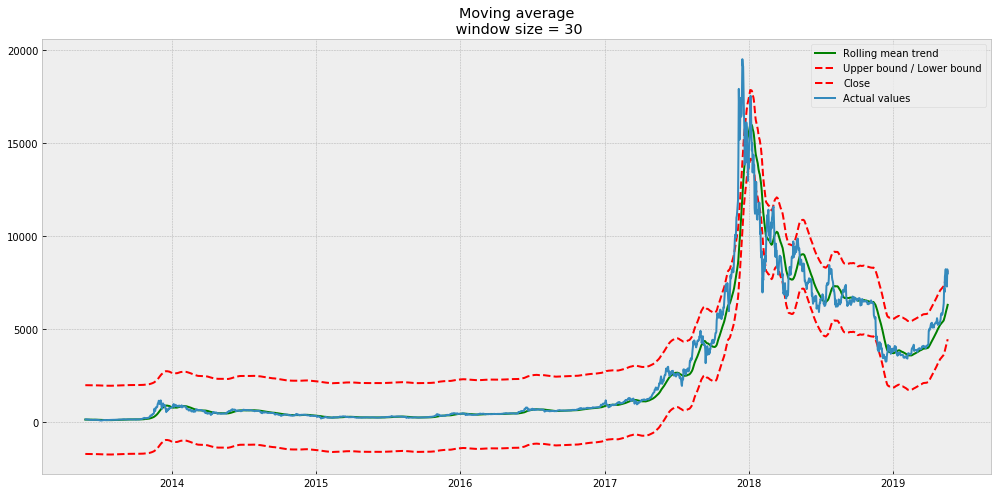

In [6]:
# define a function to compute the moving average, I can change this function to accomodate just
# a standard deviation boudaries

# This function assumes that windows is a numeric value (number of periods in the datetime index)

def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def plot_moving_average(series, window, plot_intervals = False, scale = 1.96):
    rolling_mean = series.rolling(window = window).mean()
    plt.figure(figsize=(17,8))
    plt.title('Moving average\n window size = {}'.format(window))
    plt.plot(rolling_mean, 'g', label='Rolling mean trend')
    
    #Plot confidence intervals for smoothed values
    if plot_intervals:
        mae = mean_absolute_error(series[window:], rolling_mean[window:])
        deviation = np.std(series[window:] - rolling_mean[window:])
        lower_bound = rolling_mean - (mae + scale * deviation)
        upper_bound = rolling_mean + (mae + scale * deviation)
        plt.plot(upper_bound, 'r--', label='Upper bound / Lower bound')
        plt.plot(lower_bound, 'r--')
            
    plt.plot(series[window:], label='Actual values')
    plt.legend(loc='best')
    plt.grid(True)


plot_moving_average(btc_price.Close, 30, plot_intervals=True)

In [ ]:
#rolling statistics across weeks, month and quarters (mean, median, std)

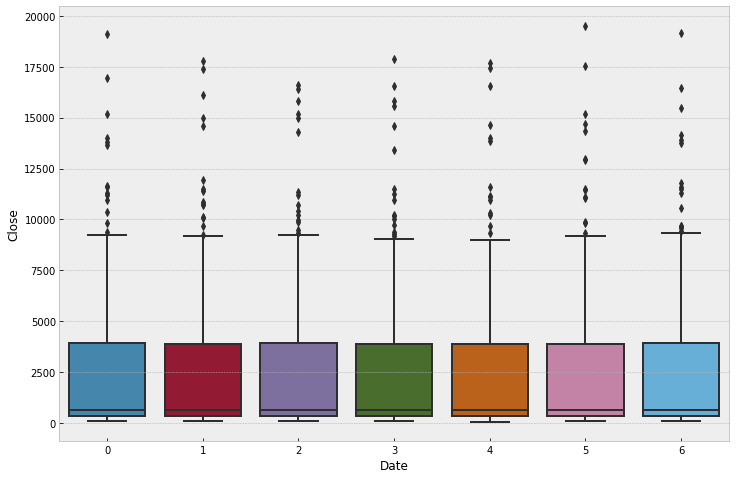

In [57]:
#maybe there is a weekly seasonality
fig, ax = plt.subplots(figsize = (12,8))
ax = sns.boxplot(data=btc_price, y = 'Close', x= btc_price.index.dayofweek)
ax.x_label = ['Mon', 'Tues', 'Wed', 'Thurs', 'Fri', 'Sat', 'Sun'] #make it work
plt.savefig('Weekly_Box_plot.png', format='png', dpi=300)

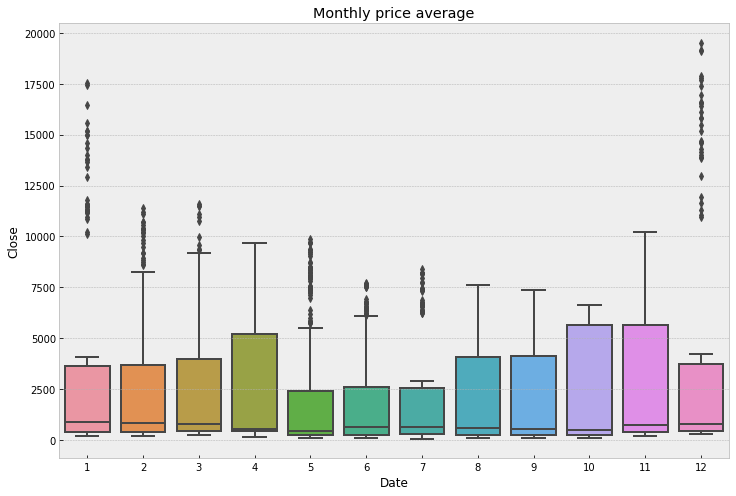

In [58]:
#plot daily box-plots

fig, ax = plt.subplots(figsize=(12,8))
ax = sns.boxplot(data =btc_price, y = 'Close', x = btc_price.index.month)
ax.set_title('Monthly price average')
plt.savefig('Monthly_Box_plot.png', format='png', dpi=300)

In [ ]:
#candlestick


fig = plt.figure(figsize=(12,8))
ax1 = plt.subplot2grid((1,1), (0,0))
#cretae Date column for running this code
ohlc = []
for ind, row in btc_price.iterrows():
    ol = [btc_price.index[ind] ,row['Open'], row['High'], row['Low'], row['Close'], row['Volume']]
    ohlc.append(ol)
    
candlestick_ohlc(ax1, ohlc, width=0.4, colorup='#77d879', colordown='#db3f3f')
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
ax1.xaxis.set_major_locator(mticker.MaxNLocator(10))

plt.xlabel("Date", fontsize=12)
plt.ylabel("Price in USD", fontsize=12)
plt.title("Candlestick chart for Bitcoin", fontsize=15)
plt.subplots_adjust(left=0.09, bottom=0.20, right=0.94, top=0.90, wspace=0.2, hspace=0)
plt.show()

Volume

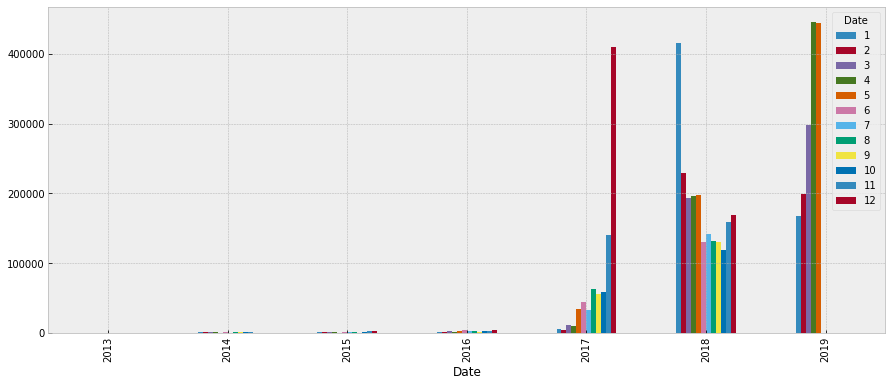

In [74]:
#aggreagate volume by year and month
month_sum_vol = btc_price.Volume_mil.groupby([btc_price.index.year, btc_price.index.month]).sum()
month_sum_vol.unstack(level = 1).plot(kind = 'bar')
plt.savefig('Volume_hist.png', format='png', dpi=300)

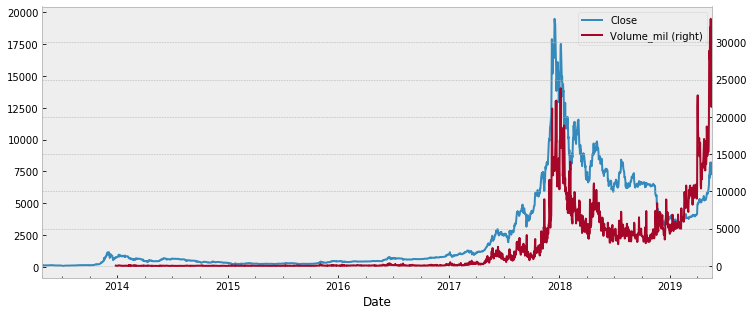

In [73]:


btc_price[['Close', 'Volume_mil']].plot(secondary_y = 'Volume_mil', figsize = (12,5))
plt.savefig('Close_volume_plot.png', format='png', dpi=300)

Text(0.5, 0, 'BTC close 1-day percent change')

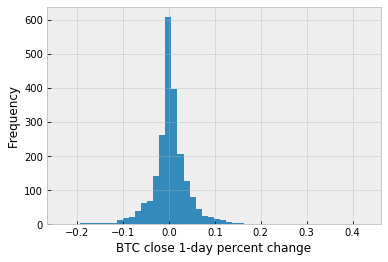

In [15]:
#histogram of daily price pct_change
# autocorrelation of aggreagted price (weekly, monthly)

btc_price['Close'].pct_change().plot.hist(bins=50)
plt.xlabel('BTC close 1-day percent change')


Market Capitalization

Seasonality decomposition (try to detrend the data before computing those statistics)

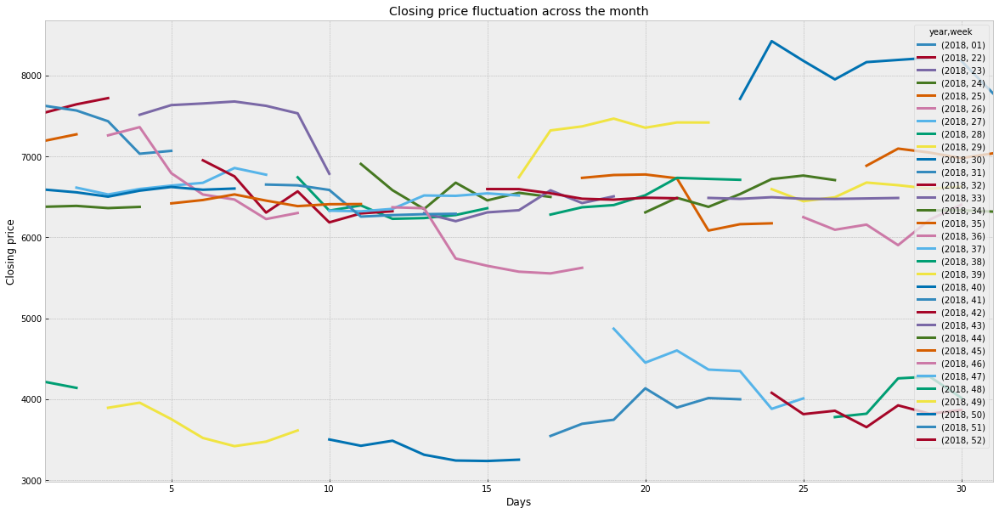

In [72]:
#seasonal subseries plot of  mean aggreagate values

#vertical axis = response variable

#horizontal axis = Horizontal time ordered by season. For example with monthly data all januarry value are plotted


#The user must specify the length of the seasonal pattern before generating this plot


# try to run this plor after de-trending the series

#questions:
#Do the data exibit a seasonal pattern?
#Is there a within-group pattern
#are there any outliers once seasonality is accounted for?

#take as reference just year 2018
btc_close_2017 = btc_price['2018-06':'2018-12']
weekly_seasonality = pd.DataFrame(btc_close_2017.Close, index = btc_close_2017.index)
weekly_seasonality['week'] = weekly_seasonality.index.strftime("%V")
weekly_seasonality['year'] = weekly_seasonality.index.year
weekly_seasonality['month'] = weekly_seasonality.index.month
weekly_seasonality['day'] = weekly_seasonality.index.day


spivot = pd.pivot_table(weekly_seasonality, columns=['year', 'week'], index=['day'], values='Close', aggfunc=np.sum)

spivot.plot(figsize=(20,10), linewidth=3)
plt.title('Closing price fluctuation across the month')
plt.xlabel('Days')
plt.ylabel('Closing price')
plt.savefig('Weekly_price_2018.png', format='png', dpi=300)

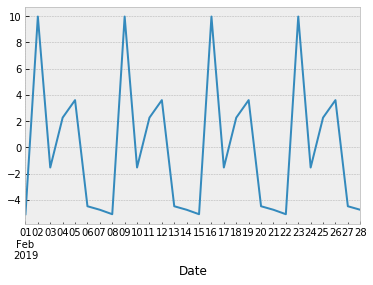

In [38]:
#seasonal decomposition

#Decomposition function works with daily value,  and hourly value, but it doesn't work with minute frequency

# Hour Mid-market-price decomposition
closing_price_decomposition = sm.tsa.seasonal_decompose(btc_price.Close, freq=7)
closing_price_decomposition.seasonal['2019-02'].plot()

Autocorrelation structure: autocorrelation, partial autocorrelation

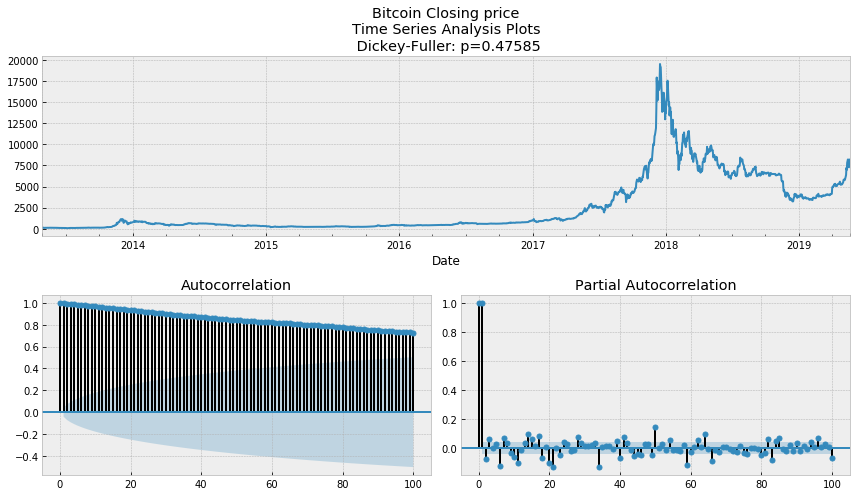

In [5]:
#function taken from https://github.com/marcopeix/stock-prediction/blob/master/Stock%20Prediction.ipynb
# compute the Dickey-fuller test for stationarity

def tsplot_not_hist(y, title, lags=None, figsize=(12, 7), style='bmh'):
    
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
        
    with plt.style.context(style='bmh'):
        fig = plt.figure(figsize=figsize)
        layout = (2,2)
        ts_ax = plt.subplot2grid(layout, (0,0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1,0))
        pacf_ax = plt.subplot2grid(layout, (1,1))
        
        y.plot(ax=ts_ax)
        p_value = tsa.adfuller(y)[1]
        ts_ax.set_title(str(title) + '\n'+ 'Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}'.format(p_value))
        tsaplots.plot_acf(y, lags=lags, ax=acf_ax)
        tsaplots.plot_pacf(y, lags=lags, ax=pacf_ax)
        plt.tight_layout()
        
tsplot_not_hist(btc_price['Close'], 'Bitcoin Closing price', lags=100)


#from the graph it seems the series is non-stationary and particularly an autoregressive(1): random walk

(<matplotlib.axes._subplots.AxesSubplot at 0x26631d438d0>,
 <matplotlib.axes._subplots.AxesSubplot at 0x26637a93588>)

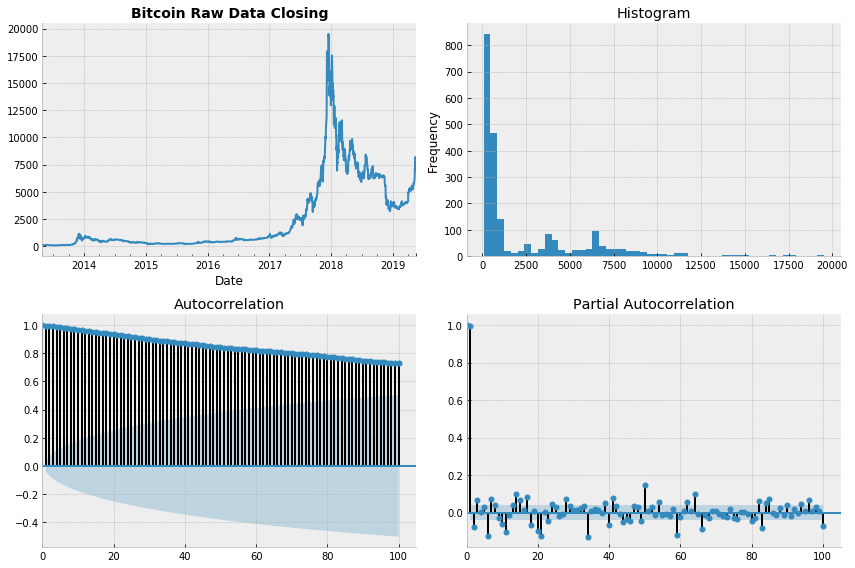

In [6]:
def tsplot_hist(y, title, lags = None, figsize = (12,8)):
    
    '''Examine the apparent of ACF and PACF , along with the time series plot and the histogram'''
    
    fig = plt.figure(figsize=figsize)
    layout = (2,2)
    ts_ax = plt.subplot2grid(layout, (0,0))
    hist_ax = plt.subplot2grid(layout, (0,1))
    acf_ax = plt.subplot2grid(layout, (1,0))
    pacf_ax = plt.subplot2grid(layout, (1,1))
    
    y.plot(ax = ts_ax)
    ts_ax.set_title(title, fontsize = 14, fontweight = 'bold')
    y.plot(kind = 'hist', ax = hist_ax, bins = 50)
    hist_ax.set_title('Histogram')
    tsaplots.plot_acf(y, lags = lags, ax = acf_ax)
    tsaplots.plot_pacf(y, lags=lags, ax = pacf_ax)
    [ax.set_xlim(0) for ax in [acf_ax, pacf_ax]]
    sns.despine()
    plt.tight_layout()
    return ts_ax, acf_ax, pacf_ax


tsplot_hist(btc_price.Close, 'Bitcoin Raw Data Closing', lags=100)

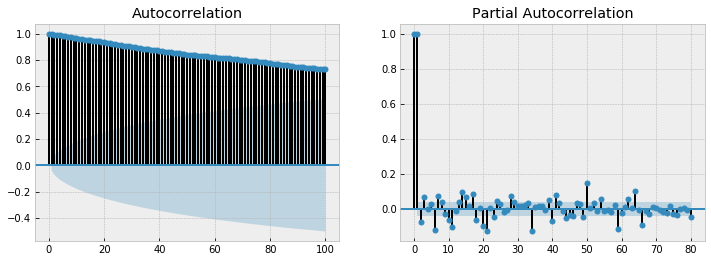

In [7]:
#Mid market price seems to fit an AR(1) (introductory to statistics)


def ts_acf_pacf(y):
    fig = plt.figure(figsize=(12,4))
    layout = (1,2)
    acf_ax = plt.subplot2grid(layout, (0,0))
    pacf_ax = plt.subplot2grid(layout, (0,1))
    tsaplots.plot_acf(y, ax=acf_ax, lags = 100 )
    tsaplots.plot_pacf(y, ax=pacf_ax, lags = 80 )

ts_acf_pacf(btc_price.Close)
#plt.savefig('ACF_&_PACF_raw_BTC_Close.png', format='png', dpi=300)

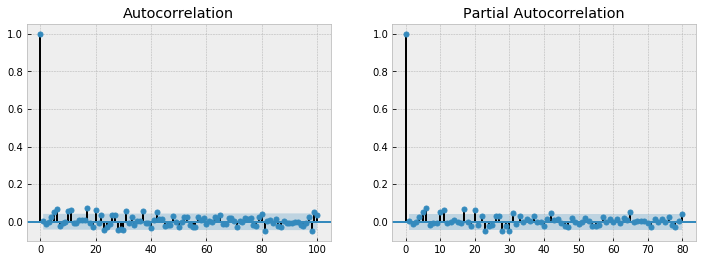

In [107]:
ts_acf_pacf(Btc_close_log.diff().dropna())
#plt.savefig('ACF_&_PACF_raw_BTC_Log_Close_diff.png', format='png', dpi=300)

Stationarity Analysis of Raw Data

In [8]:
#Visualization plot to assses if the time series mantains its statistical properties (mean, variance, covariance) across time


def test_stationarity_1(timeseries, title, w):
    
    #Determing rolling statistics
    rolmean = timeseries.rolling(window=w).mean()
    rolstd = timeseries.rolling(window=w).std()

    #Plot rolling statistics:
    plt.figure(figsize=(15,6))
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title(title)
    plt.show(block=False)
    print ('Results of Dickey-Fuller Test:')
    dftest = tsa.adfuller(timeseries.values, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)
    ts_acf_pacf(timeseries)


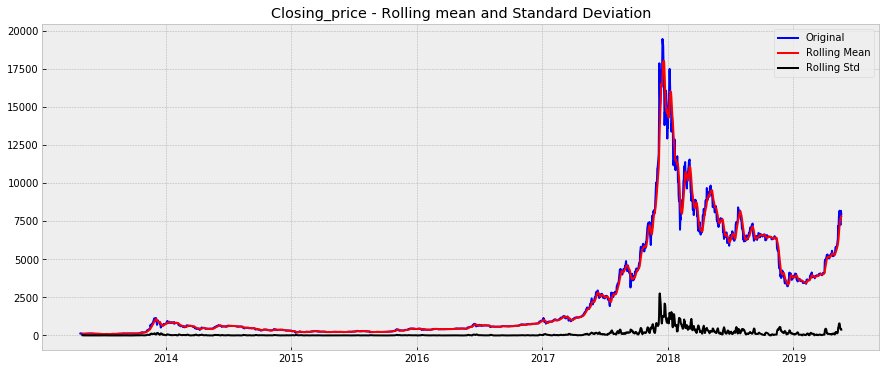

Results of Dickey-Fuller Test:
Test Statistic                   -1.614047
p-value                           0.475852
#Lags Used                       27.000000
Number of Observations Used    2186.000000
Critical Value (1%)              -3.433345
Critical Value (5%)              -2.862863
Critical Value (10%)             -2.567474
dtype: float64


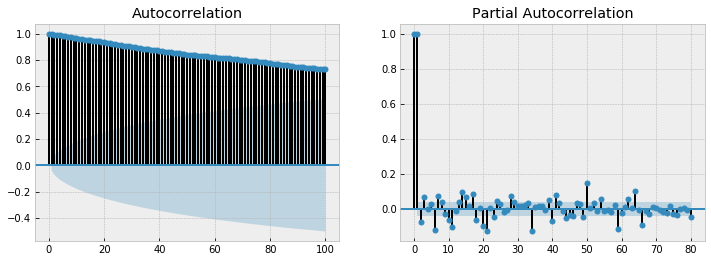

In [11]:
#raw Data
test_stationarity_1(btc_price.Close, "Closing_price - Rolling mean and Standard Deviation", 7)
plt.savefig('test_stationary__raw_BTC_Close.png', format='png', dpi=300)
# The p-value is too high to reject the null hypothesis.
# Based on the initial curve of the graph, the data needs to be transformed to get it stationary. First try transforming the data with log to remove the trend.

In [91]:
ADF_test(btc_price.Close)

Results of Dickey-Fuller Test:
Test Statistic                   -1.614047
p-value                           0.475852
#Lags Used                       27.000000
Number of Observations Used    2186.000000
Critical Value (1%)              -3.433345
Critical Value (5%)              -2.862863
Critical Value (10%)             -2.567474
dtype: float64


Stationarity analysis of transformed series

D:\andrea\Anaconda3\lib\site-packages\pandas\plotting\_converter.py:129: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


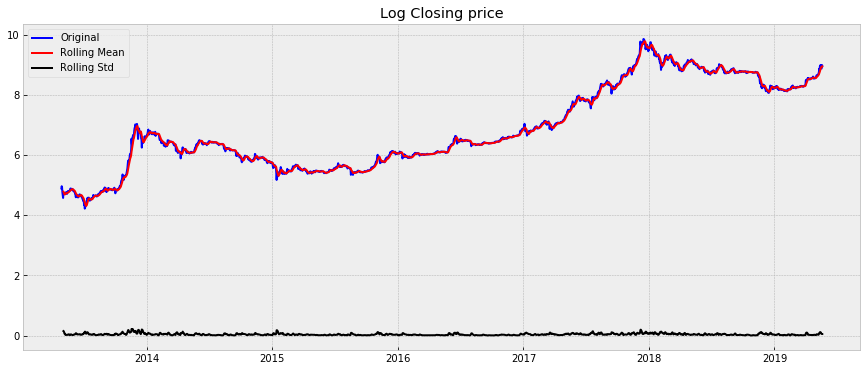

Results of Dickey-Fuller Test:
Test Statistic                   -0.923207
p-value                           0.780234
#Lags Used                       23.000000
Number of Observations Used    2190.000000
Critical Value (1%)              -3.433339
Critical Value (5%)              -2.862861
Critical Value (10%)             -2.567473
dtype: float64


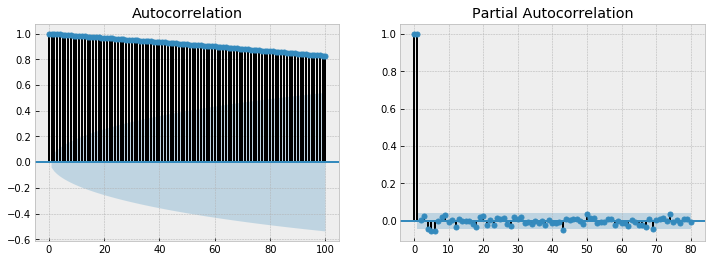

In [10]:
# logaritmic transformation
Btc_close_log = np.log(btc_price.Close)
test_stationarity_1(Btc_close_log, 'Log Closing price', 7)

#still, the null hypotehsis cannot be rejected

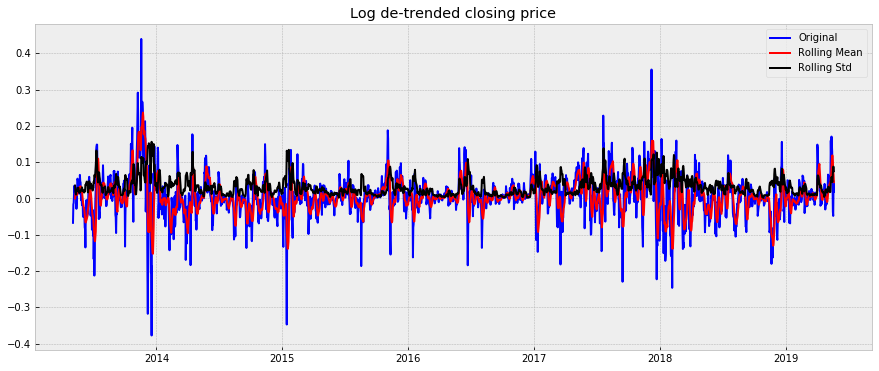

Results of Dickey-Fuller Test:
Test Statistic                -8.320824e+00
p-value                        3.576599e-13
#Lags Used                     2.700000e+01
Number of Observations Used    2.180000e+03
Critical Value (1%)           -3.433353e+00
Critical Value (5%)           -2.862867e+00
Critical Value (10%)          -2.567476e+00
dtype: float64


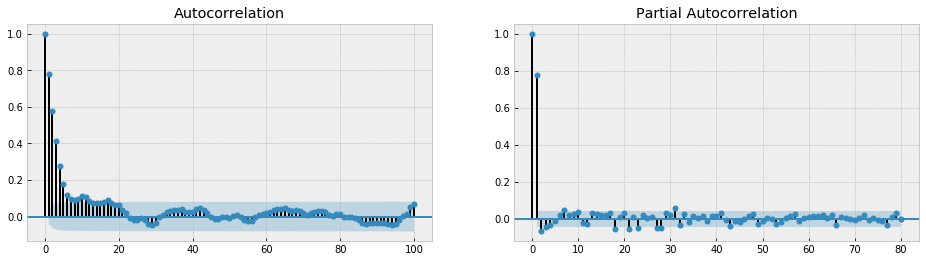

In [18]:
#rolling average
Rolling_average_close_7 = Btc_close_log.rolling(window = 7, center = False).mean()
Rolling_average_close_30 = Btc_close_log.rolling(window = 30, center = False).mean()
Close_log_diff_trend = Btc_close_log - Rolling_average_close_7

test_stationarity(Close_log_diff_trend.dropna(), 'Log de-trended closing price', 7)

#we  reject the null hypotehsis and say that the series is stationary
#Also, the test statistic is smaller than the 5% critical values so we can say with 95% confidence that this is a stationary series.

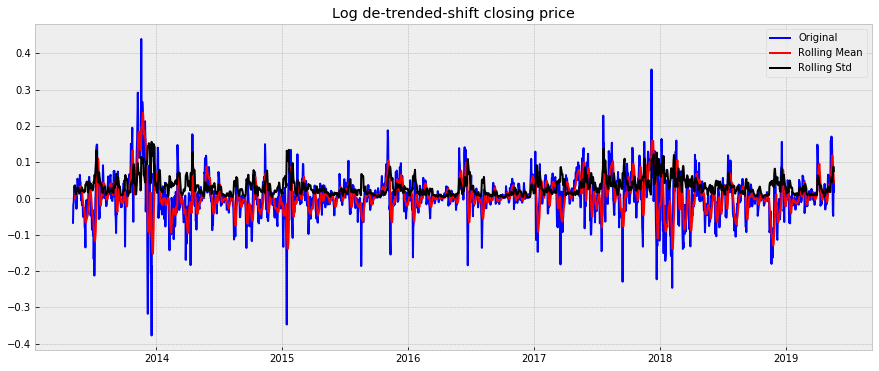

Results of Dickey-Fuller Test:
Test Statistic                -8.320824e+00
p-value                        3.576599e-13
#Lags Used                     2.700000e+01
Number of Observations Used    2.180000e+03
Critical Value (1%)           -3.433353e+00
Critical Value (5%)           -2.862867e+00
Critical Value (10%)          -2.567476e+00
dtype: float64


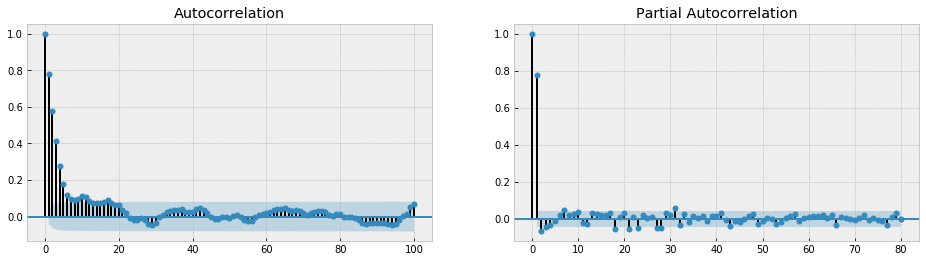

In [25]:
#rolling average shifted
Rolling_average_close_7 = Btc_close_log.rolling(window = 7, center = False).mean()
Rolling_average_close_7_shift = Rolling_average_close_7.shift(-2).dropna()
Rolling_average_close_30 = Btc_close_log.rolling(window = 30, center = False).mean()
Rolling_average_close_30_shift = Rolling_average_close_30.shift(-2).dropna()
Close_log_diff_trend_shift = Btc_close_log - Rolling_average_close_30_shift

test_stationarity(Close_log_diff_trend.dropna(), 'Log de-trended-shift closing price', 7)

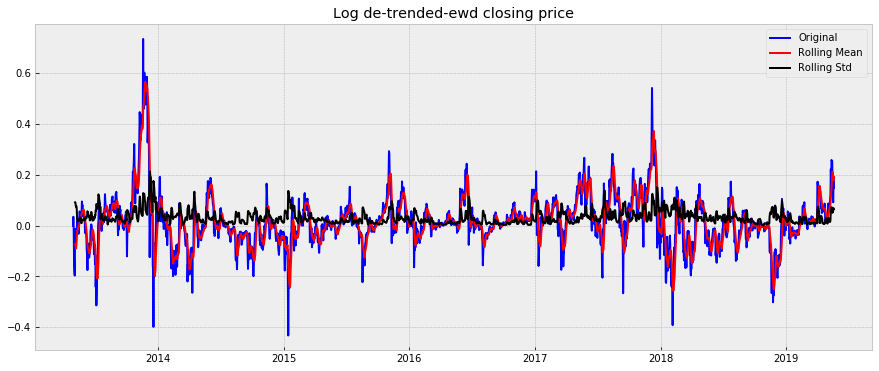

Results of Dickey-Fuller Test:
Test Statistic                -6.770468e+00
p-value                        2.649863e-09
#Lags Used                     2.300000e+01
Number of Observations Used    2.190000e+03
Critical Value (1%)           -3.433339e+00
Critical Value (5%)           -2.862861e+00
Critical Value (10%)          -2.567473e+00
dtype: float64


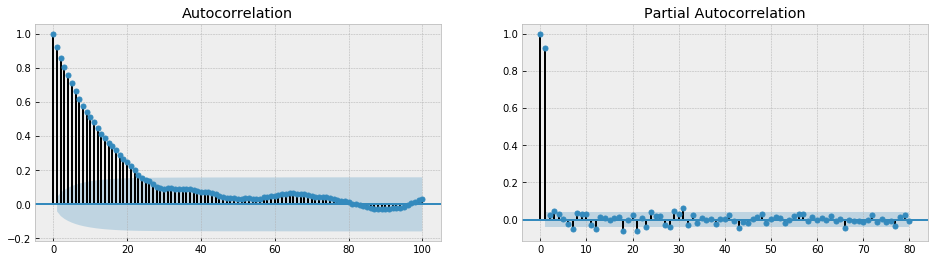

In [19]:
Btc_close_ewm_7 = Btc_close_log.ewm(halflife=7,min_periods=0,adjust=True,ignore_na=False).mean()
Close_log_diff_ewm_trend = Btc_close_log - Btc_close_ewm_7

test_stationarity(Close_log_diff_ewm_trend.dropna(), 'Log de-trended-ewd closing price', 7)

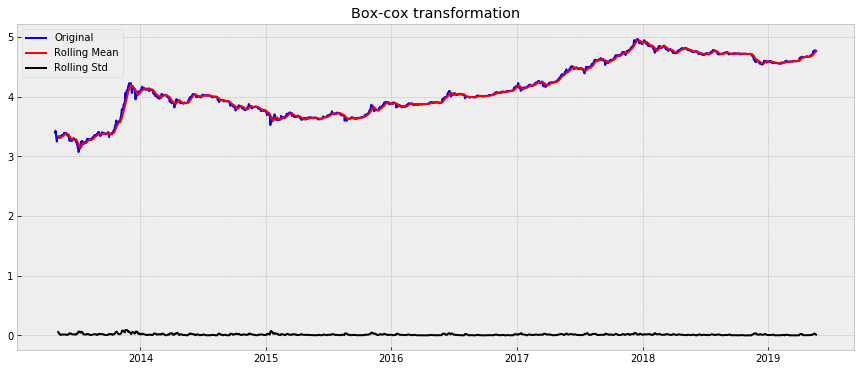

Results of Dickey-Fuller Test:
Test Statistic                   -1.185221
p-value                           0.679921
#Lags Used                       27.000000
Number of Observations Used    2186.000000
Critical Value (1%)              -3.433345
Critical Value (5%)              -2.862863
Critical Value (10%)             -2.567474
dtype: float64


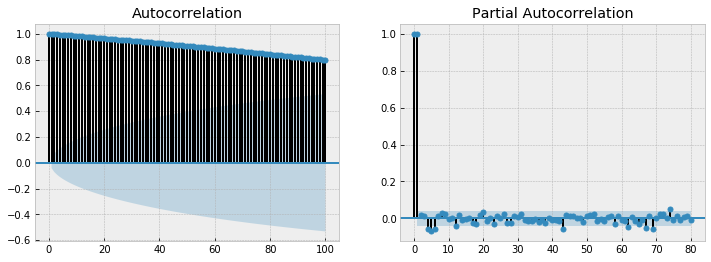

In [8]:
#boxcox tranformation
btc_price['Btc_close_boxcox'] , lmbda = stats.boxcox(btc_price.Close) 
test_stationarity_1(btc_price.Btc_close_boxcox, 'Box-cox transformation', 10)

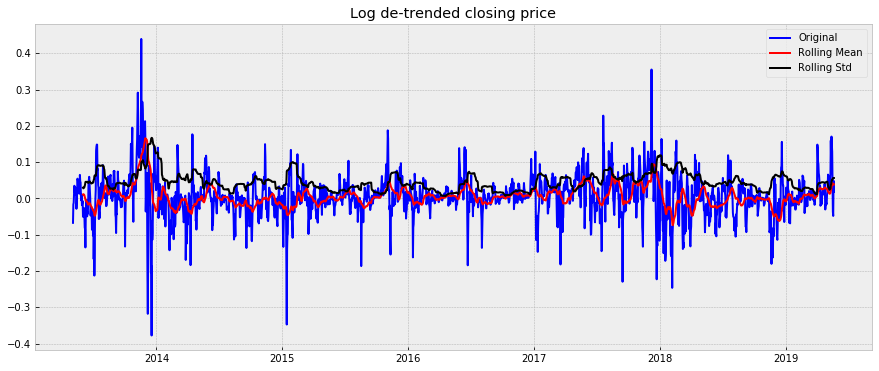

Results of Dickey-Fuller Test:
Test Statistic                -8.320824e+00
p-value                        3.576599e-13
#Lags Used                     2.700000e+01
Number of Observations Used    2.180000e+03
Critical Value (1%)           -3.433353e+00
Critical Value (5%)           -2.862867e+00
Critical Value (10%)          -2.567476e+00
dtype: float64


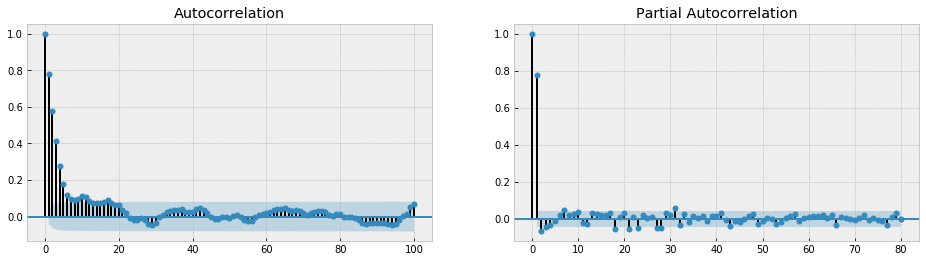

In [142]:
#rolling average
#rolling average
Rolling_average_boc_cox_close_7 = btc_price.Btc_close_boxcox.rolling(window = 7, center = False).mean()
Rolling_average_box_cox_close_30 = btc_price.Btc_close_boxcox.rolling(window = 30, center = False).mean()
Close_box_cox_diff_trend = btc_price.Btc_close_boxcox - Rolling_average_box_cox_close_30

test_stationarity(Close_log_diff_trend.dropna(), 'Log de-trended closing price', 30)

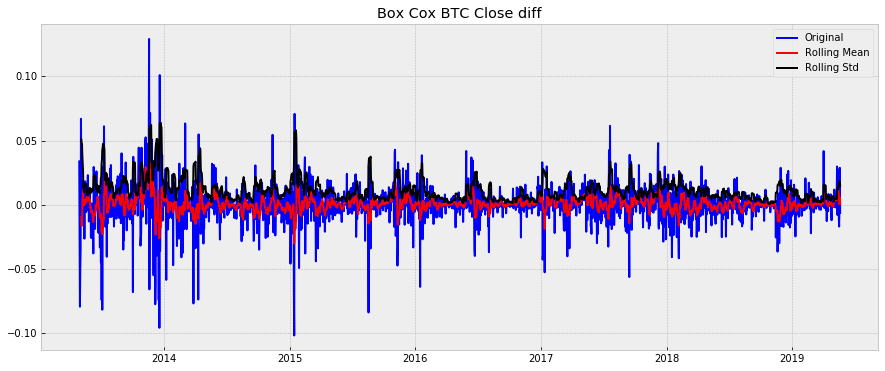

Results of Dickey-Fuller Test:
Test Statistic                -7.673514e+00
p-value                        1.570742e-11
#Lags Used                     2.700000e+01
Number of Observations Used    2.185000e+03
Critical Value (1%)           -3.433346e+00
Critical Value (5%)           -2.862864e+00
Critical Value (10%)          -2.567475e+00
dtype: float64


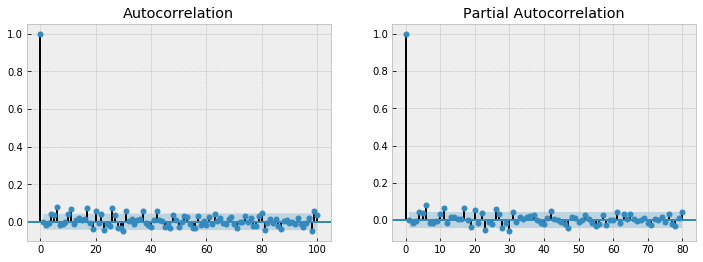

In [13]:
test_stationarity_1(btc_price.Btc_close_boxcox.diff().dropna(), 'Box Cox BTC Close diff', 7)

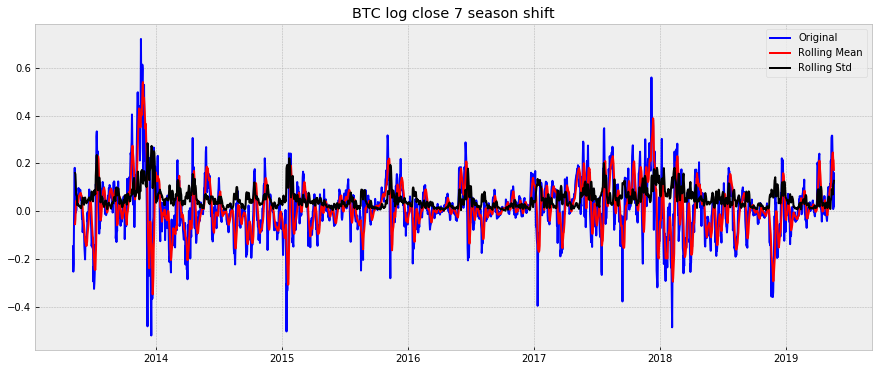

Results of Dickey-Fuller Test:
Test Statistic                -8.636202e+00
p-value                        5.582209e-14
#Lags Used                     2.700000e+01
Number of Observations Used    2.179000e+03
Critical Value (1%)           -3.433355e+00
Critical Value (5%)           -2.862867e+00
Critical Value (10%)          -2.567477e+00
dtype: float64


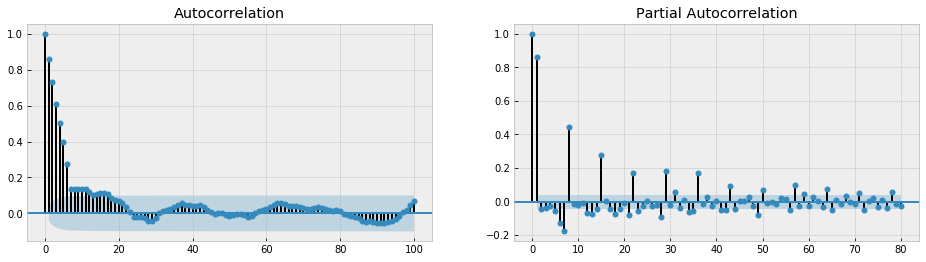

In [21]:
#seasonality differenciation
btc_close_log_7_shift = Btc_close_log  - Btc_close_log.shift(7)
test_stationarity(btc_close_log_7_shift.dropna(), 'BTC log close 7 season shift', 7)

#evaluate the possibility of a weekly seasonality

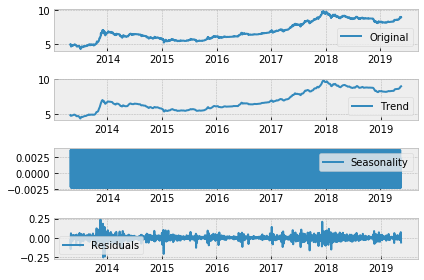

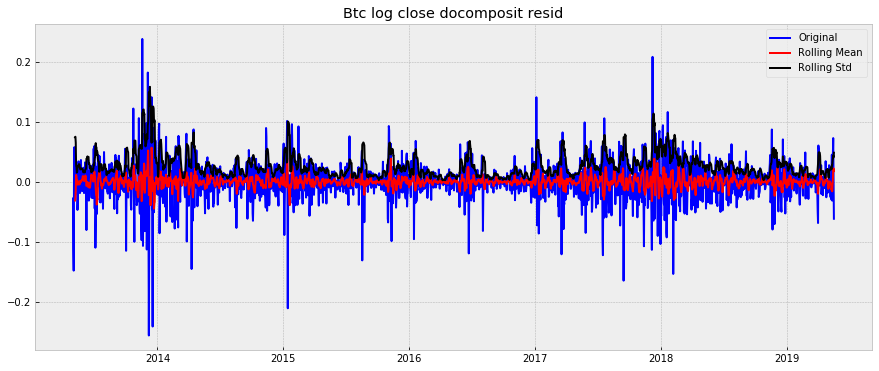

Results of Dickey-Fuller Test:
Test Statistic                -1.313773e+01
p-value                        1.450522e-24
#Lags Used                     2.700000e+01
Number of Observations Used    2.180000e+03
Critical Value (1%)           -3.433353e+00
Critical Value (5%)           -2.862867e+00
Critical Value (10%)          -2.567476e+00
dtype: float64


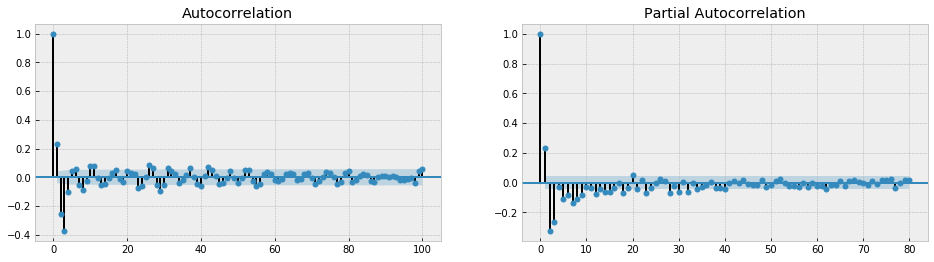

In [31]:
decomposition = sm.tsa.seasonal_decompose(Btc_close_log, freq=7)

trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

plt.subplot(411)
plt.plot(Btc_close_log, label='Original')
plt.legend(loc='best')
plt.subplot(412)
plt.plot(trend, label='Trend')
plt.legend(loc='best')
plt.subplot(413)
plt.plot(seasonal,label='Seasonality')
plt.legend(loc='best')
plt.subplot(414)
plt.plot(residual, label='Residuals')
plt.legend(loc='best')
plt.tight_layout()

test_stationarity(residual.dropna(), 'Btc log close docomposit resid', 7)



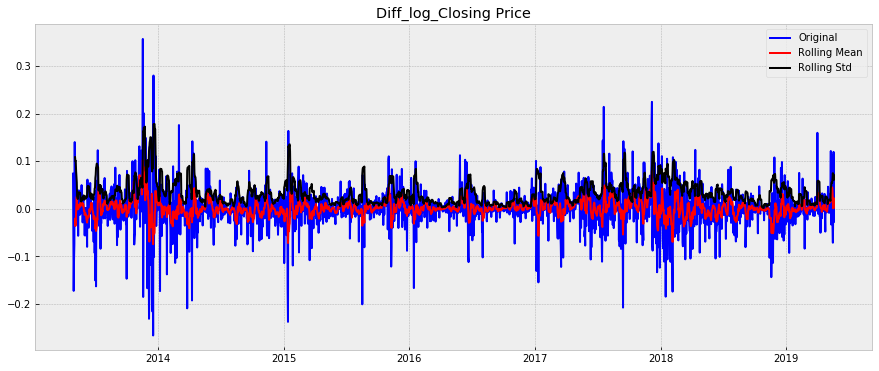

Results of Dickey-Fuller Test:
Test Statistic                -8.043992e+00
p-value                        1.815140e-12
#Lags Used                     2.700000e+01
Number of Observations Used    2.185000e+03
Critical Value (1%)           -3.433346e+00
Critical Value (5%)           -2.862864e+00
Critical Value (10%)          -2.567475e+00
dtype: float64


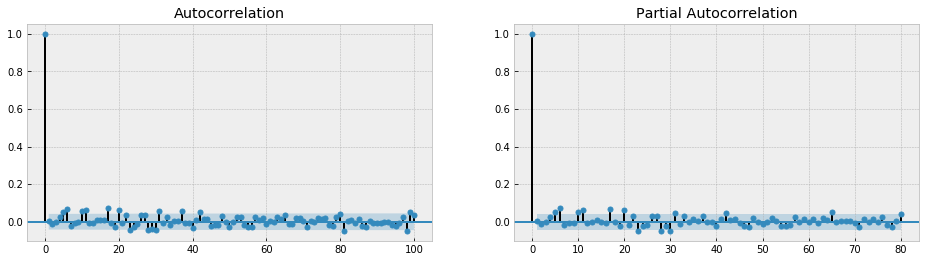

In [200]:
#the series seems stationary

test_stationarity(Btc_close_log.diff().dropna(), "Diff_log_Closing Price", 7)

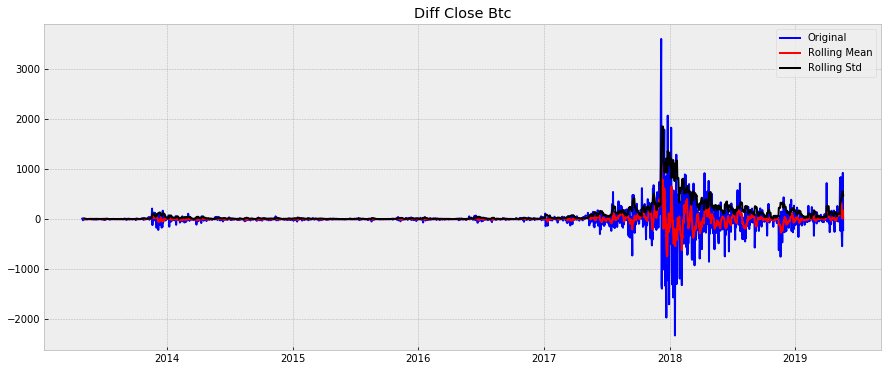

Results of Dickey-Fuller Test:
Test Statistic                -8.750599e+00
p-value                        2.843558e-14
#Lags Used                     2.700000e+01
Number of Observations Used    2.185000e+03
Critical Value (1%)           -3.433346e+00
Critical Value (5%)           -2.862864e+00
Critical Value (10%)          -2.567475e+00
dtype: float64


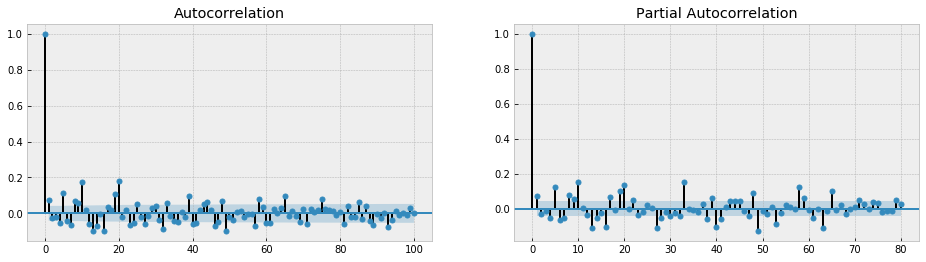

In [199]:
test_stationarity(btc_price.Close.diff().dropna(), 'Diff Close Btc', 7)

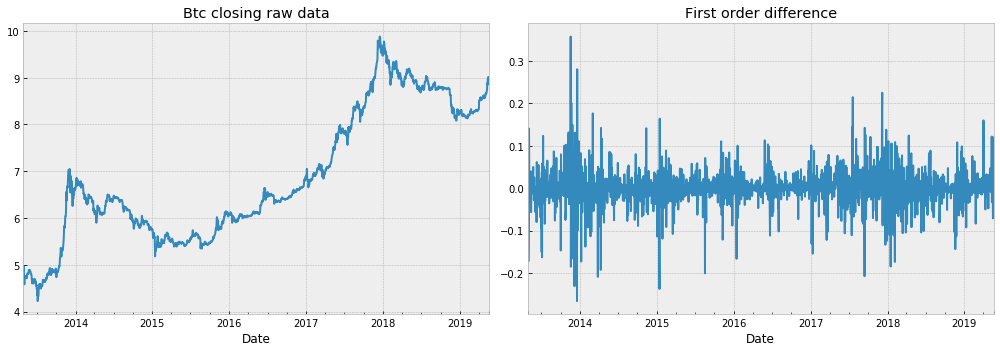

In [28]:
#First difference plot
fig, axes = plt.subplots(1,2,figsize = (14,5))

ax_0 = plt.subplot(121)
ax_0 = Btc_close_log.plot()
ax_0.set_title('Btc closing raw data')


ax_0 = plt.subplot(122)
ax_0 = Btc_close_log.diff(1).plot()
ax_0.set_title('First order difference')
plt.subplots_adjust(top=0.7)
plt.tight_layout()

Statistical Time Series Modelling (univariate ARIMA)

Chapter 4 coding output

In [4]:
# from http://www.blackarbs.com/blog/time-series-analysis-in-python-linear-models-to-garch/11/1/2016

# Optimize ARMA parameters
ps = range(0,4)
d = range(0,2)
qs = range(0,4)

parameters = product(ps,d,  qs)
parameters_list = list(parameters)
len(parameters_list)

def optimize_ARIMA_1(series, parameters_list):
    '''
    crete a function to optimize the ARIMA order based on the lowest AIC
    '''
    result = []
    best_aic = float('inf')
    
    for param in tqdm_notebook(parameters_list):
        try: 
            model = smtsa.ARIMA(series, order = (param[0], param[1], param[2])).fit(maxiter=30, method='mle', trend='nc')
            aic = model.aic
            if aic < best_aic:
                best_model = model 
                best_aic = aic
                best_param = param
            result.append([param, model.aic])
        except ValueError:
            pass
    
    result_table = pd.DataFrame(result)
    result_table.columns = ['parameters', 'aic']
    # sorting in ascending order, the lower AIC is - the better
    result_table = result_table.sort_values(by='aic', ascending=True).reset_index(drop=True)
    
    return result_table





In [12]:
result_table_1 = optimize_ARIMA_1(Btc_close_log, parameters_list)

D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarn

D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:650: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:651: RuntimeWarning: invalid value encountered in true_divide
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\andrea\Anaconda3\lib\site-packages\statsmodel

In [13]:
result_table_1

,parameters,aic
0,"(2, 1, 2)",-7626.784696
1,"(3, 1, 1)",-7626.483859
2,"(3, 1, 2)",-7619.605239
3,"(0, 1, 1)",-7619.459431
4,"(1, 1, 0)",-7619.458131
5,"(2, 1, 0)",-7617.823133
6,"(0, 1, 2)",-7617.805149
7,"(3, 1, 0)",-7615.826059
8,"(2, 1, 1)",-7615.823718
9,"(0, 1, 3)",-7615.813093


In [ ]:
result_table_2 = optimize_ARIMA_1(btc_price.Close, parameters_list)
result_table_2

In [ ]:
p, d, q  = result_table_2.parameters[0]

best_model_arima_212_raw = smtsa.ARIMA(btc_price.Close, order=(p, d, q)).fit( method='mle', trend='nc')
print(best_model_arima_212_raw.summary())

In [14]:
p, d, q  = result_table_1.parameters[0]

best_model_arima_212 = smtsa.ARIMA(Btc_close_log, order=(p, d, q)).fit( method='mle', trend='nc')
print(best_model_arima_212.summary())

D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             ARIMA Model Results                              
Dep. Variable:                D.Close   No. Observations:                 2213
Model:                 ARIMA(2, 1, 2)   Log Likelihood                3818.431
Method:                           mle   S.D. of innovations              0.043
Date:                Thu, 06 Jun 2019   AIC                          -7626.861
Time:                        12:51:00   BIC                          -7598.351
Sample:                    04-29-2013   HQIC                         -7616.446
                         - 05-20-2019                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
ar.L1.D.Close     1.7564      0.211      8.323      0.000       1.343       2.170
ar.L2.D.Close    -0.7838      0.213     -3.685      0.000      -1.201      -0.367
ma.L1.D.Close    -1.7674      0.205     

In [79]:
# residual best model check

<Figure size 864x864 with 0 Axes>

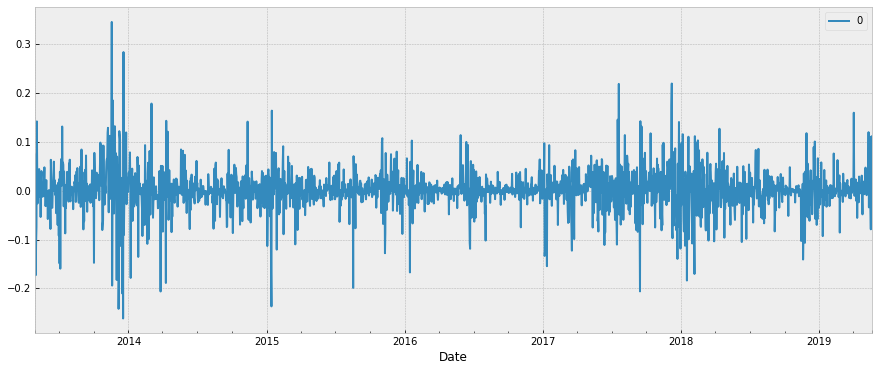

In [80]:
#residual plot
residuals_arima_212 = pd.DataFrame(best_model_arima_212.resid)
plt.figure(figsize=(12,12))
residuals_arima_212.plot()
plt.savefig('Arima_212_resid_plot.png', format='png', dpi=300)


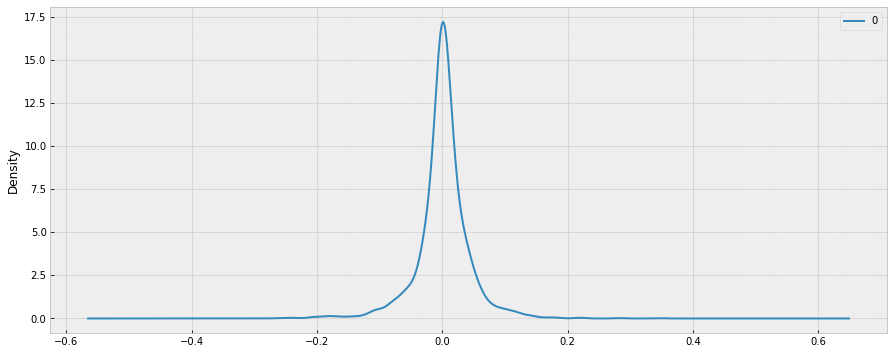

In [81]:
#residual distribution
residuals_arima_212.plot(kind = 'kde')
plt.savefig('Arima_212_resid_distr.png', format='png', dpi=300)

In [37]:
def tsplot_QQ(y, lags=None, figsize=(8, 8), style='bmh'):
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
    with plt.style.context(style):    
        fig = plt.figure(figsize=figsize)
        #mpl.rcParams['font.family'] = 'Ubuntu Mono'
        layout = (3, 2)
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1, 0))
        pacf_ax = plt.subplot2grid(layout, (1, 1))
        qq_ax = plt.subplot2grid(layout, (2, 0))
        pp_ax = plt.subplot2grid(layout, (2, 1))
        
        y.plot(ax=ts_ax)
        ts_ax.set_title('Time Series Analysis Plots')
        tsaplots.plot_acf(y, lags=lags, ax=acf_ax, alpha=0.5)
        tsaplots.plot_pacf(y, lags=lags, ax=pacf_ax, alpha=0.5)
        sm.qqplot(y, line='s', ax=qq_ax)
        qq_ax.set_title('QQ Plot')        
        stats.probplot(y, sparams=(y.mean(), y.std()), plot=pp_ax)

        plt.tight_layout()
    return 

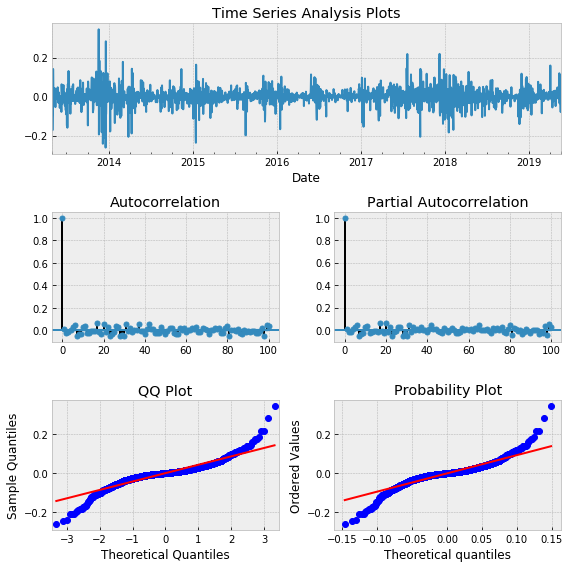

In [83]:
tsplot_QQ(best_model_arima_212.resid, lags = 100)
plt.savefig('Arima_212_resid_ACF_PACF.png', format='png', dpi=300)

In [84]:
f'RSS: {sum((best_model_arima_212.fittedvalues - Btc_close_log.diff()).dropna()**2)}' 

'RSS: 4.109908044055002'

In [15]:
#split train-test
# one month predictions
prediction_days = 50
df_train_log = Btc_close_log[:len(Btc_close_log)-prediction_days]
df_test_log = Btc_close_log[len(Btc_close_log)-prediction_days:]


In [102]:
#split train-test
# one month predictions
prediction_days = 50
df_train = btc_price[:len(btc_price.Close)-prediction_days]
df_test = btc_price[len(btc_price.Close)-prediction_days:]

In [17]:
start_test, end_test = '2019-04-01', '2019-05-20'

In [ ]:
# one step-ahead forecast dynamic = False, dynamic = true not
#plot_predict produce its own plot

best_model_arima_212.plot_predict(start = '2019-04-01', end = '2019-05-20', dynamic = True)

In [89]:
# model trained on the all period. Use forecast function
#forecast is used to make out_of_sample forecasts

n_steps = 40

f, err95, ci95 = best_model_arima_212.forecast(n_steps) #default 95% CI

#create index for forecast values
idx = pd.date_range(Btc_close_log.index[-1], periods=n_steps, freq='D')

#create dataframe to store mean_forecast and CI 

fc_95 = pd.DataFrame(np.column_stack([f, ci95]), index=idx, columns=['forecast', 'lower_ci_95', 'upper_ci_95'])

fc_95


,forecast,lower_ci_95,upper_ci_95
2019-05-20,8.991056,8.906596,9.075516
2019-05-21,8.997209,8.878419,9.115998
2019-05-22,9.002861,8.857651,9.148072
2019-05-23,9.007968,8.840103,9.175833
2019-05-24,9.012507,8.824140,9.200874
2019-05-25,9.016476,8.808948,9.224004
2019-05-26,9.019890,8.794087,9.245693
2019-05-27,9.022775,8.779310,9.266240
2019-05-28,9.025167,8.764490,9.285843
2019-05-29,9.027106,8.749571,9.304642


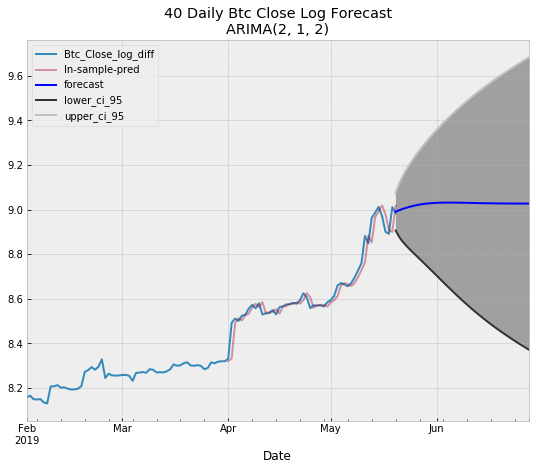

In [113]:
# plot n_steps forecast in-sample, out-of sample and CI
# I haven't used traing and test set

#the prediction on the training data follow yestarday price
#how much is the RMSE and MAPE on the training set: fitted values agaist true values
#what about the out-of-sample forecast?

#in_sample overfit the data, while out-sample foreacst seems to forecast a straight line

fig = plt.figure(figsize=(9,7))
ax = fig.add_subplot(1,1,1)
Btc_close_log['2019-02':].plot(ax = ax, label = 'Btc_Close_log_diff')

#in_sample prediction
in_sample_pred_test = best_model_arima_212.predict(start = start_test,end = end_test, typ='levels')
in_sample_pred_test.plot(label = 'In-sample-pred', alpha = 0.4, ax = ax)

#out-sample prediction
styles = ['b-', '0.2', '0.75']
fc_95.plot(style=styles, ax = ax)

plt.fill_between(fc_95.index, fc_95.lower_ci_95, fc_95.upper_ci_95, color='gray', alpha=0.7)
plt.title('{} Daily Btc Close Log Forecast\nARIMA{}'.format(n_steps, result_table_1.parameters[0]))
plt.legend(loc='best', fontsize=10)
plt.savefig('Arima_212_out_of_sample_forecast.png', format='png', dpi=300)


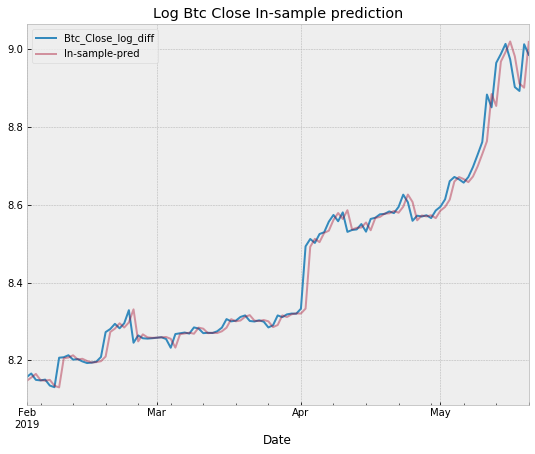

In [110]:
#show what's going on when fitting and predicting the data on the same training dataset.

#rescaled predictions on Btc Close log
fig = plt.figure(figsize=(9,7))
ax = fig.add_subplot(1,1,1)
Btc_close_log['2019-02':].plot(ax = ax, label = 'Btc_Close_log_diff')

#in_sample prediction
in_sample_pred_test = best_model_arima_212.predict(start = '2019-02-01',end = end_test, typ='levels')
in_sample_pred_test.plot(label = 'In-sample-pred', alpha = 0.4, ax = ax)
plt.legend(loc='best', fontsize=10)
plt.title('Log Btc Close In-sample prediction')
plt.savefig('Arima_212_in_sample_pred.png', format='png', dpi=300)

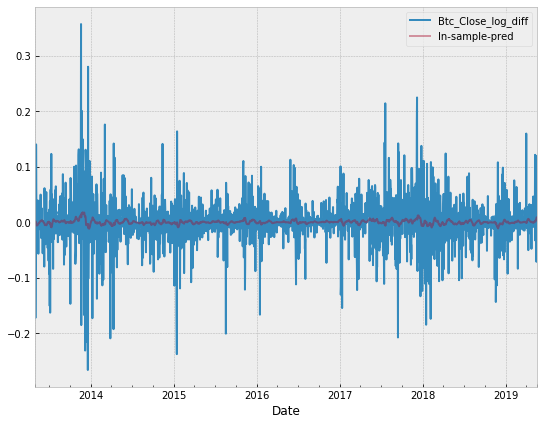

In [111]:
# on te differenced data, the model couldn't predict Daily Btc Close price movement
# it doesn't predict the magnitude

fig = plt.figure(figsize=(9,7))
ax = fig.add_subplot(1,1,1)
Btc_close_log.diff().dropna().plot(ax = ax, label = 'Btc_Close_log_diff')

#in_sample prediction
in_sample_pred_test = best_model_arima_212.predict(start = Btc_close_log.index[1] ,end = Btc_close_log.index[-1])
in_sample_pred_test.plot(label = 'In-sample-pred', alpha = 0.4, ax = ax)
plt.legend(loc='best', fontsize=10)
plt.savefig('Arima_212_in_sample_pred_diff.png', format='png', dpi=300)

In [ ]:
#calculated forecasts and compute
#compute RMSE , MAPE, RSS, MSE on full range traing data predictions
#create a dataframe to store those values with time index
#create a function to compute error
#define how compute forecast error.

def validation_error(true, pred):
    '''compute forecast error metrics'''
    true = pd.DataFrame(true)
    pred = pd.DataFrame(pred)
    df_valid = pd.concat(true, pred, join_axes=[true.index])
    
    MSE = mean_squared_error(df_valid['true'],df_valid['pred'])
    RMSE = np.sqrt(mean_squared_error(test_pred_forecast, df_test))
    f'RMSE {}'.format(RMSE)
    f'RSS {}'.format()
    f'MSE  {}'.format()
    f'MAPE {}'.format()


In [ ]:
#Train-Test Split Forecasting

In [25]:
best_model_arima_212_train = smtsa.ARIMA(df_train_log, order=(2, 1, 2)).fit(method='mle', trend = 'nc')
print(best_model_arima_212_train.summary())

D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             ARIMA Model Results                              
Dep. Variable:                D.Close   No. Observations:                 2163
Model:                 ARIMA(2, 1, 2)   Log Likelihood                3740.654
Method:                           mle   S.D. of innovations              0.043
Date:                Thu, 06 Jun 2019   AIC                          -7471.308
Time:                        12:55:24   BIC                          -7442.912
Sample:                    04-29-2013   HQIC                         -7460.923
                         - 03-31-2019                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
ar.L1.D.Close     0.7429      0.014     54.145      0.000       0.716       0.770
ar.L2.D.Close    -0.9775      0.012    -78.375      0.000      -1.002      -0.953
ma.L1.D.Close    -0.7384      0.020    -

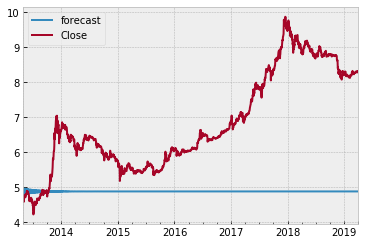

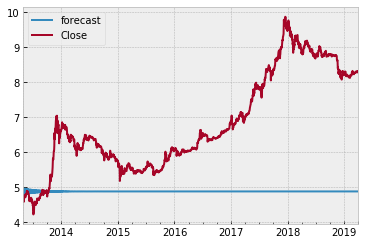

In [28]:
best_model_arima_212_train.plot_predict(dynamic = True)

D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:336: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  freq=base_index.freq)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:320: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  freq=base_index.freq)


RMSE: 1983.1622


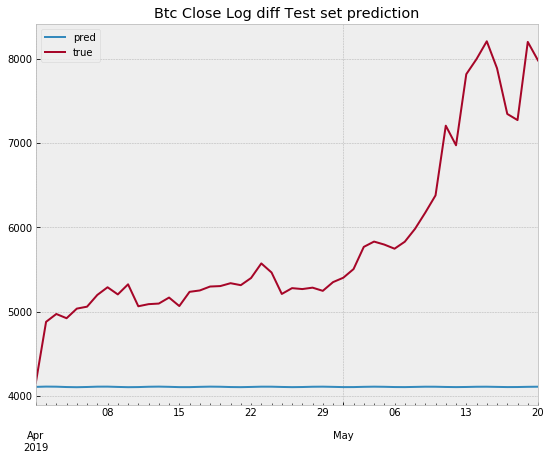

In [112]:
#add a  mean percentage error metric, log transformation
test_pred = best_model_arima_212_train.predict(start=start_test, end = end_test, typ='levels')
print('RMSE: %.4f'% np.sqrt(mean_squared_error(np.exp(test_pred), np.exp(df_test_log))))
fig = plt.figure(figsize=(9,7))
ax = fig.add_subplot(1,1,1)
validation_df = pd.DataFrame({'pred': np.exp(test_pred), 'true': np.exp(df_test_log)})
validation_df.plot(ax = ax)
plt.title('Btc Close Log diff Test set prediction')
plt.savefig('Arima_212_Validation_set_pred.png', format='png', dpi=300)

In [181]:

def mean_absolute_percentage_error(y_true, y_pred): 

    ## Note: does not handle mix 1d representation
    #if _is_1d(y_true): 
    #    y_true, y_pred = _check_1d_array(y_true, y_pred)

    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [106]:
print('MAPE: {}'.format(mean_absolute_percentage_error(np.exp(df_test_log), np.exp(test_pred))))

MAPE: 27.448973509077177


In [ ]:
#add a  mean percentage error metric, without transformation
test_pred = best_model_arima_212_train.predict(start=start_test, end = end_test, typ='levels')
print('RMSE: %.4f'% np.sqrt(mean_squared_error(np.exp(test_pred), np.exp(df_test))))
fig = plt.figure(figsize=(9,7))
ax = fig.add_subplot(1,1,1)
validation_df = pd.DataFrame({'pred': np.exp(test_pred), 'true': np.exp(df_test)})
validation_df.plot(ax = ax)
plt.title('Btc Close Log diff Test set prediction')

In [67]:
#forecast function from https://www.kaggle.com/praneethji/bitcoin-price-prediction-with-arima
test_pred_forecast = best_model_arima_212_train.forecast(steps = 50)[0]
print('RMSE: %.4f'% np.sqrt(mean_squared_error(np.exp(test_pred_forecast), np.exp(df_test))))


RMSE: 1983.1622


In [ ]:
# one step ahed forecast
# doesn't work

history = [x for x in df_train]
predictions = list()
originals = list()
error_list = list()

print('Printing Predicted vs Expected Values...')
print('\n')
# We go over each value in the test set and then apply ARIMA model and calculate the predicted value. We have the expected value in the test set therefore we calculate the error between predicted and expected value 
for t in range(len(df_test)):
    model = smtsa.ARIMA(history, order = (2,1,2))
    model_fit = model.fit( method='mle', trend='nc')
    
    output = model_fit.forecast()
    
    pred_value = output[0]
    
        
    original_value = df_test[t]
    history.append(original_value)
    
    pred_value = np.exp(pred_value)
    
    
    original_value = np.exp(original_value)
    
    # Calculating the error
    error = ((abs(pred_value - original_value)) / original_value) * 100
    error_list.append(error)
    print('predicted = %f,   expected = %f,   error = %f ' % (pred_value, original_value, error), '%')
    
    predictions.append(float(pred_value))
    originals.append(float(original_value))
    
# After iterating over whole test set the overall mean error is calculated.   
print('\n Mean Error in Predicting Test Case Articles : %f ' % (sum(error_list)/float(len(error_list))), '%')
plot.figure(figsize=(8, 6))
test_day = [t
           for t in range(len(df_test))]
labels={'Orginal','Predicted'}
plot.plot(test_day, predictions, color= 'green')
plot.plot(test_day, originals, color = 'orange')
plot.title('Expected Vs Predicted Views Forecasting')
plot.xlabel('Day')
plot.ylabel('Closing Price')
plot.legend(labels)


In [ ]:
# Sarima function
# Initial approximation of parameters
# including seasonal components


def Sarimax_seas_best_params(timeseries):
    Qs = range(0, 2)
    qs = range(0, 3)
    Ps = range(0, 3)
    ps = range(0, 3)
    D=1
    d=1
    parameters = product(ps, qs, Ps, Qs)
    parameters_list = list(parameters)
    len(parameters_list)

    # Model Selection
    results = []
    best_aic = float("inf")
    warnings.filterwarnings('ignore')
    for param in parameters_list:
        try:
            model=sm.tsa.statespace.SARIMAX(timeseries, order=(param[0], d, param[1]), 
                                        seasonal_order=(param[2], D, param[3], 365)).fit(disp=-1)
        except ValueError:
            print('wrong parameters:', param)
            continue
        aic = model.aic
        if aic < best_aic:
            best_model = model
            best_aic = aic
            best_param = param
        results.append([param, model.aic])
    #the best model is stored in results, with the aic
    # Best Models
    result_table = pd.DataFrame(results)
    result_table.columns = ['parameters', 'aic']
    result_table.sort_values(by='aic', ascending = True)
    return result_table



In [ ]:
#inverse prediction if data has been trabsformed using Box-cox fucntion
def invboxcox(y,lmbda):
   if lmbda == 0:
      return(np.exp(y))
   else:
      return(np.exp(np.log(lmbda*y+1)/lmbda))

In [ ]:
# Optimize SARIMAX function


ps = range(0,3)
d = range(0,3)
qs = range(0,3)

parameters = product(ps,d,qs)
parameters_list = list(parameters)
len(parameters_list)

def optimize_SARIMAX(series, parameters_list):
    '''
    crete a function to optimize the ARIMA order based on the lowest AIC
    '''
    result = []
    best_aic = float('inf')
    
    for param in tqdm_notebook(parameters_list):
        try: 
            model = sm.tsa.statespace.SARIMAX(series, order = (param[0], param[1], param[2]), enforce_stationarity=False,
                                            enforce_invertibility=False0).fit(disp=-1)
        except ValueError:
            pass
        aic = model.aic
        if aic < best_aic:
            best_model = model 
            best_aic = aic
            best_param = param
        result.append([param, model.aic])
    
    result_table = pd.DataFrame(result)
    result_table.columns = ['parameters', 'aic']
    # sorting in ascending order, the lower AIC is - the better
    result_table = result_table.sort_values(by='aic', ascending=True).reset_index(drop=True)
    
    return result_table





In [ ]:
# Best Models
result_table = pd.DataFrame(results)
result_table.columns = ['parameters', 'aic']
print(result_table.sort_values(by = 'aic', ascending=True).head())
print(best_model.summary())

In [ ]:
d = 1
n_steps = 50

def plot_ARIMA(series, model, n_steps):
    """
        Plots model vs predicted values
        
        series - dataset with timeseries
        model - fitted SARIMA model
        n_steps - number of steps to predict in the future
        
    """
    # adding model values
    data = series.copy()
    data.columns = ['actual']
    data['arima_model'] = np.exp(model.fittedvalues)
    # making a shift on s+d steps, because these values were unobserved by the model
    # due to the differentiating
    data['arima_model'][:d] = np.NaN
    
    # forecasting on n_steps forward 
    forecast = np.exp(model.predict(start = data.shape[0], end = data.shape[0]+n_steps))
    
    #data needs to be tranformed back to its original format
    forecast = data.arima_model.append(forecast)
    # calculate error, again having shifted on s+d steps from the beginning
    error = mean_absolute_percentage_error(data['actual'][d:], data['arima_model'][d:])
    RMSE = np.sqrt(sum((data.arima_model[d:]-data.actual[d:])**2)/len(data.actual[d:]))

    plt.figure(figsize=(15, 7))
    plt.title("Mean Absolute Percentage Error: {} & RMSE {}".format(error, RMSE))
    plt.plot(forecast, ls='--', color='r', label="model")
    plt.axvspan(data.index[-1], forecast.index[-1], alpha=0.5, color='lightgrey')
    plt.plot(data.actual, label="actual")
    plt.legend()
    plt.grid(True)

    
    
plot_ARIMA(btc_price.Close, best_model_arima_212, 50)

In [ ]:
size = int(len(ts_log)-100)
# Divide into train and test
train_arima, test_arima = ts_log[0:size], ts_log[size:len(ts_log)]
history = [x for x in train_arima]predictions = list()
originals = list()
error_list = list()

print('Printing Predicted vs Expected Values...')
print('\n')
# We go over each value in the test set and then apply ARIMA model and calculate the predicted value. We have the expected value in the test set therefore we calculate the error between predicted and expected value 
for t in range(len(test_arima)):
    model = ARIMA(history, order=(2, 1, 0))
    model_fit = model.fit(disp=-1)
    
    output = model_fit.forecast()
    
    pred_value = output[0]
    
        
    original_value = test_arima[t]
    history.append(original_value)
    
    pred_value = dragon.exp(pred_value)
    
    
    original_value = dragon.exp(original_value)
    
    # Calculating the error
    error = ((abs(pred_value - original_value)) / original_value) * 100
    error_list.append(error)
    print('predicted = %f,   expected = %f,   error = %f ' % (pred_value, original_value, error), '%')
    
    predictions.append(float(pred_value))
    originals.append(float(original_value))
    
# After iterating over whole test set the overall mean error is calculated.   
print('\n Mean Error in Predicting Test Case Articles : %f ' % (sum(error_list)/float(len(error_list))), '%')
plot.figure(figsize=(8, 6))
test_day = [t
           for t in range(len(test_arima))]
labels={'Orginal','Predicted'}
plot.plot(test_day, predictions, color= 'green')
plot.plot(test_day, originals, color = 'orange')
plot.title('Expected Vs Predicted Views Forecasting')
plot.xlabel('Day')
plot.ylabel('Closing Price')
plot.legend(labels)
plot.show()

In [ ]:
#plot the out-of-sample forecast
#https://www.kaggle.com/praneethji/bitcoin-price-prediction-with-arima (In [63])

In [ ]:
#ACF First difference plot and raw data acf on two parallel plots
# make sure it works

with plt.style.context(style='bmh'):
    fig = plt.figure(figsize= (12,12))
    layout = (2,2)
    acf_ax = plt.subplot2grid(layout, (0,0))
    acf_diff_ax = plt.subplot2grid(layout, (1,0))
    pacf_ax = plt.subplot2grid(layout, (0,1))
    pacf_diff_ax = plt.subplot2grid(layout, (1,1))
    tsaplots.plot_acf(btc_price.Close, ax = acf_ax, lags=100)
    tsaplots.plot_acf(btc_price.Close.diff(1).iloc[1:], ax = acf_diff_ax, lags=100)

In [ ]:
#Let us plot the original time series and first-differences
fig, ax = plt.subplots(2, sharex=True)
fig.set_size_inches(5.5, 5.5)
btc_price['Close'].plot(ax=ax[0], color='b')
ax[0].set_title('Close values of Bitcoin Close')
btc_price.Close.diff(1).plot(ax=ax[1], color='r')
ax[1].set_title('First-order differences of Bitcoin Close')
#plt.savefig('plots/ch2/B07887_02_06.png', format='png', dpi=300)

In [ ]:
#Let us plot the ACFs of original time series and first-differences

# plot ACF and PACF of raw and differenced data
fig, ax = plt.subplots(2,2, figsize = (12,8),  sharex=True)
fig.set_size_inches(5.5, 5.5)
autocorrelation_plot(btc_price['Close'], color='b', ax=ax[0])
ax[0].set_title('ACF of Bitcoin Close values')
autocorrelation_plot(btc_price.Close.diff().iloc[1:], color='r', ax=ax[1])
ax[1].set_title('ACF of first differences of Bitcoin')

#plt.savefig('plots/ch2/B07887_02_07.png', format='png', dpi=300)

In [ ]:
# https://www.kaggle.com/praneethji/bitcoin-price-prediction-with-arima

In [ ]:
#run Ljung-Box test on differenced series #investigate the results, difference dat are very stationary. It doesn't apper any seasonality structure in the residual

In [114]:
# Ljung-Box test raw data
"""
Let us obtain the confidence intervls, Ljung-Box Q-statistics and p-values
for the original DJIA Close values
"""
acf_btc_close, confint_btc_close, qstat_btc_close, pvalues_btc_close = tsa.acf(btc_price.Close,
                                                                 unbiased=True,
                                                                 nlags=20,
                                                                 qstat=True,
                                                                 alpha=0.05)

In [118]:
pvalues_btc_close

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0.])

In [ ]:
"""Let us check if at confidence level 95% (alpha=0.05)
if the null hypothesis is rejected at any of the lags
"""
alpha = 0.05
for l, p_val in enumerate(pvalues_btc_close):
    if p_val > alpha:
        print('Null hypothesis is accepted at lag = {} for p-val = {}'.format(l, p_val))
    else:
        print('Null hypothesis is rejected at lag = {} for p-val = {}'.format(l, p_val))

In [111]:
#Ljung-Box test differenced data
"""
Let us obtain the confidence intervls, Ljung-Box Q-statistics and p-values
for the original DJIA Close values
"""
acf_btc_close_diff, confint_btc_close_diff, qstat_btc_close_diff, pvalues_btc_close_diff = tsa.acf(btc_price.Close.diff().iloc[1:],
                                                                 unbiased=True,
                                                                 nlags=20,
                                                                 qstat=True,
                                                                 alpha=0.05)

In [ ]:
"""Let us check if at confidence level 95% (alpha=0.05)
if the null hypothesis is rejected at any of the lags
"""
alpha = 0.05
for l, p_val in enumerate(pvalues_btc_close_diff):
    if p_val > alpha:
        print('Null hypothesis is accepted at lag = {} for p-val = {}'.format(l, p_val))
    else:
        print('Null hypothesis is rejected at lag = {} for p-val = {}'.format(l, p_val))

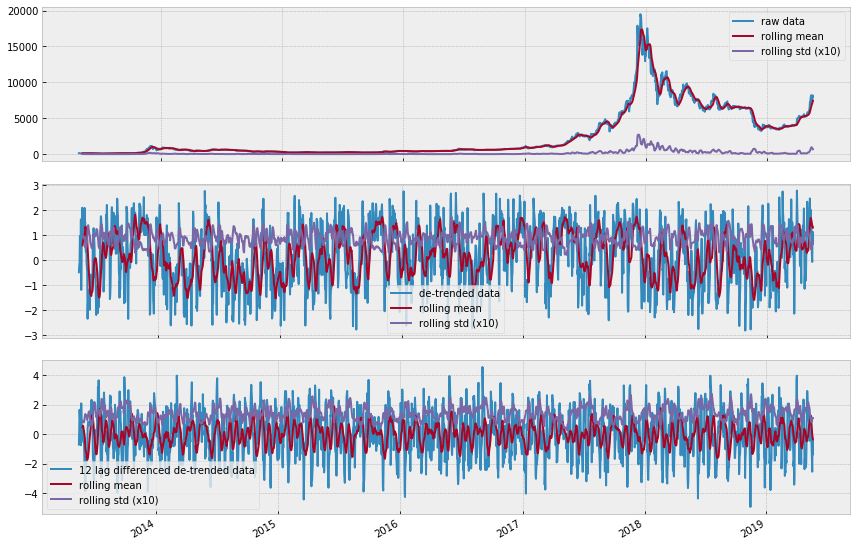

In [268]:
btc_price['z_data'] = (btc_price['Close'] - btc_price.Close.rolling(window=10).mean()) / btc_price.Close.rolling(window=10).std()
btc_price['zp_data'] = btc_price['z_data'] - btc_price['z_data'].shift(7)

def plot_rolling(df):
    fig, ax = plt.subplots(3,figsize=(12, 9))
    ax[0].plot(df.index, df.Close, label='raw data')
    ax[0].plot(df.Close.rolling(window=12).mean(), label="rolling mean");
    ax[0].plot(df.Close.rolling(window=12).std(), label="rolling std (x10)");
    ax[0].legend()

    ax[1].plot(df.index, df.z_data, label="de-trended data")
    ax[1].plot(df.z_data.rolling(window=12).mean(), label="rolling mean");
    ax[1].plot(df.z_data.rolling(window=12).std(), label="rolling std (x10)");
    ax[1].legend()

    ax[2].plot(df.index, df.zp_data, label="12 lag differenced de-trended data")
    ax[2].plot(df.zp_data.rolling(window=12).mean(), label="rolling mean");
    ax[2].plot(df.zp_data.rolling(window=12).std(), label="rolling std (x10)");
    ax[2].legend()

    plt.tight_layout()
    fig.autofmt_xdate()

plot_rolling(btc_price) 



In [ ]:
#define a function to print each transformation tried: log, box-cox, difference, seasonality diff

#raw data
print(" > Is the data stationary ?")
dftest = tsa.adfuller(btc_price.Close, autolag='AIC')
print("Test statistic = {:.3f}".format(dftest[0]))
print("P-value = {:.3f}".format(dftest[1]))
print("Critical values :")
for k, v in dftest[4].items():
    print("\t{}: {} - The data is {} stationary with {}% confidence".format(k, v, "not" if v<dftest[0] else "", 100-int(k[:-1])))
    
#de-trended data
print("\n > Is the de-trended data stationary ?")
dftest = tsa.adfuller(btc_price.z_data.dropna(), autolag='AIC')
print("Test statistic = {:.3f}".format(dftest[0]))
print("P-value = {:.3f}".format(dftest[1]))
print("Critical values :")
for k, v in dftest[4].items():
    print("\t{}: {} - The data is {} stationary with {}% confidence".format(k, v, "not" if v<dftest[0] else "", 100-int(k[:-1])))

#seasonal detrended data
print("\n > Is the 12-lag differenced de-trended data stationary ?")
dftest = tsa.adfuller(btc_price.zp_data.dropna(), autolag='AIC')
print("Test statistic = {:.3f}".format(dftest[0]))
print("P-value = {:.3f}".format(dftest[1]))
print("Critical values :")
for k, v in dftest[4].items():
    print("\t{}: {} - The data is {} stationary with {}% confidence".format(k, v, "not" if v<dftest[0] else "", 100-int(k[:-1])))


In [24]:
from statsmodels.tsa.stattools import kpss

print(" > Is the data stationary ?")
dftest = kpss(btc_price.Close.diff().dropna(), 'ct')
print("Test statistic = {:.3f}".format(dftest[0]))
print("P-value = {:.3f}".format(dftest[1]))
print("Critical values :")
for k, v in dftest[3].items():
    print("\t{}: {}".format(k, v))


 > Is the data stationary ?


D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1278: InterpolationWarning: p-value is greater than the indicated p-value
  warn("p-value is greater than the indicated p-value", InterpolationWarning)


Test statistic = 0.036
P-value = 0.100
Critical values :
	10%: 0.119
	5%: 0.146
	2.5%: 0.176
	1%: 0.216


In [ ]:
#customize

model = ARIMA(np.log(df.data).dropna(), (0, 0, 0))
res_000 = model.fit()
print(res_000.summary())

model = ARIMA(np.log(df.data).dropna(), (0, 1, 0))
res_010 = model.fit()
print(res_010.summary())

fig, ax = plt.subplots(1, 2, sharey=True, figsize=(12, 6))
ax[0].plot(res_000.resid.values, alpha=0.7, label='variance={:.3f}'.format(np.std(res_000.resid.values)));
ax[0].hlines(0, xmin=0, xmax=350, color='r');
ax[0].set_title("ARIMA(0,0,0)");
ax[0].legend();
ax[1].plot(res_010.resid.values, alpha=0.7, label='variance={:.3f}'.format(np.std(res_010.resid.values)));
ax[1].hlines(0, xmin=0, xmax=350, color='r');
ax[1].set_title("ARIMA(0,1,0)");
ax[1].legend();

In [ ]:
model = ARIMA(np.log(df.data).dropna()[:-12], (1, 1, 1))
res_111 = model.fit()

fig, ax = plt.subplots(figsize=(12, 6))
df.index = pd.to_datetime(df.index, format="%Y-%m")
np.log(df.data).dropna()[250:].plot(ax=ax);
ax.vlines('1992-10', 13, 14.5, linestyle='--', color='r', label='Start of forecast');

# - NOTE from the official documentation :
# -- The dynamic keyword affects in-sample prediction. 
# -- If dynamic is False, then the in-sample lagged values are used for prediction. 
# -- If dynamic is True, then in-sample forecasts are used in place of lagged dependent variables.
ax = res_111.plot_predict('1992-10', '1993-10', dynamic=True, plot_insample=False, ax=ax);

In [ ]:

from statsmodels.tsa.statespace.sarimax import SARIMAX

train_st = df.ix[:-24, "station"]
test_st = df.ix[-24:, "station"]
sarima_model = SARIMAX(train_st, order=(0, 1, 2), seasonal_order=(0, 1, 2, 12), enforce_invertibility=False, enforce_stationarity=False)
sarima_fit = sarima_model.fit()

sarima_pred = sarima_fit.get_prediction("1974-01", "1975-12")
predicted_means = p.predicted_mean + df.data.iloc[-36:-1].rolling(12).mean().dropna().values
predicted_intervals = p.conf_int(alpha=0.05)
lower_bounds = predicted_intervals['lower station'] + df.data.iloc[-36:-1].rolling(12).mean().dropna().values
upper_bounds = predicted_intervals['upper station'] + df.data.iloc[-36:-1].rolling(12).mean().dropna().values

sarima_rmse = np.sqrt(np.mean(np.square(test_st.values - p.predicted_mean.values)))

fig, ax = plt.subplots(figsize=(12, 4))
ax.plot(df.data.index[100:-24], df.data.values[100:-24]);
ax.plot(test_st.index, test_st.values + df.data.iloc[-36:-1].rolling(12).mean().dropna().values, label='truth');
ax.plot(test_st.index, predicted_means, color='#ff7823', linestyle='--', label="prediction (RMSE={:0.2f})".format(sarima_rmse));
ax.fill_between(test_st.index, lower_bounds, upper_bounds, color='#ff7823', alpha=0.3, label="confidence interval (95%)");
ax.legend();
ax.set_title("SARIMA");


In [ ]:
#plot_diagnostics

In [ ]:
print(check_output(["ls", "../Master Thesis"]).decode("utf8"))

In [49]:
crypto_data = {}

In [85]:
#load dataset with all closing crypto price



crypto_data['bitcoin'] = pd.read_csv('bitcoin_price.csv', parse_dates = ['Date'])
crypto_data['bitcoin_cash'] = pd.read_csv("bitcoincash_price.csv", parse_dates=['Date'])
crypto_data['dash'] = pd.read_csv("dash_price.csv", parse_dates=['Date'])
crypto_data['ethereum'] = pd.read_csv("ethereum_price.csv", parse_dates=['Date'])
crypto_data['iota'] = pd.read_csv("iota_price.csv", parse_dates=['Date'])
crypto_data['litecoin'] = pd.read_csv("litecoin_price.csv", parse_dates=['Date'])
crypto_data['nem'] = pd.read_csv("nem_price.csv", parse_dates=['Date'])
crypto_data['neo'] = pd.read_csv("neo_price.csv", parse_dates=['Date'])
crypto_data['ripple'] = pd.read_csv("ripple_price.csv", parse_dates=['Date'])
crypto_data['stratis'] = pd.read_csv("stratis_price.csv", parse_dates=['Date'])

In [54]:
# For this analysis I will only be looking at closing price to make things more manageable
for coin in crypto_data:
    for column in crypto_data[coin].columns:
        if column not in ['Date', 'Close']:
            crypto_data[coin] = crypto_data[coin].drop(column, 1)
    # Make date the datetime type and reindex
    crypto_data[coin]['Date'] = pd.to_datetime(crypto_data[coin]['Date'])
    crypto_data[coin] = crypto_data[coin].sort_values('Date')
    crypto_data[coin] = crypto_data[coin].set_index(crypto_data[coin]['Date'])
    crypto_data[coin] = crypto_data[coin].drop('Date', 1)

In [ ]:
#correlation with other crypto currencies
# from https://www.kaggle.com/dbarkhorn/crypto-correlation


In [ ]:
# Let's plot ACF & PACF graphs to visualize AR & MA components

fig, axes = plt.subplots(1, 2)
fig.set_figwidth(12)
fig.set_figheight(4)
tsaplots.plot_acf(tsmlogdiff, lags=30, ax=axes[0], alpha=0.5)
tsaplots.plot_pacf(tsmlogdiff, lags=30, ax=axes[1], alpha=0.5)
plt.tight_layout()

Exploratory Analysis Blockchain Dataset

In [9]:
#load dataset

btc_bloackchain_dataset = pd.read_csv('bitcoin_blockchain_dataset.csv', parse_dates = ['Date'])


In [10]:
#set index

btc_bloackchain_dataset.set_index(btc_bloackchain_dataset['Date'], inplace=True)
btc_bloackchain_dataset.sort_index(inplace=True)
btc_bloackchain_dataset.drop('Date', axis = 1, inplace=True)
btc_bloackchain_dataset.drop(['btc_market_cap','btc_n_orphaned_blocks','btc_total_bitcoins', 'btc_blocks_size', 'btc_n_transactions_total'], axis = 1, inplace=True)

In [11]:
btc_bloackchain_dataset['btc_trade_volume'] = btc_bloackchain_dataset['btc_trade_volume'].fillna(method = 'ffill')
btc_bloackchain_dataset['btc_n_unique_addresses'] = btc_bloackchain_dataset['btc_n_unique_addresses'].fillna(method = 'ffill')
btc_bloackchain_dataset['btc_n_transactions_excluding_chains_longer_than_100'] = btc_bloackchain_dataset['btc_n_transactions_excluding_chains_longer_than_100'].fillna(method = 'ffill')

In [ ]:
btc_bloackchain_dataset.info()

Data transformation

In [217]:
Drop_blockchain = ['btc_market_cap', 'btc_n_orphaned_blocks']   
Diff_1_blockchain = ['btc_median_confirmation_time','btc_cost_per_transaction_percent', 'btc_cost_per_transaction', 'btc_n_unique_addresses', 'btc_n_transactions',  'btc_n_transactions_excluding_popular', 'btc_estimated_transaction_volume', 'btc_estimated_transaction_volume_usd', 'btc_n_transactions_excluding_chains_longer_than_100','btc_market_price','btc_trade_volume','btc_avg_block_size', 'btc_n_transactions_per_block',  'btc_hash_rate', 'btc_difficulty', 'btc_miners_revenue','btc_transaction_fees', 'btc_output_volume' ]
Trend_diff_blockchain = ['btc_total_bitcoins', 'btc_blocks_size', 'btc_n_transactions_total']
seasonal_blockchain_diff = ['btc_output_volume', 'btc_difficulty', 'btc_transaction_fees', 'btc_n_transactions_per_block', 'btc_avg_block_size', 'btc_trade_volume', 'btc_cost_per_transaction_percent', 'btc_cost_per_transaction', 'btc_n_unique_addresses', 'btc_n_transactions',  'btc_n_transactions_excluding_popular', 'btc_estimated_transaction_volume', 'btc_estimated_transaction_volume_usd', 'btc_n_transactions_excluding_chains_longer_than_100' ]


In [ ]:
#estimate trend variables


features_trend = pd.DataFrame.from_dict({x: btc_bloackchain_dataset[x].values - btc_bloackchain_dataset[x].rolling(1).mean() for x in btc_bloackchain_dataset[Trend_diff_blockchain]})

test_stationarity_1(features_trend['btc_total_bitcoins'].dropna(), 'btc_total_bitcoins', 7)


In [218]:
#define tailor made stationary blockchain dataset

btc_bloackchain_dataset_log_full_stat = btc_bloackchain_dataset.copy()
btc_bloackchain_dataset_log_full_stat = btc_bloackchain_dataset_log_full_stat.apply(lambda x : np.log(x +1), axis = 0)
btc_bloackchain_dataset_log_full_stat[Diff_1_blockchain] = btc_bloackchain_dataset_log_full_stat[Diff_1_blockchain].apply(lambda x: x.diff(), axis = 0)
btc_bloackchain_dataset_log_full_stat.drop(Drop_blockchain, axis = 1, inplace = True)
btc_bloackchain_dataset_log_full_stat[seasonal_blockchain_diff] = btc_bloackchain_dataset_log_full_stat[seasonal_blockchain_diff].apply(lambda x: x.diff(7), axis = 0)
btc_bloackchain_dataset_log_full_stat[Trend_diff_blockchain] = btc_bloackchain_dataset_log_full_stat[Trend_diff_blockchain].apply(lambda x: x.diff(1), axis = 0)
btc_bloackchain_dataset_log_full_stat.dropna(inplace=True)

In [ ]:
btc_bloackchain_dataset_full_stat.info()

In [ ]:
#conclusion about the above stationary test of the original variables:
# many variables follow a random walk process.
# Let me comment on ech one by the order they apper on the dataframe
#btc_market_price: non-stationary, it can be used as dependent variable, random walk, no seasonality
#btc_total_bitcoin: trend non stationary, linear positive  trend
#btc_market_cap: looks similar to btc_mrket_price
#btc_trade_volume: seasonal, almost stationary
#btc_block_size: linear positive trend
#btc_avrg_block_size: non-stationary, increasing trend, slightly seasonal, AR process
#btc_n_orphaned_blocks: stationary, ar process
#btc_n_transaction_per_block: non-stationary, increasing trend, slightly seasonality presense, ar process
#btc_median:confirmation_time : almost stationary, ar process
#btc_hars_rate: exponential growth rate,maybe seasonal, 
#btc_difficulty : similar growth of harh_rate
#btc_miners_revenue: similar behaviour to bitcoin market price
#btc_transaction_fee: stationary, random walk process
#btc_cost_per_transcation_percent: ar process with weekly seasonality
#btc_cost_per_transcation
#btc_unique_addresses: non-stationary, random walk
#btc_number_total_transactions: positive linear trend
#

In [14]:
#create difference function with default value to 1
def difference(dataset, interval = 1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i-interval]
        diff.append(value)
    return diff

def seasonal_diff(dataset, interval = 7):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i-interval]
        diff.append(value)
    return diff



In [15]:
# fisrt difference df

def diff_df(df, interval = 1):
    diff_df = df.apply(lambda x: x.diff(interval), axis = 0)
    return diff_df.iloc[interval:].apply(lambda x: x.fillna(method = 'ffill'), axis = 0)

In [16]:
btc_bloackchain_dataset_log_transf = btc_bloackchain_dataset.apply(lambda x: np.log(x + 1 ), axis = 0)


In [17]:
btc_bloackchain_dataset_log_transf.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2190 entries, 2013-05-22 to 2019-05-20
Data columns (total 18 columns):
btc_market_price                                       2190 non-null float64
btc_trade_volume                                       2190 non-null float64
btc_avg_block_size                                     2190 non-null float64
btc_n_transactions_per_block                           2190 non-null float64
btc_median_confirmation_time                           2190 non-null float64
btc_hash_rate                                          2190 non-null float64
btc_difficulty                                         2190 non-null float64
btc_miners_revenue                                     2190 non-null float64
btc_transaction_fees                                   2190 non-null float64
btc_cost_per_transaction_percent                       2190 non-null float64
btc_cost_per_transaction                               2190 non-null float64
btc_n_unique_addresses      

In [18]:
btc_bloackchain_dataset_1diff_log_trasf = diff_df(btc_bloackchain_dataset_log_transf, 1)


In [58]:
btc_bloackchain_dataset_1diff_log_trasf.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2189 entries, 2013-05-23 to 2019-05-20
Data columns (total 18 columns):
btc_market_price                                       2189 non-null float64
btc_trade_volume                                       2189 non-null float64
btc_avg_block_size                                     2189 non-null float64
btc_n_transactions_per_block                           2189 non-null float64
btc_median_confirmation_time                           2189 non-null float64
btc_hash_rate                                          2189 non-null float64
btc_difficulty                                         2189 non-null float64
btc_miners_revenue                                     2189 non-null float64
btc_transaction_fees                                   2189 non-null float64
btc_cost_per_transaction_percent                       2189 non-null float64
btc_cost_per_transaction                               2189 non-null float64
btc_n_unique_addresses      

Stationarity test

In [ ]:
#test stationarity bt_blockchain raw data

for i in btc_bloackchain_dataset.columns:
    test_stationarity_1(btc_bloackchain_dataset[i], i, 7)

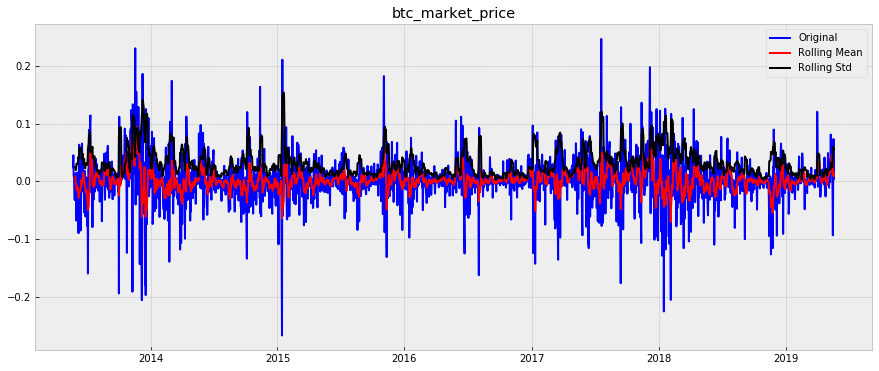

Results of Dickey-Fuller Test:
Test Statistic                -1.188756e+01
p-value                        5.973609e-22
#Lags Used                     1.000000e+01
Number of Observations Used    2.178000e+03
Critical Value (1%)           -3.433356e+00
Critical Value (5%)           -2.862868e+00
Critical Value (10%)          -2.567477e+00
dtype: float64


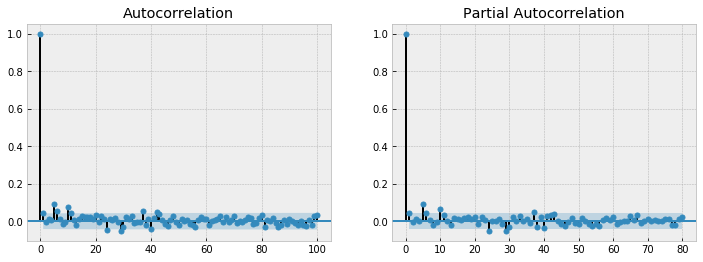

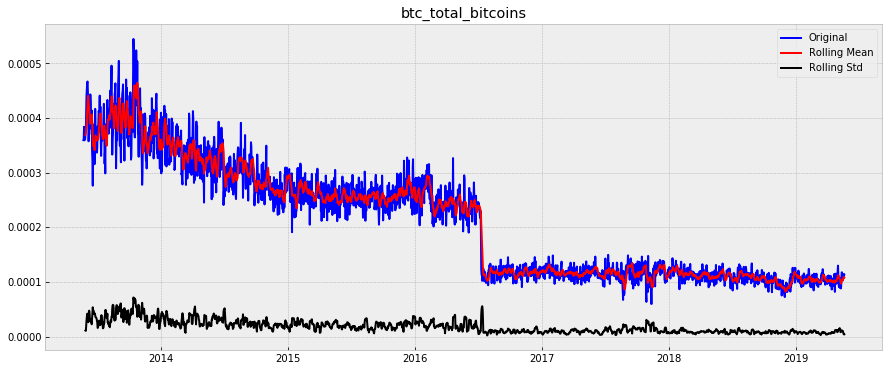

Results of Dickey-Fuller Test:
Test Statistic                   -1.583331
p-value                           0.491962
#Lags Used                       24.000000
Number of Observations Used    2164.000000
Critical Value (1%)              -3.433375
Critical Value (5%)              -2.862877
Critical Value (10%)             -2.567482
dtype: float64


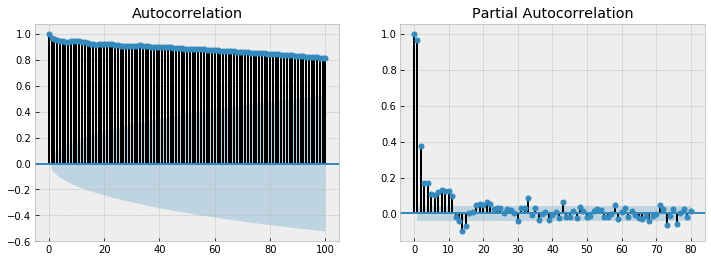

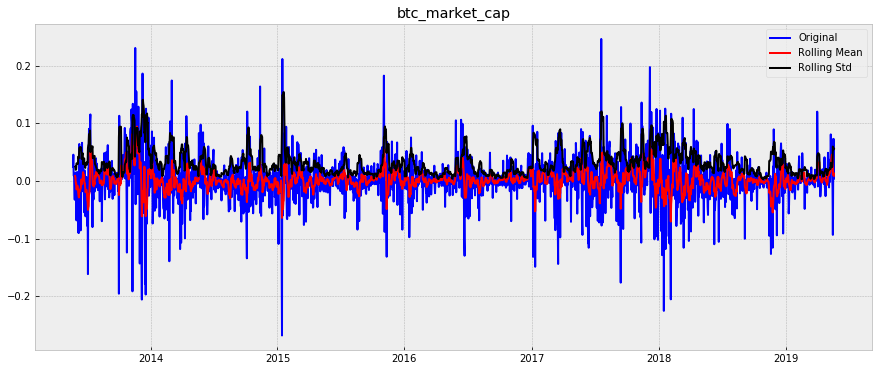

Results of Dickey-Fuller Test:
Test Statistic                -1.190721e+01
p-value                        5.401038e-22
#Lags Used                     1.000000e+01
Number of Observations Used    2.178000e+03
Critical Value (1%)           -3.433356e+00
Critical Value (5%)           -2.862868e+00
Critical Value (10%)          -2.567477e+00
dtype: float64


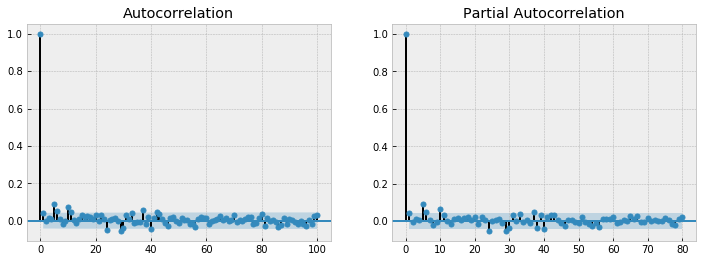

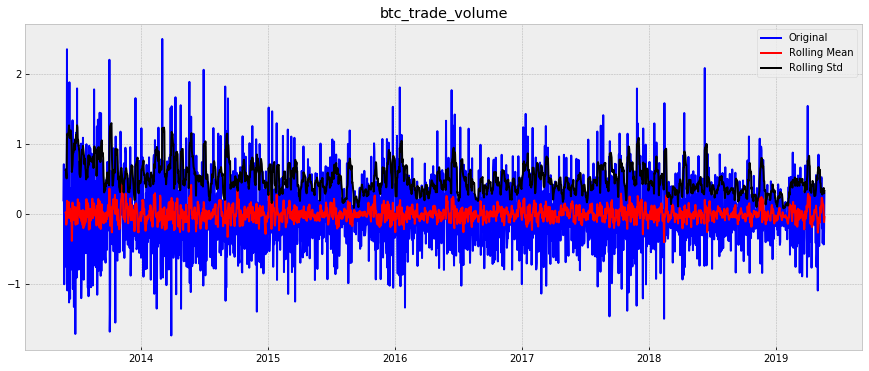

Results of Dickey-Fuller Test:
Test Statistic                -1.175658e+01
p-value                        1.174714e-21
#Lags Used                     2.600000e+01
Number of Observations Used    2.162000e+03
Critical Value (1%)           -3.433378e+00
Critical Value (5%)           -2.862878e+00
Critical Value (10%)          -2.567482e+00
dtype: float64


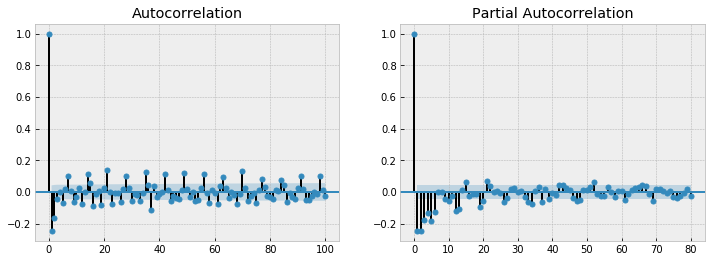

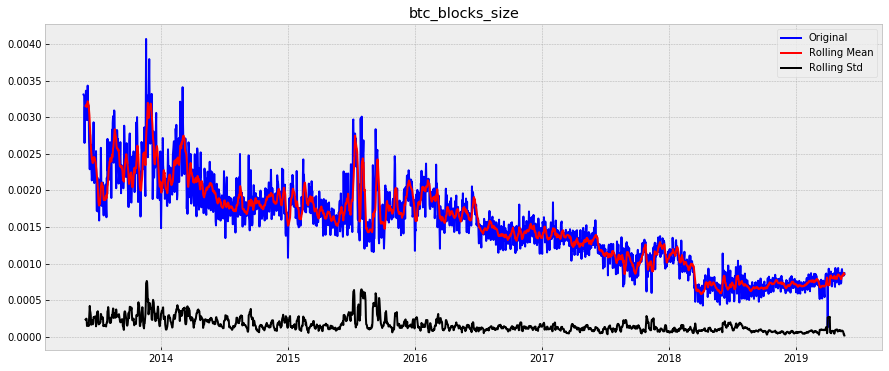

Results of Dickey-Fuller Test:
Test Statistic                   -2.070770
p-value                           0.256429
#Lags Used                       26.000000
Number of Observations Used    2162.000000
Critical Value (1%)              -3.433378
Critical Value (5%)              -2.862878
Critical Value (10%)             -2.567482
dtype: float64


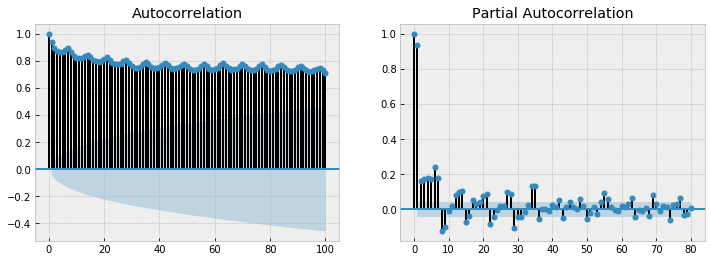

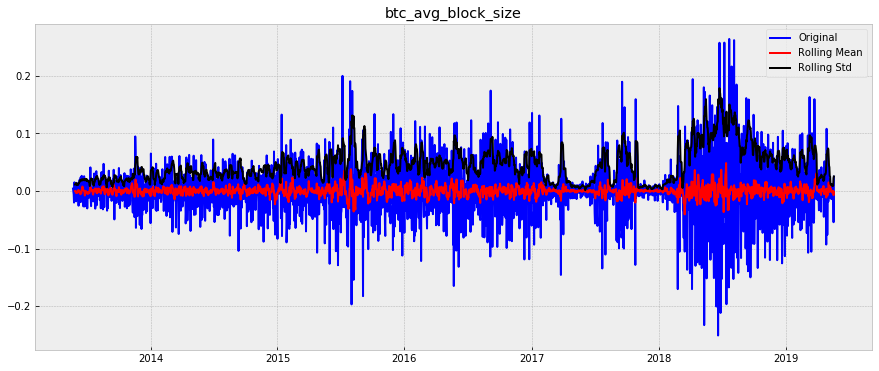

Results of Dickey-Fuller Test:
Test Statistic                -1.458399e+01
p-value                        4.422105e-27
#Lags Used                     2.600000e+01
Number of Observations Used    2.162000e+03
Critical Value (1%)           -3.433378e+00
Critical Value (5%)           -2.862878e+00
Critical Value (10%)          -2.567482e+00
dtype: float64


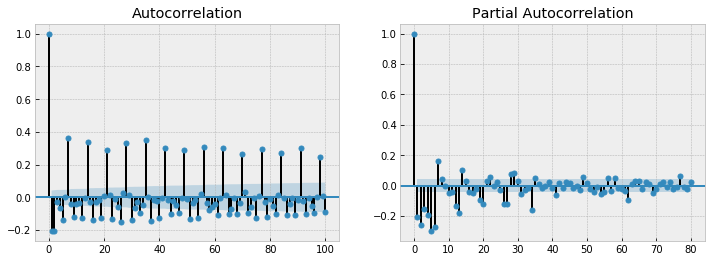

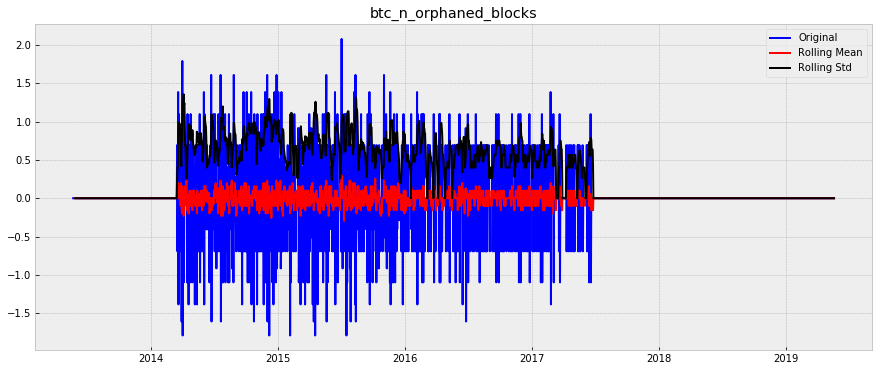

Results of Dickey-Fuller Test:
Test Statistic                -1.527713e+01
p-value                        4.631423e-28
#Lags Used                     2.600000e+01
Number of Observations Used    2.162000e+03
Critical Value (1%)           -3.433378e+00
Critical Value (5%)           -2.862878e+00
Critical Value (10%)          -2.567482e+00
dtype: float64


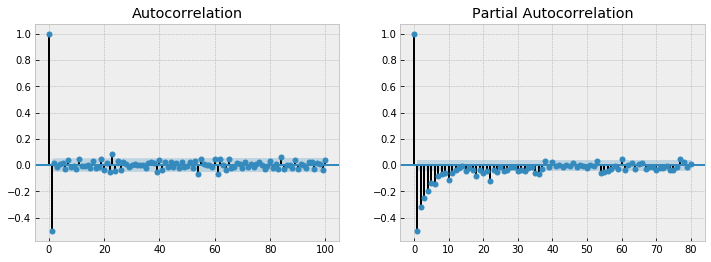

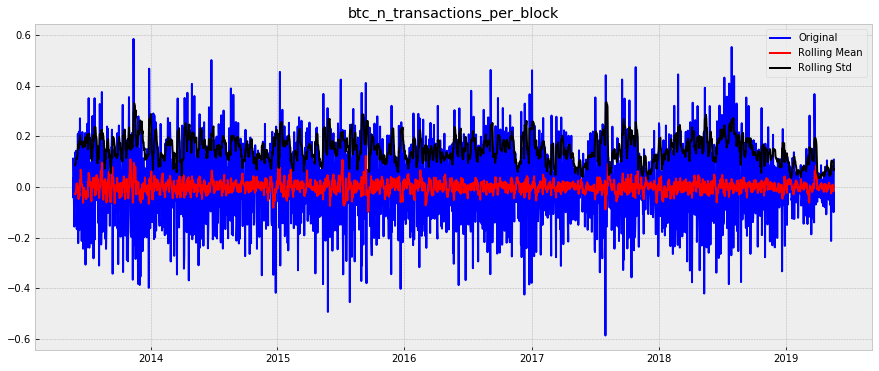

Results of Dickey-Fuller Test:
Test Statistic                -1.283257e+01
p-value                        5.831169e-24
#Lags Used                     2.600000e+01
Number of Observations Used    2.162000e+03
Critical Value (1%)           -3.433378e+00
Critical Value (5%)           -2.862878e+00
Critical Value (10%)          -2.567482e+00
dtype: float64


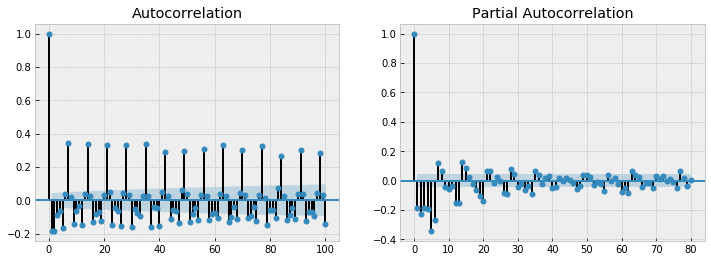

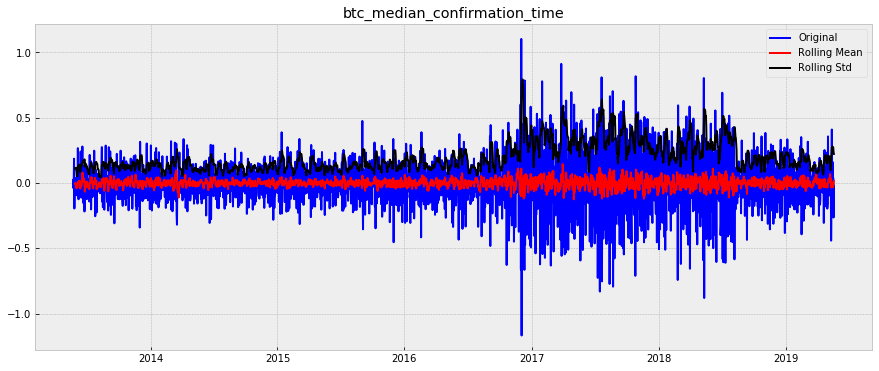

Results of Dickey-Fuller Test:
Test Statistic                -1.447279e+01
p-value                        6.563381e-27
#Lags Used                     2.500000e+01
Number of Observations Used    2.163000e+03
Critical Value (1%)           -3.433377e+00
Critical Value (5%)           -2.862877e+00
Critical Value (10%)          -2.567482e+00
dtype: float64


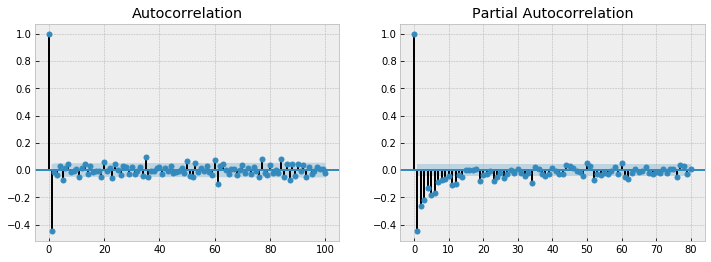

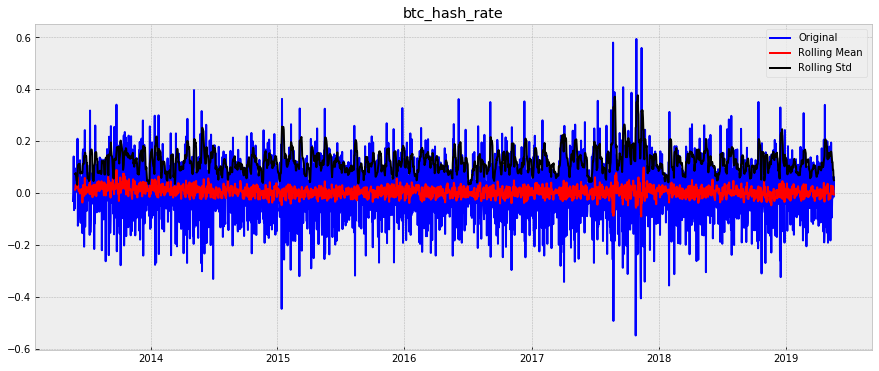

Results of Dickey-Fuller Test:
Test Statistic                -6.239185e+00
p-value                        4.743137e-08
#Lags Used                     2.400000e+01
Number of Observations Used    2.164000e+03
Critical Value (1%)           -3.433375e+00
Critical Value (5%)           -2.862877e+00
Critical Value (10%)          -2.567482e+00
dtype: float64


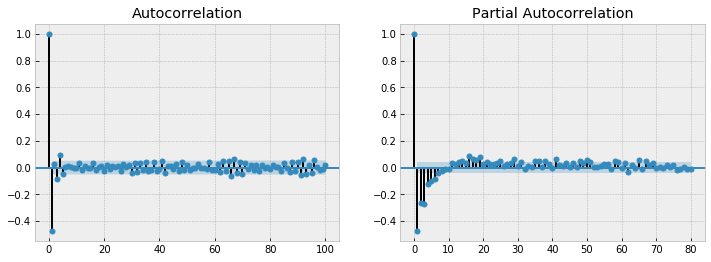

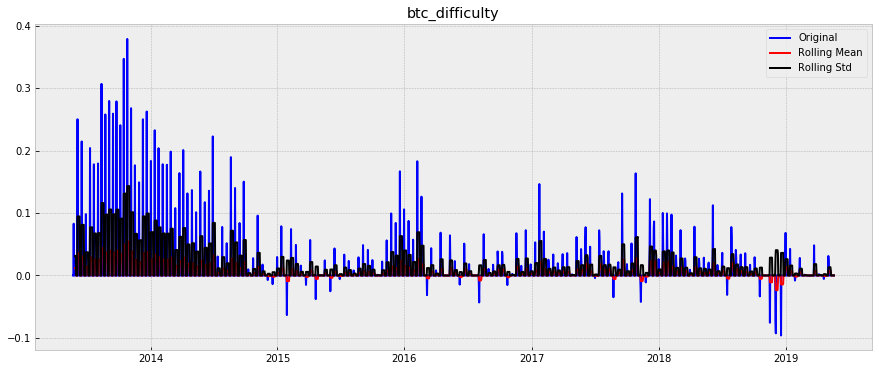

Results of Dickey-Fuller Test:
Test Statistic                   -4.510303
p-value                           0.000188
#Lags Used                       26.000000
Number of Observations Used    2162.000000
Critical Value (1%)              -3.433378
Critical Value (5%)              -2.862878
Critical Value (10%)             -2.567482
dtype: float64


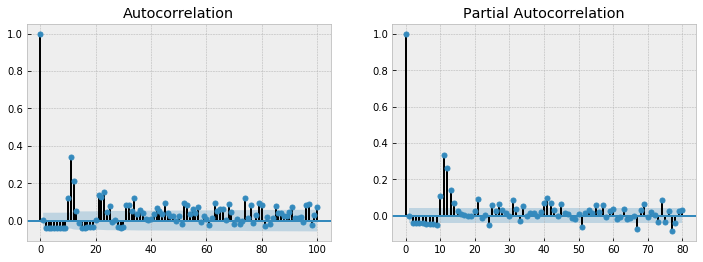

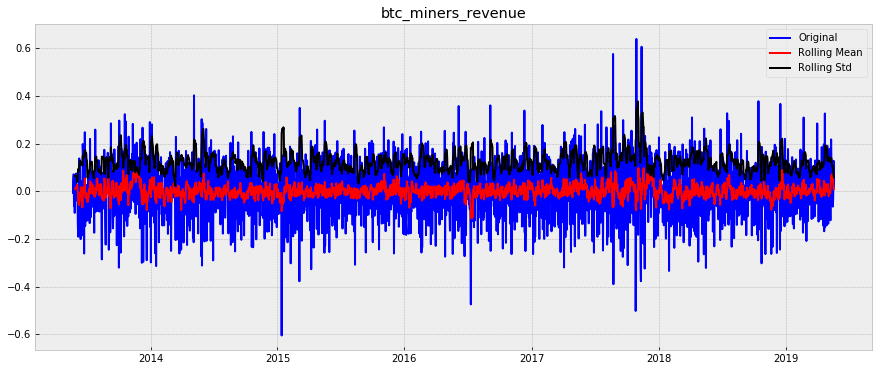

Results of Dickey-Fuller Test:
Test Statistic                  -30.919441
p-value                           0.000000
#Lags Used                        3.000000
Number of Observations Used    2185.000000
Critical Value (1%)              -3.433346
Critical Value (5%)              -2.862864
Critical Value (10%)             -2.567475
dtype: float64


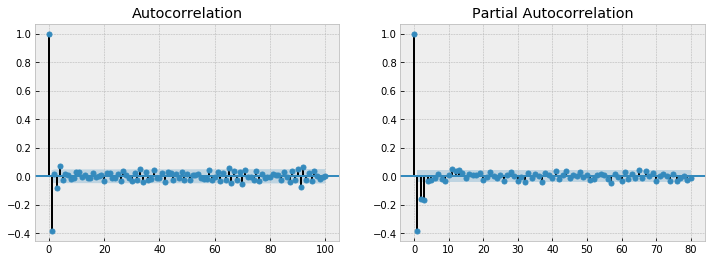

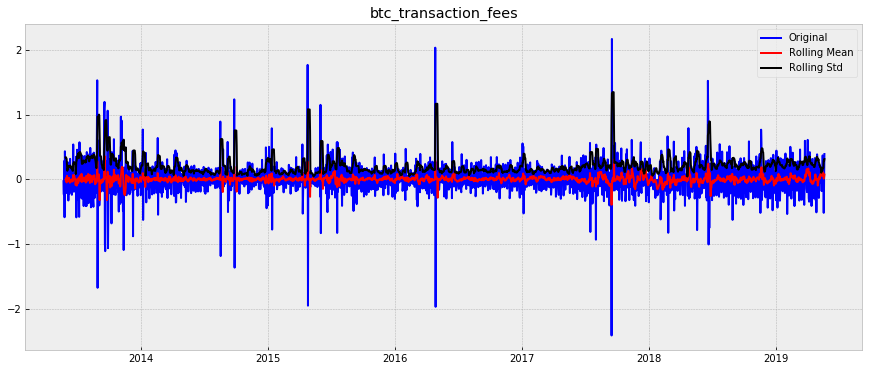

Results of Dickey-Fuller Test:
Test Statistic                -1.095549e+01
p-value                        8.583532e-20
#Lags Used                     2.600000e+01
Number of Observations Used    2.162000e+03
Critical Value (1%)           -3.433378e+00
Critical Value (5%)           -2.862878e+00
Critical Value (10%)          -2.567482e+00
dtype: float64


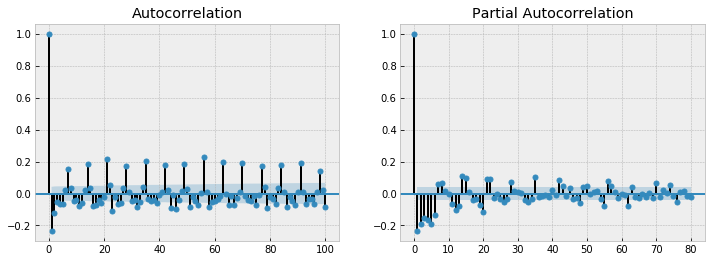

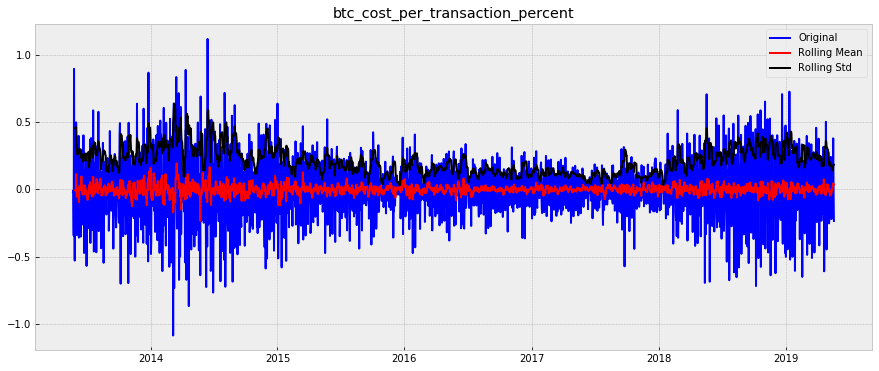

Results of Dickey-Fuller Test:
Test Statistic                -1.365374e+01
p-value                        1.568041e-25
#Lags Used                     2.600000e+01
Number of Observations Used    2.162000e+03
Critical Value (1%)           -3.433378e+00
Critical Value (5%)           -2.862878e+00
Critical Value (10%)          -2.567482e+00
dtype: float64


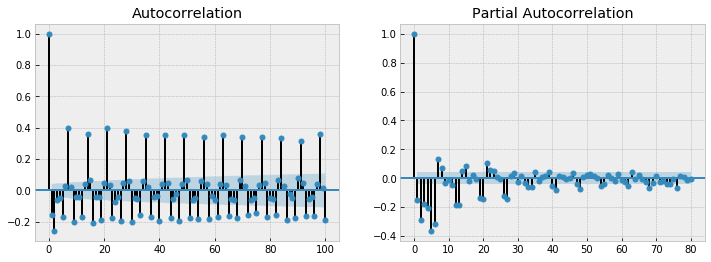

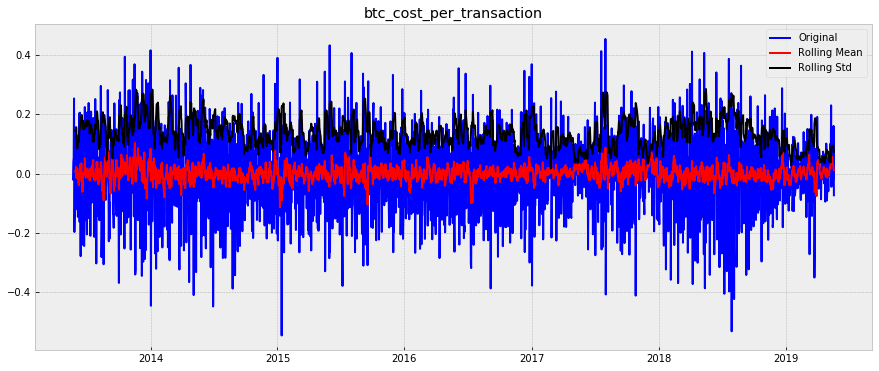

Results of Dickey-Fuller Test:
Test Statistic                -1.020282e+01
p-value                        5.909000e-18
#Lags Used                     2.600000e+01
Number of Observations Used    2.162000e+03
Critical Value (1%)           -3.433378e+00
Critical Value (5%)           -2.862878e+00
Critical Value (10%)          -2.567482e+00
dtype: float64


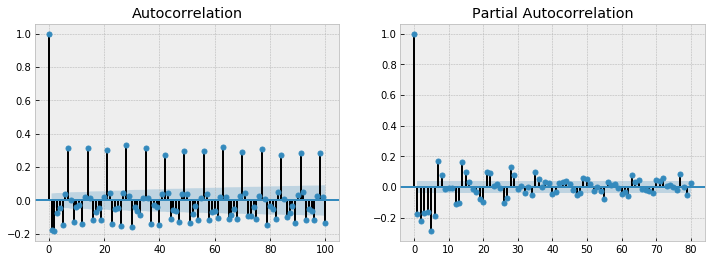

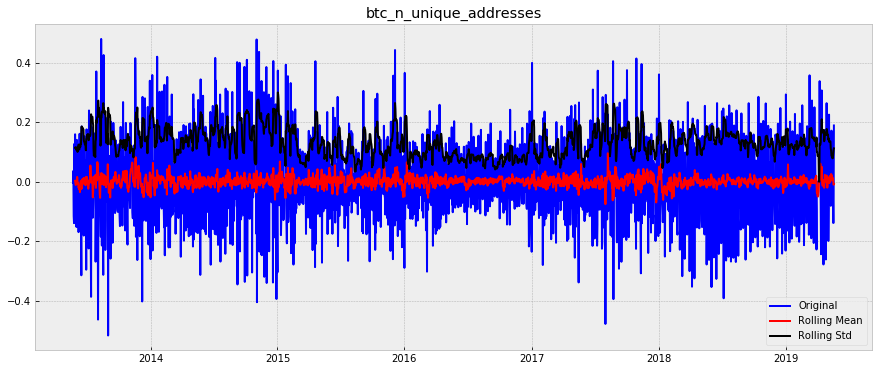

Results of Dickey-Fuller Test:
Test Statistic                -1.170444e+01
p-value                        1.540926e-21
#Lags Used                     2.600000e+01
Number of Observations Used    2.162000e+03
Critical Value (1%)           -3.433378e+00
Critical Value (5%)           -2.862878e+00
Critical Value (10%)          -2.567482e+00
dtype: float64


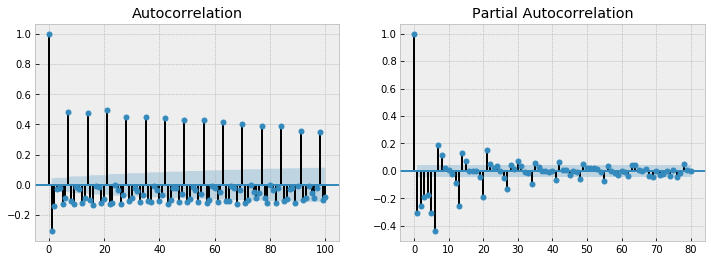

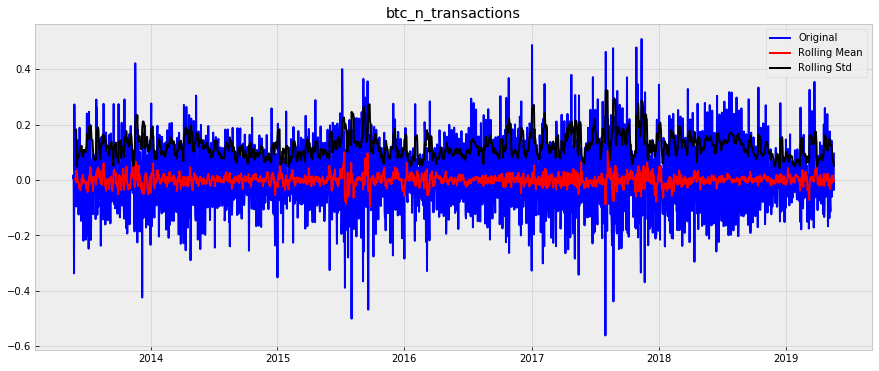

Results of Dickey-Fuller Test:
Test Statistic                -1.250794e+01
p-value                        2.714321e-23
#Lags Used                     2.600000e+01
Number of Observations Used    2.162000e+03
Critical Value (1%)           -3.433378e+00
Critical Value (5%)           -2.862878e+00
Critical Value (10%)          -2.567482e+00
dtype: float64


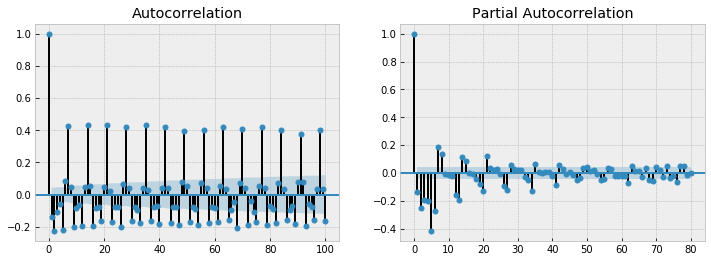

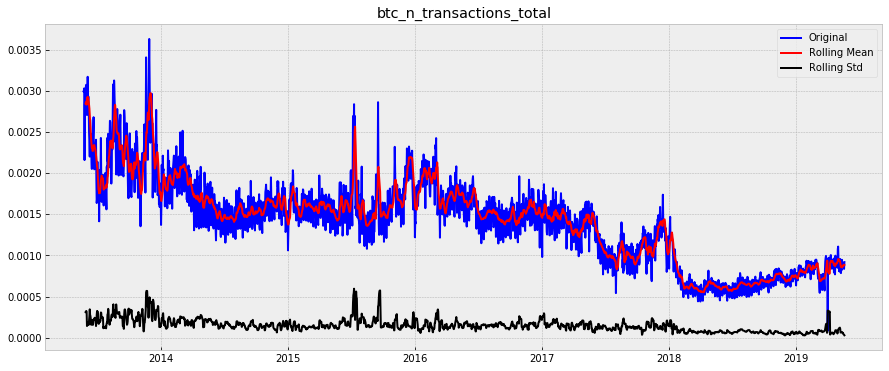

Results of Dickey-Fuller Test:
Test Statistic                   -2.333952
p-value                           0.161251
#Lags Used                       26.000000
Number of Observations Used    2162.000000
Critical Value (1%)              -3.433378
Critical Value (5%)              -2.862878
Critical Value (10%)             -2.567482
dtype: float64


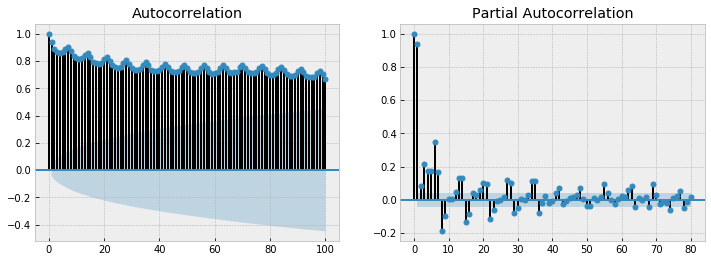

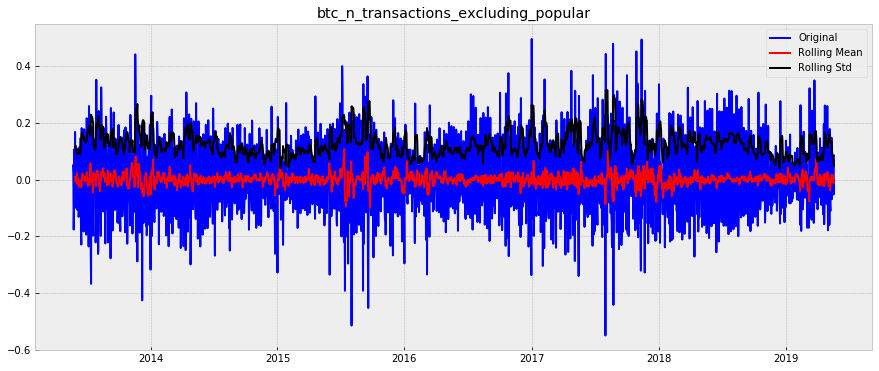

Results of Dickey-Fuller Test:
Test Statistic                -1.227443e+01
p-value                        8.495790e-23
#Lags Used                     2.600000e+01
Number of Observations Used    2.162000e+03
Critical Value (1%)           -3.433378e+00
Critical Value (5%)           -2.862878e+00
Critical Value (10%)          -2.567482e+00
dtype: float64


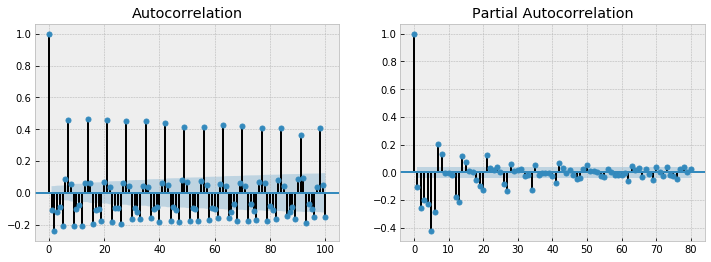

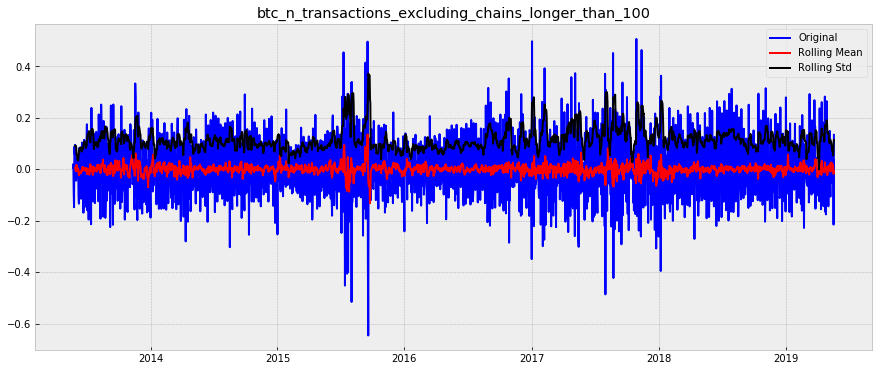

Results of Dickey-Fuller Test:
Test Statistic                -1.168282e+01
p-value                        1.724996e-21
#Lags Used                     2.600000e+01
Number of Observations Used    2.162000e+03
Critical Value (1%)           -3.433378e+00
Critical Value (5%)           -2.862878e+00
Critical Value (10%)          -2.567482e+00
dtype: float64


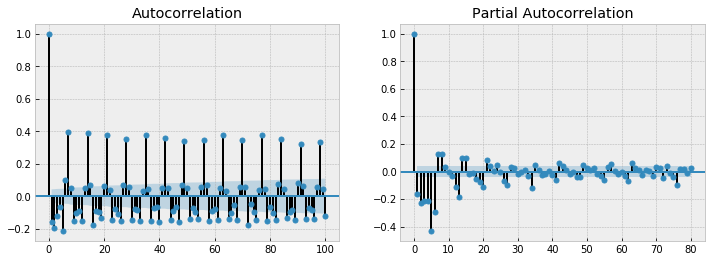

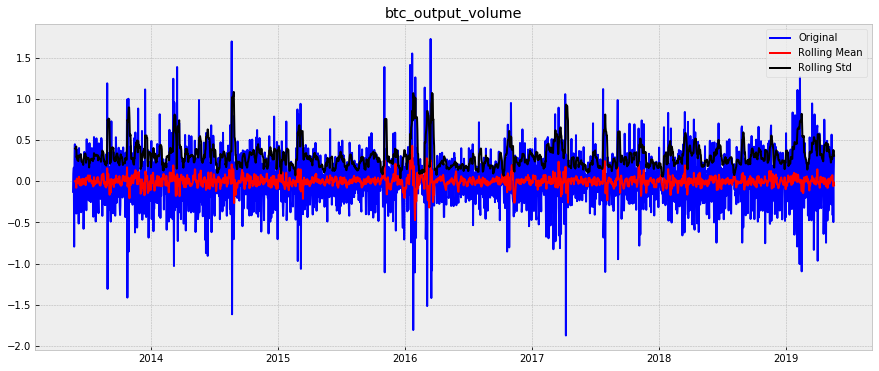

Results of Dickey-Fuller Test:
Test Statistic                -1.524236e+01
p-value                        5.141763e-28
#Lags Used                     2.600000e+01
Number of Observations Used    2.162000e+03
Critical Value (1%)           -3.433378e+00
Critical Value (5%)           -2.862878e+00
Critical Value (10%)          -2.567482e+00
dtype: float64


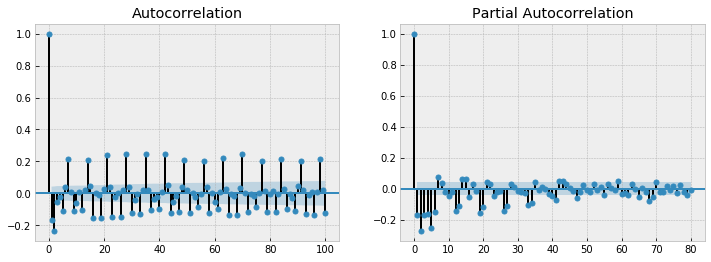

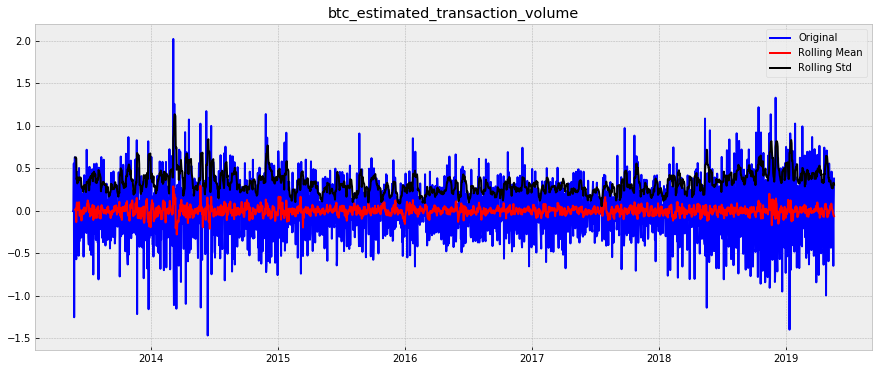

Results of Dickey-Fuller Test:
Test Statistic                -1.337322e+01
p-value                        5.148550e-25
#Lags Used                     2.600000e+01
Number of Observations Used    2.162000e+03
Critical Value (1%)           -3.433378e+00
Critical Value (5%)           -2.862878e+00
Critical Value (10%)          -2.567482e+00
dtype: float64


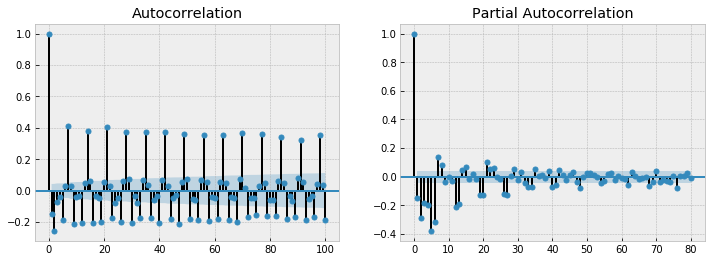

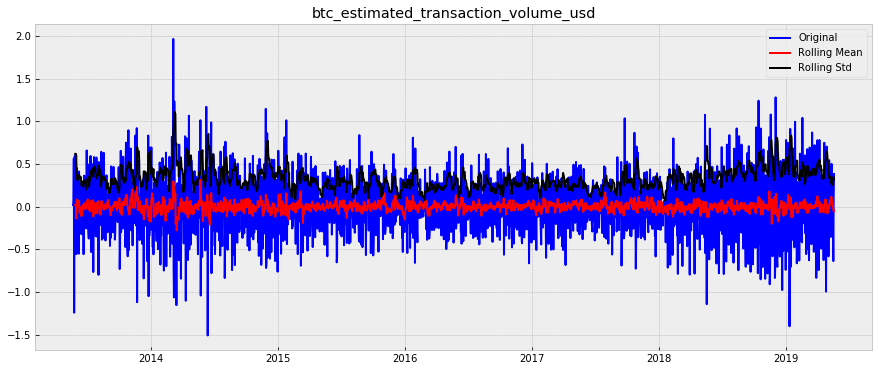

Results of Dickey-Fuller Test:
Test Statistic                -1.150107e+01
p-value                        4.490383e-21
#Lags Used                     2.600000e+01
Number of Observations Used    2.162000e+03
Critical Value (1%)           -3.433378e+00
Critical Value (5%)           -2.862878e+00
Critical Value (10%)          -2.567482e+00
dtype: float64


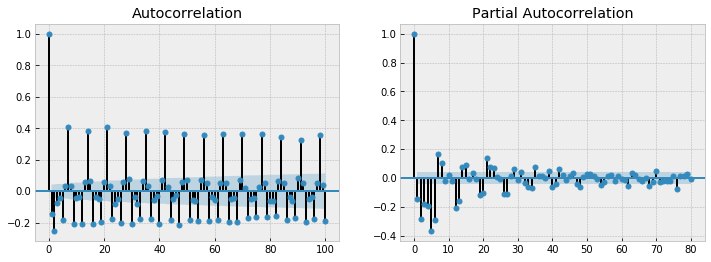

In [38]:
#test for stationarity btc_blochain_log_diff

for i in btc_bloackchain_dataset_1diff_log_trasf.columns:
    test_stationarity_1(btc_bloackchain_dataset_1diff_log_trasf[i], i, 7)

In [ ]:
#test stationarity btc_blockchain_full_stat

for i in btc_bloackchain_dataset_full_stat.columns:
    test_stationarity_1(btc_bloackchain_dataset_full_stat[i], i, 7)

Weekly seasonality plots

In [ ]:
#define how to show weekly seasonality: aggregation, boxplots, smoothing statistics
#which variable with weekly seasonality
# find a way to display variable seasonality for some series
def plot_weekly_seas(series, interval = 7):
    

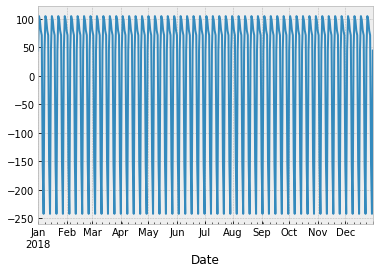

In [182]:
seas_block_pop = btc_bloackchain_dataset['2018']

btc_n_transactions_per_block_seas = sm.tsa.seasonal_decompose(seas_block_pop.btc_n_transactions_per_block, freq=7)
btc_n_transactions_per_block_seas.seasonal.plot()

In [ ]:
#show seasonality of some transcation variables

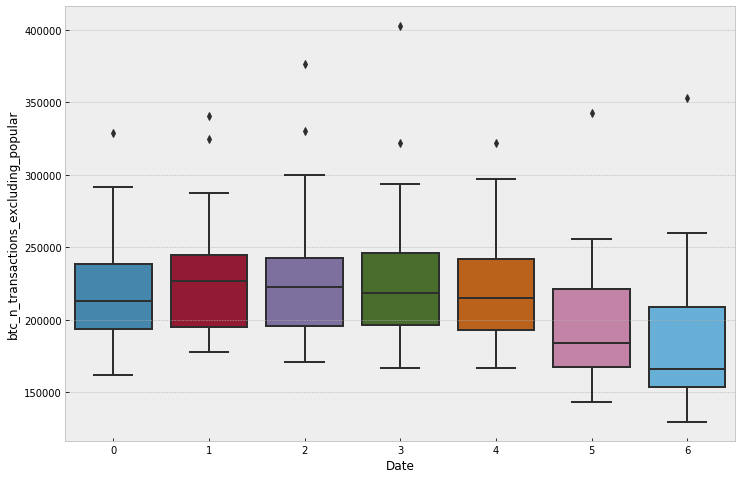

In [183]:
fig, ax = plt.subplots(figsize = (12,8))
ax = sns.boxplot(data=seas_block_pop, y = 'btc_n_transactions_excluding_popular', x= seas_block_pop.index.dayofweek)
ax.xlabel = ['Mon', 'Tues', 'Wed', 'Thurs', 'Fri', 'Sat', 'Sun']

Lag scatter-plot analysis

In [ ]:
#show how variable change with Bitcoin price (scatter plots)
#explore cross-correlation before and after stationarization. Invesrigate spurious correlation according to the paper

In [ ]:
#Perform the Augmented Dickey-Fuller Test on the raw, logarithm, first difference, rolling mean diff, seasonal difference, seasonal decomposition residual for each bloak chain variables.
#Plot rolling mean and variance to ascertain stationarity, make sure to select the tarsformation with the lowest p-value.
#show ACF and PACF for each varible.
#after this start modelling
# 1 visualize the time series 
# 2 stationarize the series
# 3 plot ACF/PACF chart and find optimal parameter
# 4 Build the arima model
# 5 make predictions

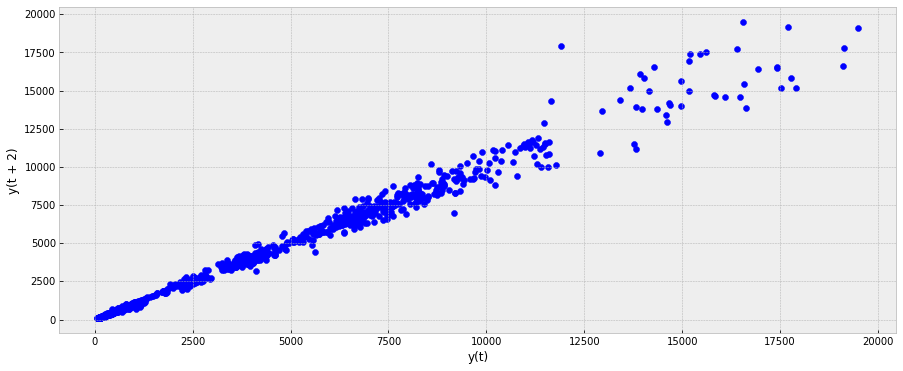

In [89]:
lag_plot(btc_price.Close, 2)
#random walk

D:\andrea\Anaconda3\lib\site-packages\seaborn\axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


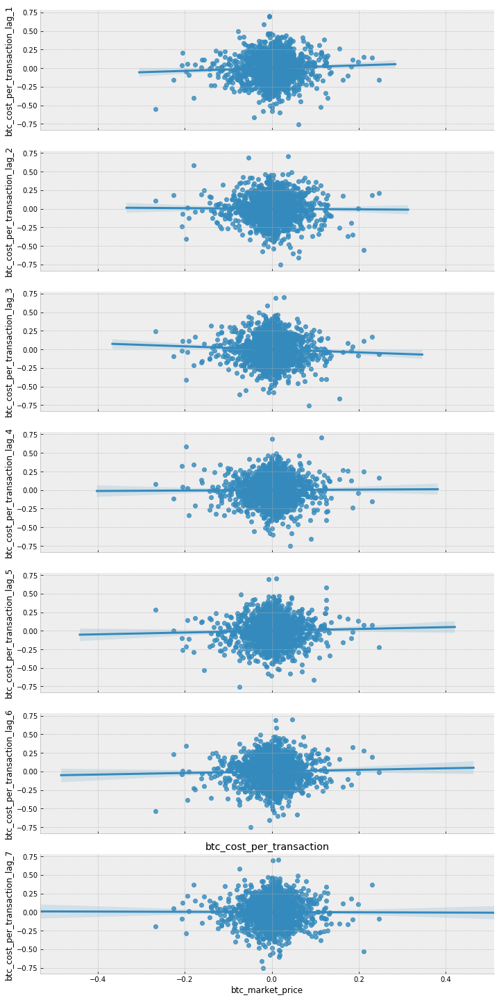

In [251]:
#scatterplots with target variable, make it for each variable in the dataset
#function to create lag scatterplot with different
# lagged scatterplot matrix to unravel hidden non-linear relation among variables
# craete a scatter plot matrix of the lagged price varaible t-1 against time t

def crosscorr(df, target, datay = None, lags = 0):
    ''' Function to create lag scatter plots of datay for lags from 1 to lags'''
    new = pd.DataFrame(index=df.index)
    new[target] = df[target]
    for i in range(1,lags+1):
        new[datay + '_lag_{}'.format(i)] = df[datay].shift(i)
    
    g = sns.pairplot(data=new, x_vars=[target], y_vars=[i for i in new.columns if 'lag' in i], size=8, aspect=0.6, kind="reg")
    g.fig.set_figheight(20)
    g.fig.set_figwidth(10)
    plt.title(datay)
    plt.tight_layout()
    
    return g

crosscorr(btc_bloackchain_dataset_log_full_stat, 'btc_market_price', 'btc_cost_per_transaction', lags = 7)

Cross-Correlation analysis

In [203]:
#display cross correlation between target and each variable.
#create dataframe of time shifted features

def shifted_df(df, target = None, lag = 0):
    '''Function to create shifted dataset'''
    if not target and not lag:
        return df
    new = {}
    for col in df.columns:
        if col == target:
            new[col] = df[col]
        else:
            new[col + '_lag_{}'.format(lag)] = df[col].shift(lag)
    return pd.DataFrame(data = new)

In [222]:
btc_bloackchain_dataset_shifted_1 = shifted_df(btc_bloackchain_dataset, 'btc_market_price', lag = 1)

In [227]:
btc_bloackchain_dataset_1diff_log_trasf_shifted_1 = shifted_df(btc_bloackchain_dataset_1diff_log_trasf, 'btc_market_price', 1)
btc_bloackchain_dataset_1diff_log_trasf_shifted_7 = shifted_df(btc_bloackchain_dataset_1diff_log_trasf, 'btc_market_price', 7)


In [231]:
btc_bloackchain_dataset_log_full_stat_shifted_1 = shifted_df(btc_bloackchain_dataset_log_full_stat, 'btc_market_price', lag = 1)

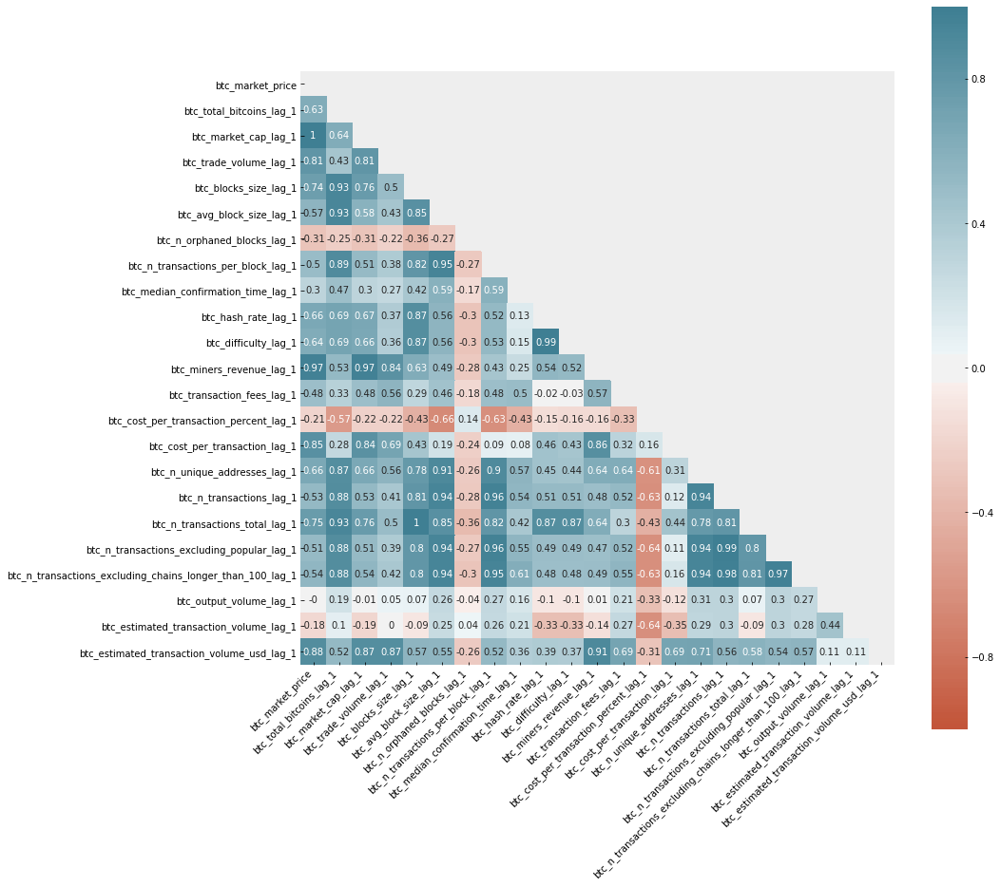

In [211]:
#lag_1 correlation before stationarization

mask = np.zeros_like(btc_bloackchain_dataset_shifted_1.corr())
mask[np.triu_indices_from(mask)] = True

corr = np.around(btc_bloackchain_dataset_shifted_1.corr(), decimals=2)
fig, ax = plt.subplots(figsize = (14,14))
ax = sns.heatmap(
    corr, 
    mask=mask,
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot = True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);
plt.savefig('bTC_blockchain_lag_1_corr_not_stationary.png', format='png', dpi=300)

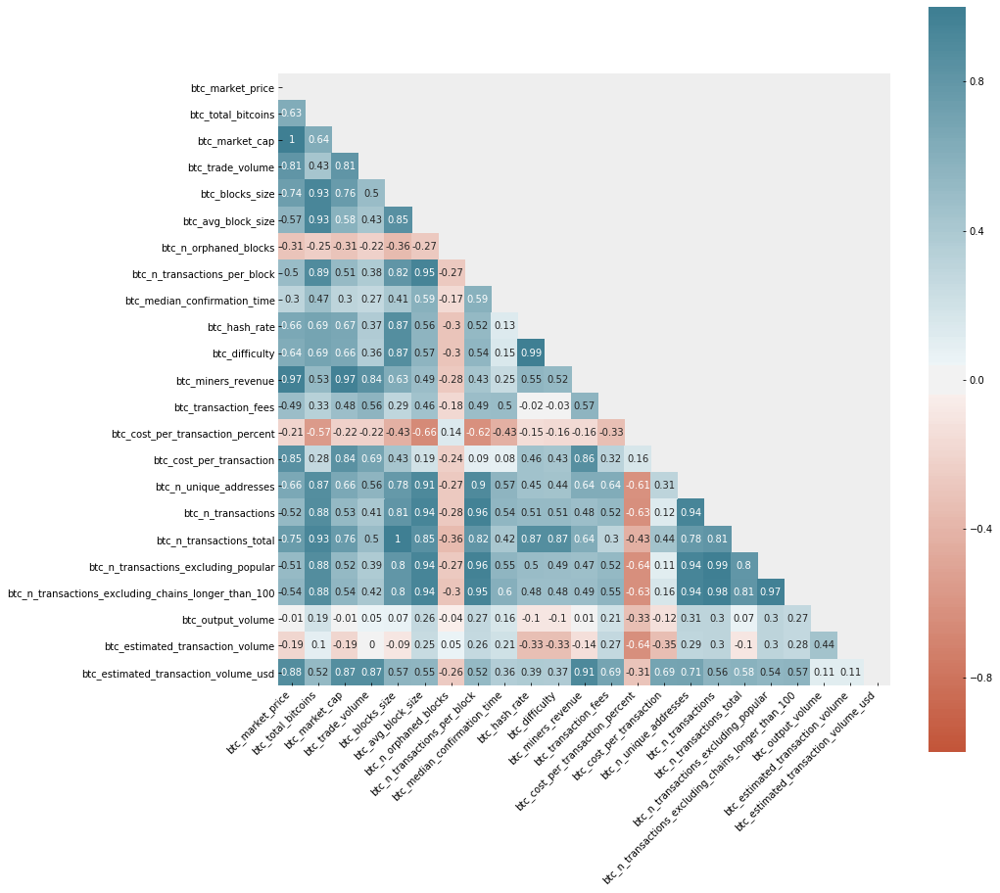

In [225]:
#lag_0 correlation before stationarization

mask = np.zeros_like(btc_bloackchain_dataset.corr())
mask[np.triu_indices_from(mask)] = True

corr = np.around(btc_bloackchain_dataset.corr(), decimals=2)
fig, ax = plt.subplots(figsize = (14,14))
ax = sns.heatmap(
    corr, 
    mask=mask,
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot = True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);
plt.savefig('BTC_blockchain_lag_0_corr_not_stationary.png', format='png', dpi=300)

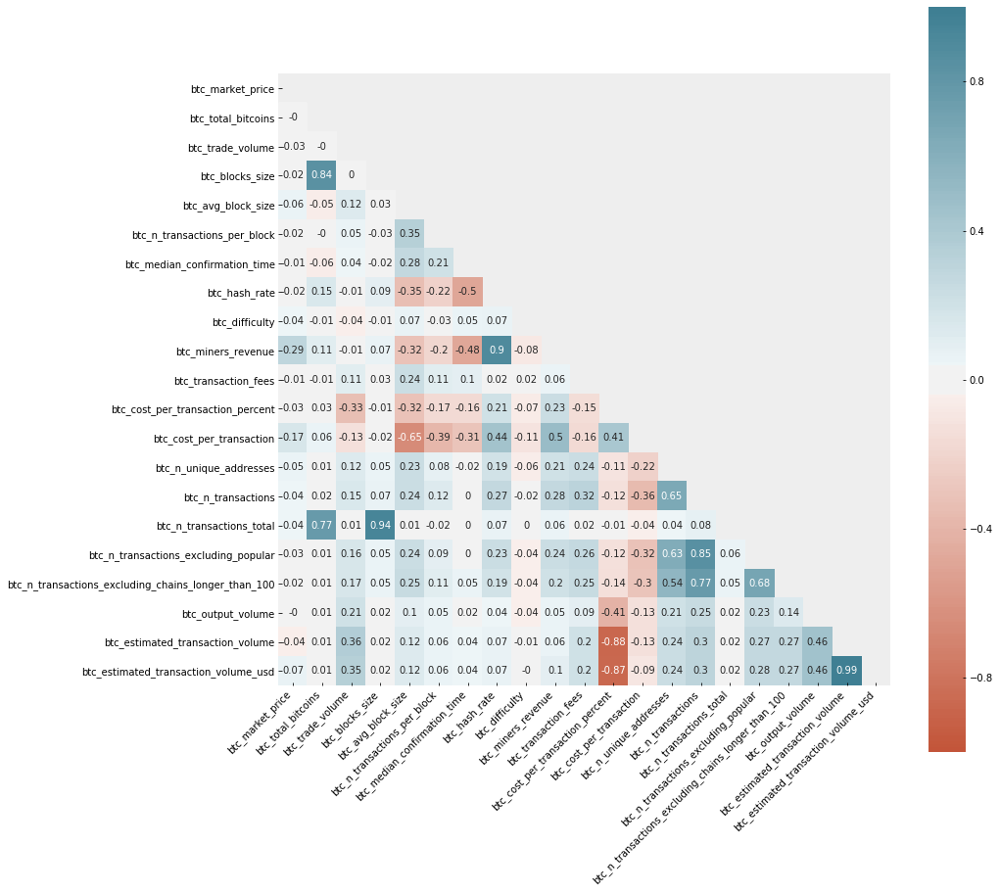

In [232]:
#lag_0 correlation after stationarization

mask = np.zeros_like(btc_bloackchain_dataset_log_full_stat.corr())
mask[np.triu_indices_from(mask)] = True

corr = np.around(btc_bloackchain_dataset_log_full_stat.corr(), decimals=2)
fig, ax = plt.subplots(figsize = (14,14))
ax = sns.heatmap(
    corr, 
    mask=mask,
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot = True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);
plt.savefig('BTC_blockchain_lag_0_corr_stationary.png', format='png', dpi=300)

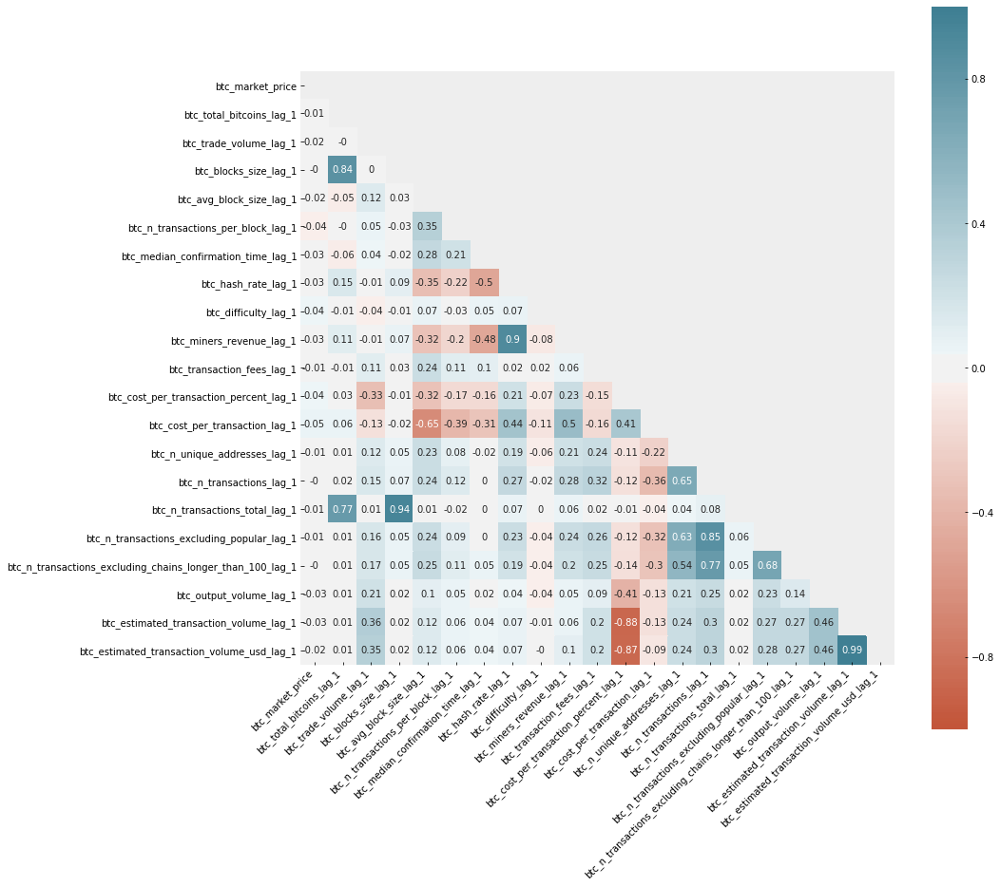

In [239]:
# correlation after stationarization - lag 1

mask = np.zeros_like(btc_bloackchain_dataset_log_full_stat_shifted_1.corr())
mask[np.triu_indices_from(mask)] = True

corr = np.around(btc_bloackchain_dataset_log_full_stat_shifted_1.corr(), decimals=2)
fig, ax = plt.subplots(figsize = (14,14))
ax = sns.heatmap(
    corr, 
    mask=mask,
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot = True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);
plt.savefig('bTC_blockchain_lag_1_corr_stationary.png', format='png', dpi=300)

In [ ]:
#lag_1 correlation after stationarization
corr = np.around(btc_bloackchain_dataset.corr(), decimals=2)
fig, ax = plt.subplots(figsize = (12,12))
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot = True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

In [ ]:
#each row correspond to a different lag and each column to each variables (correlation with target variable)
#btc_bloackchain_dataset cross-correlation
lagged_correlation_btc_block_chain_lag_0_nn_stat = pd.DataFrame.from_dict(
    {x: [btc_bloackchain_dataset['btc_market_price'].corr(btc_bloackchain_dataset[x].shift(t)) for t in range(0,50)] for x in btc_bloackchain_dataset.columns})

lagged_correlation_btc_block_chain_lag_0_nn_stat

In [248]:
#each row correspond to a different lag and each column to each variables (correlation with target variable)
#btc_bloackchain_dataset cross-correlation
lagged_correlation_btc_block_chain_lag_1_stat = pd.DataFrame.from_dict(
    {x: [btc_bloackchain_dataset_full_stat['btc_market_price'].corr(btc_bloackchain_dataset_full_stat[x].shift(t)) for t in range(0,50)] for x in btc_bloackchain_dataset_full_stat.columns})

lagged_correlation_btc_block_chain_lag_1_stat

,btc_market_price,btc_total_bitcoins,btc_trade_volume,btc_blocks_size,btc_avg_block_size,btc_n_transactions_per_block,btc_median_confirmation_time,btc_hash_rate,btc_difficulty,btc_miners_revenue,...,btc_cost_per_transaction_percent,btc_cost_per_transaction,btc_n_unique_addresses,btc_n_transactions,btc_n_transactions_total,btc_n_transactions_excluding_popular,btc_n_transactions_excluding_chains_longer_than_100,btc_output_volume,btc_estimated_transaction_volume,btc_estimated_transaction_volume_usd
0,1.000000,0.001787,-0.031507,0.011402,0.057917,0.021073,-0.009602,-0.021120,0.040988,0.287851,...,0.028052,0.172857,0.052865,0.039365,0.025269,0.034899,0.021799,-0.003784,-0.040903,0.068413
1,0.043323,0.004125,0.020240,0.001124,-0.023616,-0.039054,0.028317,0.033811,0.037882,0.034330,...,0.037651,0.046550,-0.005567,-0.001271,0.016487,0.006883,-0.000768,-0.030140,-0.028310,-0.021562
2,-0.002100,0.002608,-0.038060,0.003075,-0.012684,-0.006842,-0.015978,0.013578,-0.046272,0.016859,...,0.025091,-0.009850,0.033498,0.041303,0.017423,0.030122,0.021211,0.050520,-0.018681,-0.018520
3,0.012165,0.004799,0.030095,0.006003,0.032177,0.004824,0.040850,-0.023677,0.000789,-0.021319,...,-0.041823,-0.050789,-0.011552,0.008208,0.017659,0.018763,0.006518,0.048012,0.037577,0.030390
4,0.005799,0.005954,0.022410,0.012141,-0.007803,0.021770,-0.040515,0.016570,-0.005142,0.020759,...,0.001382,0.007722,0.008734,-0.010270,0.023138,-0.015312,0.009862,-0.017876,-0.001975,-0.006121
5,0.093479,0.004602,0.018123,0.009866,-0.007439,0.027728,0.026950,-0.009610,-0.042827,0.021346,...,-0.006332,0.030083,0.002478,-0.004947,0.021839,-0.012796,-0.025986,-0.018728,0.016004,0.025186
6,0.052990,0.002789,-0.031090,0.002568,-0.003054,-0.005592,-0.008195,0.028166,-0.005040,0.040720,...,0.030793,0.026386,-0.000231,0.017167,0.013290,0.007865,0.008863,-0.000848,-0.024339,-0.016215
7,0.011910,0.000299,0.016099,-0.005076,-0.009642,0.002098,0.002716,-0.002426,-0.025235,0.010826,...,-0.019829,-0.004125,-0.012651,0.000281,0.001901,0.009915,0.017507,-0.009169,0.007484,0.007011
8,-0.015318,0.001790,-0.009854,-0.005914,-0.002669,0.031879,-0.006548,-0.031018,0.013376,-0.026818,...,-0.008095,-0.006020,0.002973,-0.013278,-0.000129,-0.015796,-0.032132,0.014819,0.009910,0.005397
9,-0.002390,0.005955,0.019851,0.000947,0.009759,-0.006307,-0.005166,0.004181,0.014750,-0.011911,...,-0.032123,-0.025487,-0.017163,-0.001581,0.009880,-0.002302,0.024080,0.001687,0.023058,0.020202


D:\andrea\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:1971: RuntimeWarning: invalid value encountered in sqrt
  correls /= np.sqrt(np.dot(x, x) * np.dot(y, y))


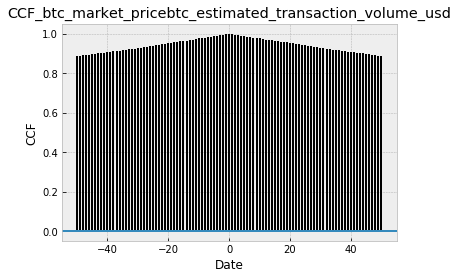

In [245]:
#cross correlation plot
def cross_corr(timeseries, target, title):
    plt.xcorr(target, timeseries, maxlags = 50, usevlines = 1)
    plt.title('CCF_btc_market_price' + title)
    plt.xlabel('Date')
    plt.ylabel('CCF')


cross_corr(btc_bloackchain_dataset['btc_market_price'], btc_bloackchain_dataset[], )

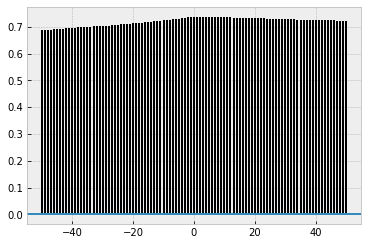

In [243]:

t = plt.xcorr(btc_bloackchain_dataset['btc_market_price'], btc_bloackchain_dataset['btc_avg_block_size'], maxlags = 50, usevlines = 1)


Granger Causality test

In [256]:

for i in btc_bloackchain_dataset_log_full_stat.columns:
    print(i)
    tsa.grangercausalitytests(btc_bloackchain_dataset_log_full_stat[['btc_market_price', i]], maxlag=10)

btc_market_price

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0000  , p=1.0000  , df_denom=2179, df_num=1
ssr based chi2 test:   chi2=0.0000  , p=1.0000  , df=1
likelihood ratio test: chi2=-0.0000 , p=1.0000  , df=1
parameter F test:         F=4.0973  , p=0.0431  , df_denom=2179, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.0000  , p=1.0000  , df_denom=2177, df_num=2
ssr based chi2 test:   chi2=0.0000  , p=1.0000  , df=2
likelihood ratio test: chi2=-0.0000 , p=1.0000  , df=2
parameter F test:         F=2.0693  , p=0.1265  , df_denom=2177, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.0000  , p=1.0000  , df_denom=2175, df_num=3
ssr based chi2 test:   chi2=0.0000  , p=1.0000  , df=3
likelihood ratio test: chi2=-0.0000 , p=1.0000  , df=3
parameter F test:         F=1.4981  , p=0.2131  , df_denom=2175, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:        

ssr based F test:         F=1.2354  , p=0.2937  , df_denom=2169, df_num=4
ssr based chi2 test:   chi2=4.9623  , p=0.2912  , df=4
likelihood ratio test: chi2=4.9566  , p=0.2918  , df=4
parameter F test:         F=1.2354  , p=0.2937  , df_denom=2169, df_num=4

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.4012  , p=0.2207  , df_denom=2166, df_num=5
ssr based chi2 test:   chi2=7.0416  , p=0.2176  , df=5
likelihood ratio test: chi2=7.0303  , p=0.2184  , df=5
parameter F test:         F=1.4012  , p=0.2207  , df_denom=2166, df_num=5

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.2063  , p=0.2999  , df_denom=2163, df_num=6
ssr based chi2 test:   chi2=7.2813  , p=0.2956  , df=6
likelihood ratio test: chi2=7.2691  , p=0.2967  , df=6
parameter F test:         F=1.2063  , p=0.2999  , df_denom=2163, df_num=6

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.1651  , p=0.3196  , df_denom=2160, df_num=7
ssr based chi2

ssr based chi2 test:   chi2=5.6600  , p=0.5800  , df=7
likelihood ratio test: chi2=5.6527  , p=0.5808  , df=7
parameter F test:         F=0.8030  , p=0.5847  , df_denom=2160, df_num=7

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=0.7488  , p=0.6483  , df_denom=2157, df_num=8
ssr based chi2 test:   chi2=6.0379  , p=0.6430  , df=8
likelihood ratio test: chi2=6.0295  , p=0.6439  , df=8
parameter F test:         F=0.7488  , p=0.6483  , df_denom=2157, df_num=8

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.7195  , p=0.6915  , df_denom=2154, df_num=9
ssr based chi2 test:   chi2=6.5325  , p=0.6857  , df=9
likelihood ratio test: chi2=6.5227  , p=0.6867  , df=9
parameter F test:         F=0.7195  , p=0.6915  , df_denom=2154, df_num=9

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.7892  , p=0.6394  , df_denom=2151, df_num=10
ssr based chi2 test:   chi2=7.9690  , p=0.6319  , df=10
likelihood ratio test: chi2=7.

parameter F test:         F=1.0730  , p=0.3795  , df_denom=2151, df_num=10
btc_n_transactions_excluding_popular

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0630  , p=0.8018  , df_denom=2178, df_num=1
ssr based chi2 test:   chi2=0.0631  , p=0.8017  , df=1
likelihood ratio test: chi2=0.0631  , p=0.8017  , df=1
parameter F test:         F=0.0630  , p=0.8018  , df_denom=2178, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.2591  , p=0.2841  , df_denom=2175, df_num=2
ssr based chi2 test:   chi2=2.5240  , p=0.2831  , df=2
likelihood ratio test: chi2=2.5225  , p=0.2833  , df=2
parameter F test:         F=1.2591  , p=0.2841  , df_denom=2175, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.5960  , p=0.1883  , df_denom=2172, df_num=3
ssr based chi2 test:   chi2=4.8034  , p=0.1868  , df=3
likelihood ratio test: chi2=4.7982  , p=0.1872  , df=3
parameter F test:         F=1.5960  , p=0.1883  , 

Multivariate time series modeliing

In [19]:
#train-test split
#split train-test
# one month predictions
prediction_days = 50
X_train = btc_bloackchain_dataset_1diff_log_trasf.drop('btc_market_price', axis = 1)[:len(btc_bloackchain_dataset_1diff_log_trasf)-prediction_days]
Y_train = btc_bloackchain_dataset_1diff_log_trasf['btc_market_price'][:len(btc_bloackchain_dataset_1diff_log_trasf)-prediction_days]
X_test = btc_bloackchain_dataset_1diff_log_trasf.drop('btc_market_price', axis = 1)[-prediction_days:]
Y_test = btc_bloackchain_dataset_1diff_log_trasf['btc_market_price'][-prediction_days:]

Var_train = btc_bloackchain_dataset_1diff_log_trasf[:len(btc_bloackchain_dataset_1diff_log_trasf)- prediction_days]
Var_test = btc_bloackchain_dataset_1diff_log_trasf[-prediction_days:]

VAR models

In [185]:
#http://www.statsmodels.org/dev/vector_ar.html
# https://www.analyticsvidhya.com/blog/2018/09/multivariate-time-series-guide-forecasting-modeling-python-codes/
model = VAR(endog=Var_train)
result = model.fit(ic='aic')
result.summary()

D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Fri, 07, Jun, 2019
Time:                     00:21:39
--------------------------------------------------------------------
No. of Equations:         18.0000    BIC:                   -91.0008
Nobs:                     2126.00    HQIC:                  -98.1426
Log likelihood:           58639.1    FPE:                3.92126e-45
AIC:                     -102.266    Det(Omega_mle):     5.94068e-46
--------------------------------------------------------------------
Results for equation btc_market_price
                                                             coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------------------------------------------------
const                                                          -0.000228         0.001145           -0.200           0.842
L1.b

In [187]:
#selected order
result.k_ar

13

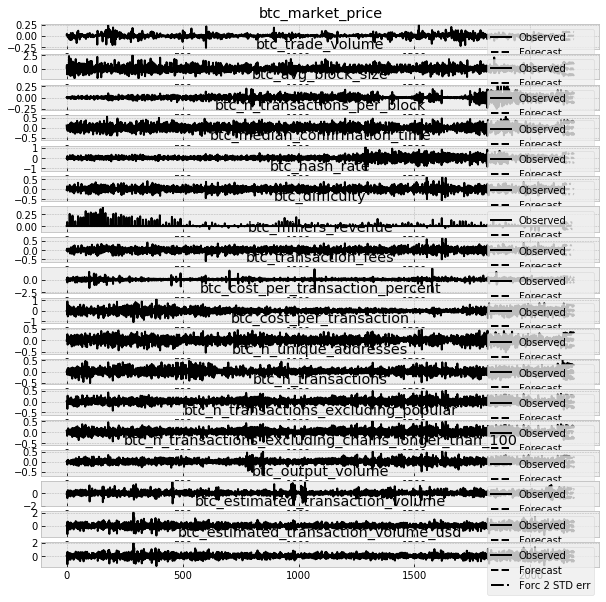

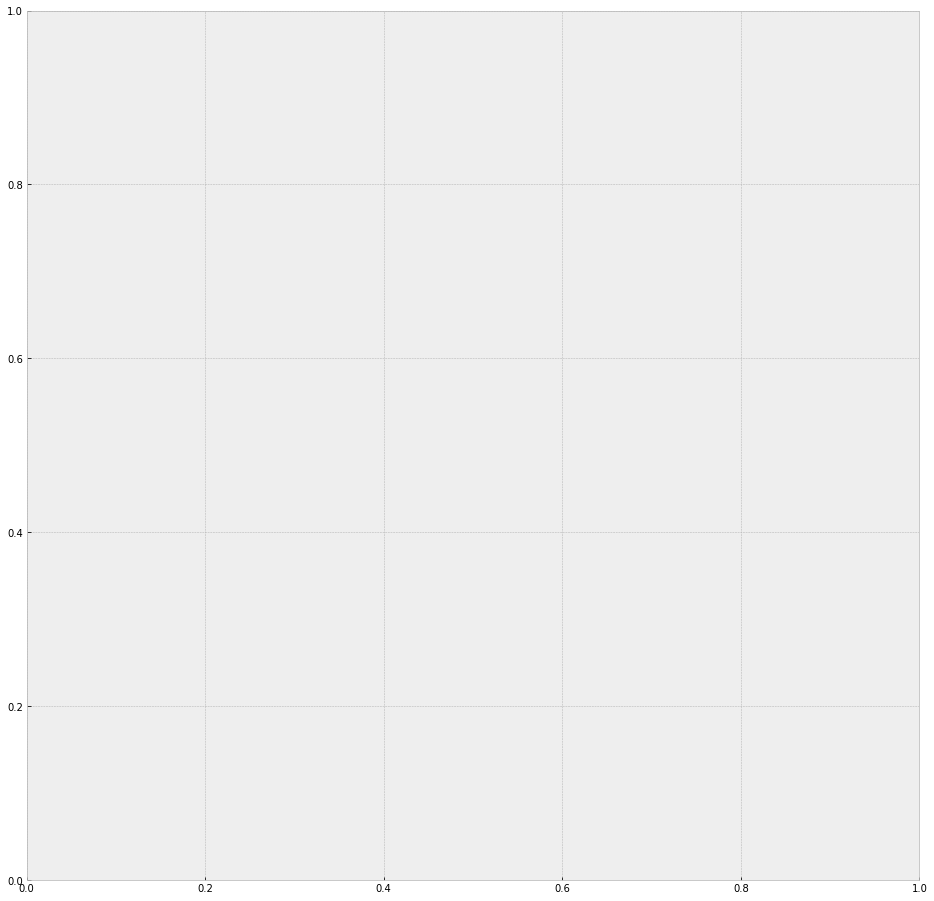

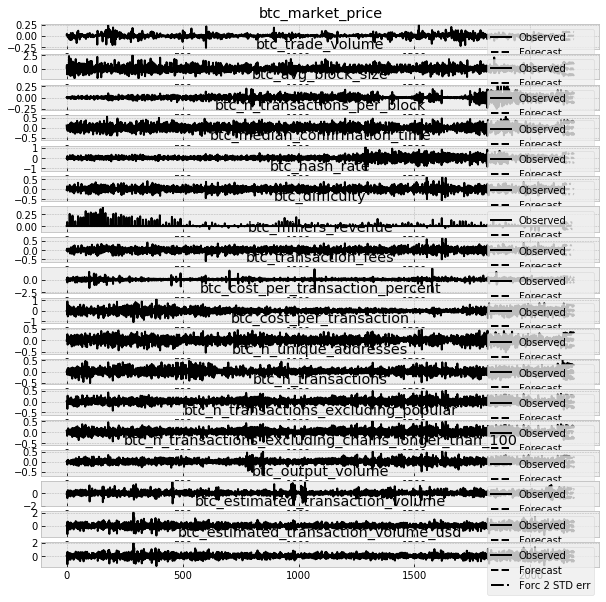

In [193]:
#fig_to_small
fig, ax = plt.subplots(figsize = (16,16))
ax = result.plot_forecast(50)
ax

In [209]:
# make prediction on validation
prediction = result.forecast(Var_train.values[-13:], steps=len(Var_test))
cols = Var_train.columns
#converting predictions to dataframe
pred = pd.DataFrame(index=Var_test.index,columns=[cols])
for j in range(0,18):
    for i in range(0, len(prediction)):
        pred.iloc[i][j] = prediction[i][j]

In [ ]:
np.exp(pred['btc_market_price'].values.astype(float))*btc

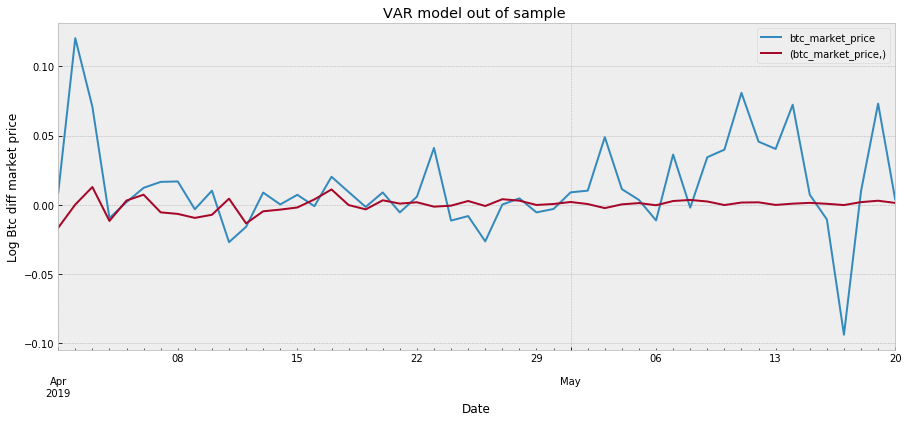

In [257]:
validation = pd.concat([Var_test['btc_market_price'], pred['btc_market_price']], axis = 1)
validation.plot()
plt.title('VAR model out of sample ')
plt.ylabel('Log Btc diff market price')
plt.savefig('VAR_Validation_set_pred.png', format='png', dpi=300)

In [196]:
#compute rmse
print('rmse value for', i, 'is : ', sqrt(mean_squared_error(pred[i], valid[i])))

NameError: name 'sqrt' is not defined

In [123]:
# make prediction on validation
#chage forecast function
prediction = result.forecast(Var_train.values[-7:], steps=len(Var_test))
cols = Var_train.columns
#converting predictions to dataframe
pred = pd.DataFrame(index=Var_test.index,columns=[cols])
for j in range(0,18):
    for i in range(0, len(prediction)):
        pred.iloc[i][j] = prediction[i][j]

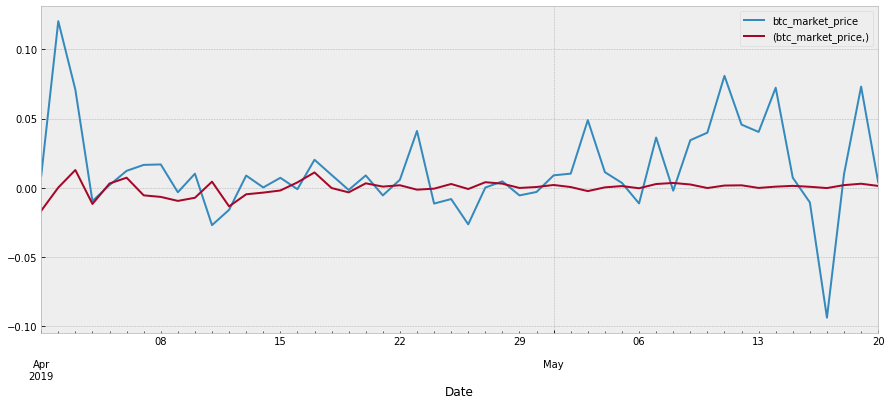

In [256]:
validation = pd.concat([Var_test['btc_market_price'], pred['btc_market_price']], axis = 1)
validation.plot()


In [255]:
mean_absolute_percentage_error(Var_test['btc_market_price'].values[:10], pred.btc_market_price.values[:10])

161.1586201855837

In [ ]:
#correct np.exp
validation_exp = pd.concat([btc_bloackchain_dataset['btc_market_price'][-13:], np.exp(pred['btc_market_price'].values.astype(float)[-13:])*btc_bloackchain_dataset['btc_market_price'][-13:]], axis = 1 )

In [249]:
pred['btc_market_price'].astype(float)

,btc_market_price
Date,
2019-04-01,-0.016520
2019-04-02,0.000228
2019-04-03,0.012885
2019-04-04,-0.011594
2019-04-05,0.003131
2019-04-06,0.007343
2019-04-07,-0.005396
2019-04-08,-0.006523
2019-04-09,-0.009405


In [233]:
btc_bloackchain_dataset['btc_market_price'][-13:]*

Date
2019-05-08    29258.353846
2019-05-09    30282.087500
2019-05-10    31513.062500
2019-05-11    34166.754167
2019-05-12    35762.420833
2019-05-13    37235.570833
2019-05-14    40026.254167
2019-05-15    40319.479167
2019-05-16    39897.875000
2019-05-17    36329.816667
2019-05-18    36692.604167
2019-05-19    39474.633333
2019-05-20    39633.525000
Name: btc_market_price, dtype: float64

VARMAX models

In [ ]:
#create endog and exog
#

endog = 

In [ ]:
# youtube video
#y_train contains all the variables, it doesn't use endogenous or exogenous function parameters
VAR_model =sm.tsa.VARMAX(Var_train, order=(3,0), trend= 'c')
VAR_model_fit  = VAR_model.fit(maxiter = 1000, disp = False)
VAR_model_fit.summary()

In [ ]:
#create a function to find the best VARMAX # model selection 
aic = []
for i in range(1,10):
    model = sm.tsa.VARMAX(Var_train, order = (i,0), trend = 'c')
    model_result = model.fit(disp = False)
    print('Order = ', i)
    print('AIC: ', model.result.aic)

In [ ]:
#model diagnostic
model_result.plot_diagnostics()

In [ ]:
model_results.impulse_response(12, orthogonalized = True).plot(figsize =(12,4))

In [ ]:
rmse = np.sqrt(mean_squared_error(original, forecast))

ARIMA and SARIMAX

In [20]:


#train-test split
#split train-test
# one month predictions
prediction_days = 50
exog_train = btc_bloackchain_dataset_log_transf.drop('btc_market_price', axis = 1)[:len(btc_bloackchain_dataset_log_transf)-prediction_days]
endog_train = btc_bloackchain_dataset_log_transf['btc_market_price'][:len(btc_bloackchain_dataset_log_transf)-prediction_days]
exog_test = btc_bloackchain_dataset_log_transf.drop('btc_market_price', axis = 1)[-prediction_days:]
endog_test = btc_bloackchain_dataset_log_transf['btc_market_price'][-prediction_days:]

In [167]:
endog_train

Date
2019-03-27    8.297136
2019-03-28    8.302776
2019-03-29    8.313001
2019-03-30    8.320775
2019-03-31    8.321255
Name: btc_market_price, dtype: float64

In [151]:
#https://www.kaggle.com/poiupoiu/how-to-use-sarimax

arimax = sm.tsa.SARIMAX(endog_train,order=(1,1,1),seasonal_order=(0,0,0,0),exog = exog_train,freq='D',
                                  enforce_stationarity=False, enforce_invertibility=False,).fit()
arimax.summary()

D:\andrea\Anaconda3\lib\site-packages\statsmodels\base\model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:       btc_market_price   No. Observations:                 2140
Model:               SARIMAX(1, 1, 1)   Log Likelihood                8042.198
Date:                Thu, 06 Jun 2019   AIC                         -16044.397
Time:                        22:56:32   BIC                         -15931.054
Sample:                    05-22-2013   HQIC                        -16002.919
                         - 03-31-2019                                         
Covariance Type:                  opg                                         
=======================================================================================================================
                                                          coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------------
btc_trade_volume                                       -0.0002      0.001     -0.282      0.778      -0.001       0.001
btc_avg_block_size                                     -0.0018      0.004     -0.457      0.648      -0.010       0.006
btc_n_transactions_per_block                           -0.0005      0.007     -0.074      0.941      -0.014       0.013
btc_median_confirmation_time                            0.0012      0.001      1.200      0.230      -0.001       0.003
btc_hash_rate                                          -0.0001      0.012     -0.009      0.993      -0.024       0.024
btc_difficulty                                         -0.0043      0.013     -0.330      0.742      -0.030       0.021
btc_miners_revenue                                      0.0088      0.027      0.331      0.740      -0.043       0.061
btc_transaction_fees                                    0.0004      0.001      0.316      0.752      -0.002       0.003
btc_cost_per_transaction_percent                       -0.0032      0.007     -0.447      0.655      -0.017       0.011
btc_cost_per_transaction                               -0.0073      0.031     -0.239      0.811      -0.067       0.053
btc_n_unique_addresses                                  0.0015      0.005      0.287      0.774      -0.009       0.012
btc_n_transactions                                     -0.0093      0.031     -0.299      0.765      -0.070       0.052
btc_n_transactions_excluding_popular                    0.0017      0.004      0.425      0.671      -0.006       0.010
btc_n_transactions_excluding_chains_longer_than_100     0.0009      0.008      0.113      0.910      -0.014       0.016
btc_output_volume                                      -0.0002      0.001     -0.191      0.848      -0.003       0.002
btc_estimated_transaction_volume                       -0.9923      0.012    -81.455      0.000      -1.016      -0.968
btc_estimated_transaction_volume_usd                    0.9897      0.015     65.345      0.000       0.960       1.019
ar.L1                                                  -0.0133      0.008     -1.731      0.084      -0.028       0.002
ma.L1                                                  -0.7027      0.007    -99.558      0.000      -0.717      -0.689
sigma2                                               3.143e-05   3.16e-07     99.369      0.000    3.08e-05     3.2e-05
===================================================================================
Ljung-Box (Q):                      144.85   Jarque-Bera (JB):          10203567.53
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):             130.00   Skew:                            -9.38
Prob(H) (two-sided):                  0.00   Kurtosis:                       341.00
=============================================================

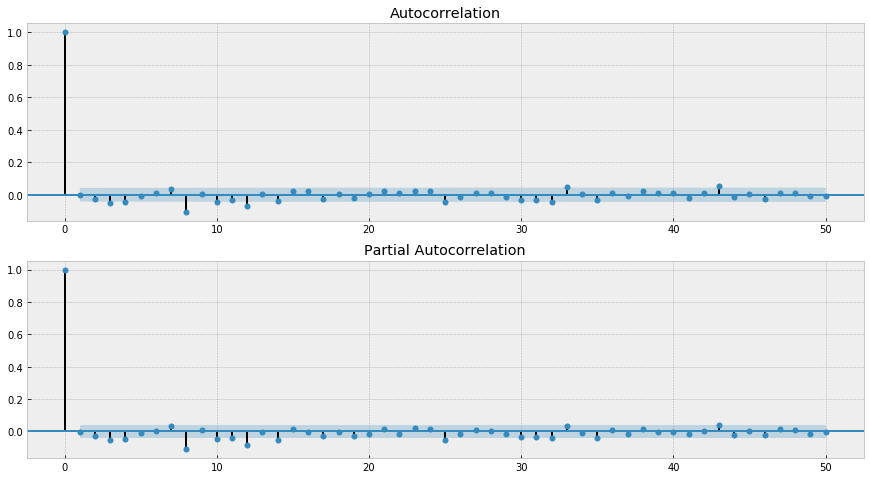

In [152]:
res = arimax.resid
fig,ax = plt.subplots(2,1,figsize=(15,8))
fig = tsaplots.plot_acf(res, lags=50, ax=ax[0])
fig = tsaplots.plot_pacf(res, lags=50, ax=ax[1])

D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:336: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  freq=base_index.freq)


ARIMAX model RMSE:0.0032002494047798295


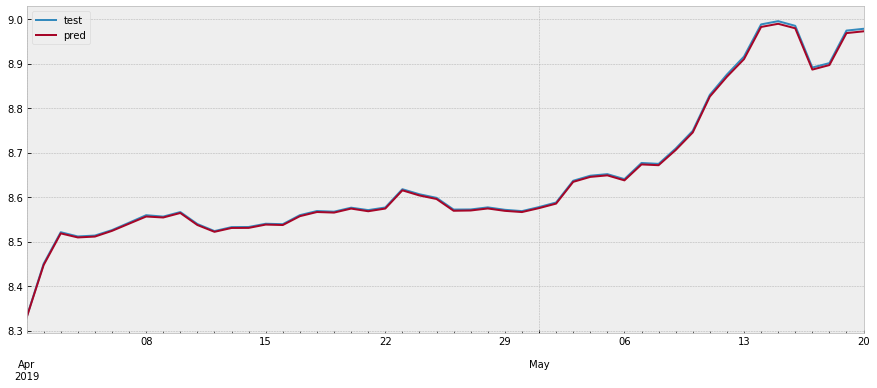

In [170]:
#looks odd
pred = arimax.predict(start='2019-03-31',end=end_test,exog = exog_test)[1:]
print('ARIMAX model RMSE:{}'.format(np.sqrt(mean_squared_error(endog_test,pred))))
pd.DataFrame({'test':endog_test,'pred':pred}).plot()

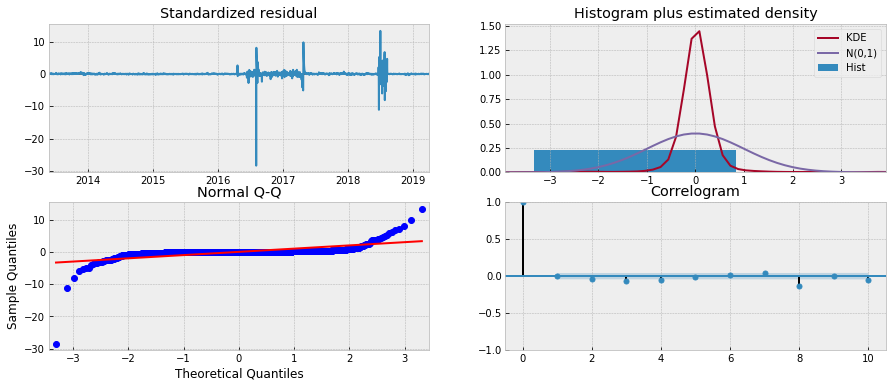

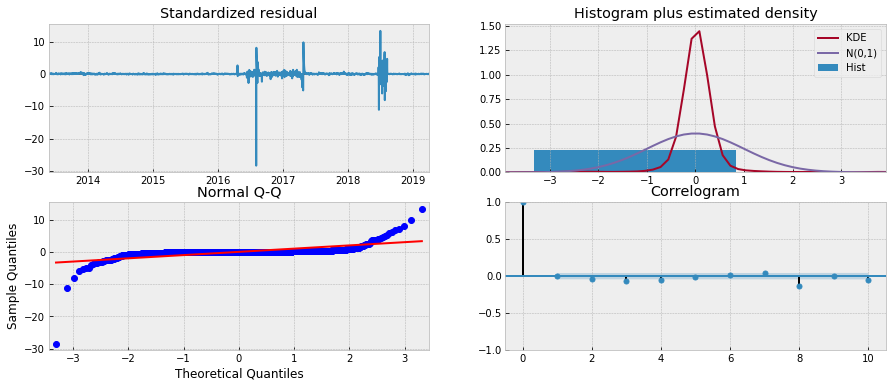

In [172]:
arimax.plot_diagnostics()

In [41]:
# https://github.com/litalert/Cryptocurrency_TimeSeries_Analysis/blob/master/capstone1-making_model.ipynb

arima_d = sm.tsa.ARIMA(endog=endog_train, exog=exog_train, order = [6,1,1])
arima_results_d = arima_d.fit()
print(arima_results_d.summary())

D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\base\model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                             ARIMA Model Results                              
Dep. Variable:     D.btc_market_price   No. Observations:                 2139
Model:                 ARIMA(6, 1, 1)   Log Likelihood                3854.943
Method:                       css-mle   S.D. of innovations              0.040
Date:                Fri, 07 Jun 2019   AIC                          -7657.886
Time:                        19:05:33   BIC                          -7510.516
Sample:                    05-23-2013   HQIC                         -7603.959
                         - 03-31-2019                                         
                                                          coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------------
const                                                   0.0172      0.253      0.068      0.946      -0.478       0.513
btc_trad

In [30]:
# from http://www.blackarbs.com/blog/time-series-analysis-in-python-linear-models-to-garch/11/1/2016

# Optimize ARMA parameters
ps = range(0,8)
d = 1
qs = range(0,8)

parameters = product(ps,  qs)
parameters_list = list(parameters)
len(parameters_list)

def optimize_ARIMAX(endog, exog,  parameters_list):
    '''
    crete a function to optimize the ARIMA order based on the lowest AIC
    '''
    result = []
    best_aic = float('inf')
    
    for param in tqdm_notebook(parameters_list):
        try: 
            model = smtsa.ARIMA(endog=endog, exog=exog_train, order = (param[0], d, param[1])).fit()
            aic = model.aic
            if aic < best_aic:
                best_model = model 
                best_aic = aic
                best_param = param
            result.append([param, model.aic])
        except ValueError:
            pass
    
    result_table = pd.DataFrame(result)
    result_table.columns = ['parameters', 'aic']
    # sorting in ascending order, the lower AIC is - the better
    result_table = result_table.sort_values(by='aic', ascending=True).reset_index(drop=True)
    
    return result_table





In [31]:
result_table_ARIMAX = optimize_ARIMAX(endog_train, exog_train, parameters_list)

D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarn

D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
D:\andrea\Anaconda3\lib\site-packages\st

D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
D:\andrea\Anaconda3\lib\site-packages\st

D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
D:\andrea\Anaconda3\lib\site-packages\st

In [33]:

result_table_ARIMAX




,parameters,aic
0,"(6, 0)",-7659.860573
1,"(5, 0)",-7658.525681
2,"(6, 1)",-7657.886294
3,"(7, 0)",-7657.854317
4,"(0, 6)",-7657.592009
5,"(5, 1)",-7656.279671
6,"(0, 5)",-7656.069039
7,"(7, 1)",-7655.870198
8,"(6, 2)",-7655.867010
9,"(0, 7)",-7655.655953


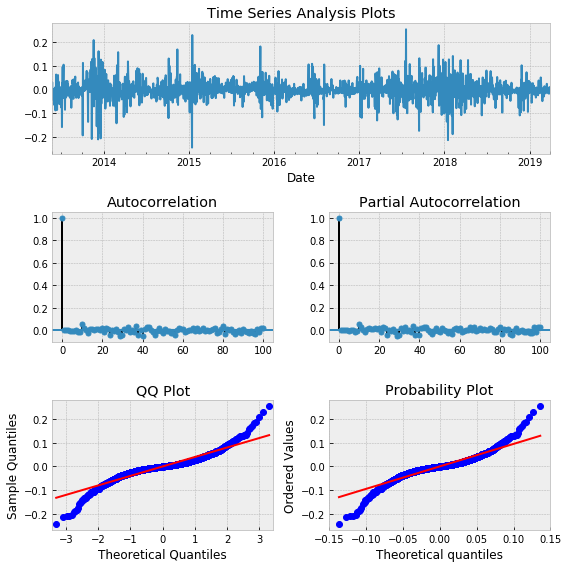

In [56]:
tsplot_QQ(arima_results_d.resid, lags = 100)
plt.savefig('ARIMAX_(6,1,1)_resid_analysis.png', format='png', dpi=300)

'RMSE Out-of sample ARIMA 1320.4484581989896'

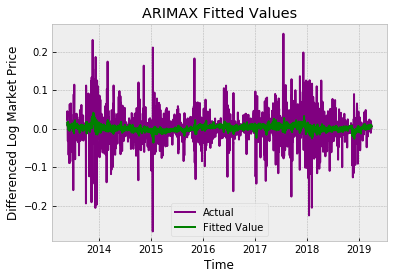

In [55]:
# Plotting the fitted values
plt.plot(endog_train.diff(), color='purple', label='Actual')
plt.plot(arima_results_d.fittedvalues, color='green', label='Fitted Value')
plt.title('ARIMAX Fitted Values')
plt.xlabel('Time')
plt.ylabel('Differenced Log Market Price')
plt.legend()
plt.savefig('ARIMAX_(6,1,1)_In_sample_fitted_values.png', format='png', dpi=300)



f'RMSE Out-of sample ARIMA {np.sqrt(mean_squared_error(np.exp(endog_test), np.exp(arima_results_ofs_d)))}'


D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:336: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  freq=base_index.freq)
D:\andrea\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:320: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  freq=base_index.freq)


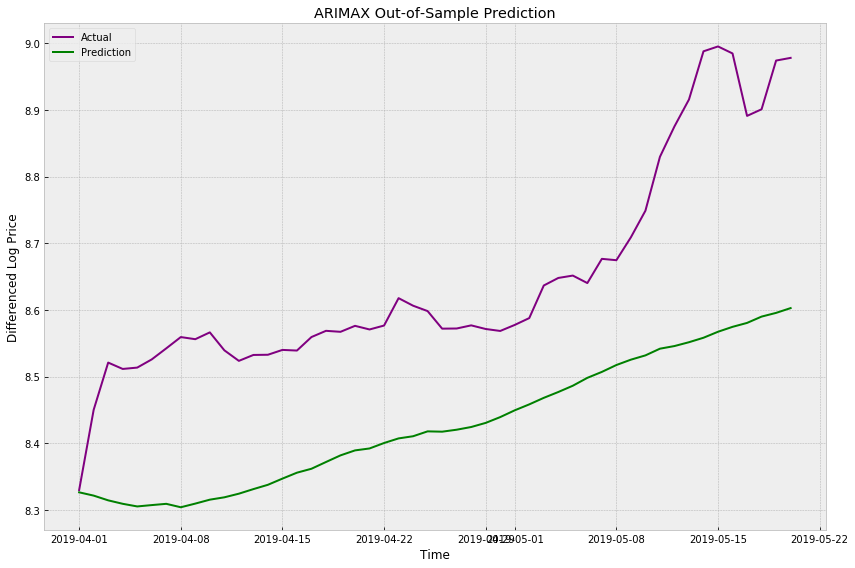

In [57]:
# Out-of-sample prediction
arima_results_ofs_d = arima_results_d.predict(exog=exog_test, start=exog_test.index[0], end=exog_test.index[-1], typ='levels')
plt.figure(figsize=(12,8))
plt.plot(endog_test, color='purple', label='Actual')
plt.plot(arima_results_ofs_d, color='green', label='Prediction')
plt.title('ARIMAX Out-of-Sample Prediction')
plt.xlabel('Time')
plt.ylabel('Differenced Log Price')
plt.legend()
plt.tight_layout()
plt.savefig('ARIMAX_(6,1,1)_Validation_set_pred.png', format='png', dpi=300)


In [43]:
print('MAPE: {}'.format(mean_absolute_percentage_error(np.exp(endog_test), np.exp(arima_results_ofs_d))))

MAPE: 19.201701289603232


In [239]:
arima_results_ofs_d

2019-04-01    8.325744
2019-04-02    8.321098
2019-04-03    8.314096
2019-04-04    8.309063
2019-04-05    8.305632
2019-04-06    8.306901
2019-04-07    8.308010
2019-04-08    8.302681
2019-04-09    8.307685
2019-04-10    8.312918
2019-04-11    8.316173
2019-04-12    8.320801
2019-04-13    8.326313
2019-04-14    8.331630
2019-04-15    8.339931
2019-04-16    8.347609
2019-04-17    8.352859
2019-04-18    8.361866
2019-04-19    8.370501
2019-04-20    8.376008
2019-04-21    8.376804
2019-04-22    8.384370
2019-04-23    8.390529
2019-04-24    8.393708
2019-04-25    8.400199
2019-04-26    8.399407
2019-04-27    8.400977
2019-04-28    8.403629
2019-04-29    8.409062
2019-04-30    8.416635
2019-05-01    8.425730
2019-05-02    8.433202
2019-05-03    8.441866
2019-05-04    8.449001
2019-05-05    8.456760
2019-05-06    8.467242
2019-05-07    8.475340
2019-05-08    8.484723
2019-05-09    8.492033
2019-05-10    8.497901
2019-05-11    8.507115
2019-05-12    8.510466
2019-05-13    8.515921
2019-05-14 